Neural network model - ML project

Neural network structure

      Input Layer           Hidden Layer 1        Hidden Layer 2         Output Layer
         (X)                    (A[1])                (A[2])                (A[3])
          |                        |                     |                      |
          v                        v                     v                      v
          |                        |                     |                      |
          +----> [W1, b1] -----> ReLU ----> [W2, b2] -----> ReLU ----> [W_out, b_out] -----> Sigmoid
                                            ↑
                                            |
                                         ReLU
                                            ↑
                                         ReLU

Data Source: "https://www.kaggle.com/datasets/uciml/default-of-credit-card-clients-dataset/data"
Objective: utilize neural network models to predict default events

General sections
1. run a single model and check its metrics like accuracy, etc
2. fine-tune the model by changing hyerparameters like batch number, etc, to check variation of models regarding metrics
3. fine-tune the model by changing stracture, by changing neuron numbers in each layer


To compare the differences between the models, analyze various aspects such as their architecture, performance metrics (e.g., accuracy, loss), convergence behavior, and any changes made during fine-tuning. Below, I'll outline steps to compare these aspects:

Performance Metrics Comparison: Compare the performance metrics (e.g., accuracy, loss) of the models on the test dataset. 

Type 0 trial:

Multiple training sessions and results comparison.

Type 1 trial and finetuning:

Architecture Comparison: Check if there were any changes in the architecture of the models during fine-tuning. 

Type 2 trial and finetuning:

Hyperparameter Changes: adjust any hyperparameters during fine-tuning, compare these changes and their impact on model performance.

Convergence Behavior: Plot the training histories of the models.



# Section 1 Single model

## Step 1: Data Preprocessing(better treating categorical variables)


In [ ]:
pip install pandas

In [ ]:
pip install sklearn

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import tkinter as tk
from tkinter import filedialog

# No full GUI, keep the root window from appearing
root = tk.Tk()
root.withdraw()

# Open file dialog to choose the dataset file
file_path = filedialog.askopenfilename()
if not file_path:
    print("No file selected. Exiting...")
    exit()

# Data Loading
print("Loading data from file...")
df = pd.read_csv(file_path)

# Separate features and target variable
X = df.drop(columns=['ID', 'default.payment.next.month']).values
y = df['default.payment.next.month'].values

# Categorical columns
categorical_cols = ['SEX', 'EDUCATION', 'MARRIAGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']

# One-hot encoding for categorical variables
encoder = OneHotEncoder(sparse=False)
X_cat = encoder.fit_transform(df[categorical_cols])

# Combine one-hot encoded features with numerical features
X = pd.concat([pd.DataFrame(X_cat), df.drop(columns=categorical_cols+['ID', 'default.payment.next.month'])], axis=1).values

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features by removing the mean and scaling to unit variance
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


Loading data from file...


c:\ProgramData\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


C:\Users\wjbea\AppData\Local\Temp\ipykernel_27992\3744275091.py:10: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating 

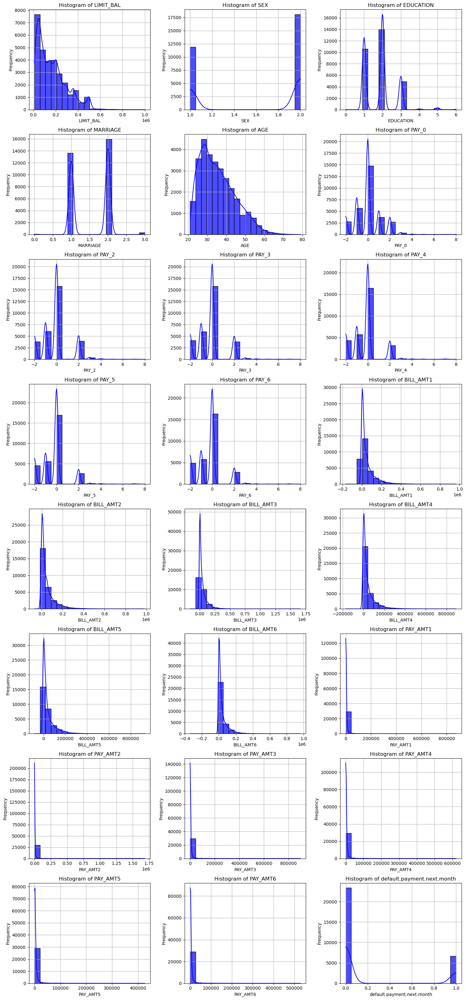

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

: 

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Drop the ID column as it's not relevant for visualization
df.drop(columns=["ID"], inplace=True)

# Convert infinite values to NaN before plotting
with pd.option_context('mode.use_inf_as_na', True):
    # Determine the number of rows needed for the grid
    num_cols = len(df.columns)
    num_rows = math.ceil(num_cols / 3)

    # Plot histograms for each variable in a grid
    fig, axes = plt.subplots(num_rows, 3, figsize=(15, num_rows*4))

    for i, column in enumerate(df.columns):
        row_index = i // 3
        col_index = i % 3
        sns.histplot(df[column], bins=20, color='blue', alpha=0.7, kde=True, ax=axes[row_index, col_index])
        axes[row_index, col_index].set_title(f'Histogram of {column}')
        axes[row_index, col_index].set_xlabel(column)
        axes[row_index, col_index].set_ylabel('Frequency')
        axes[row_index, col_index].grid(True)

    # Adjust layout to avoid overlapping
    plt.tight_layout()
    plt.show()

    # Plot scatter matrix
    sns.pairplot(df)
    plt.show()


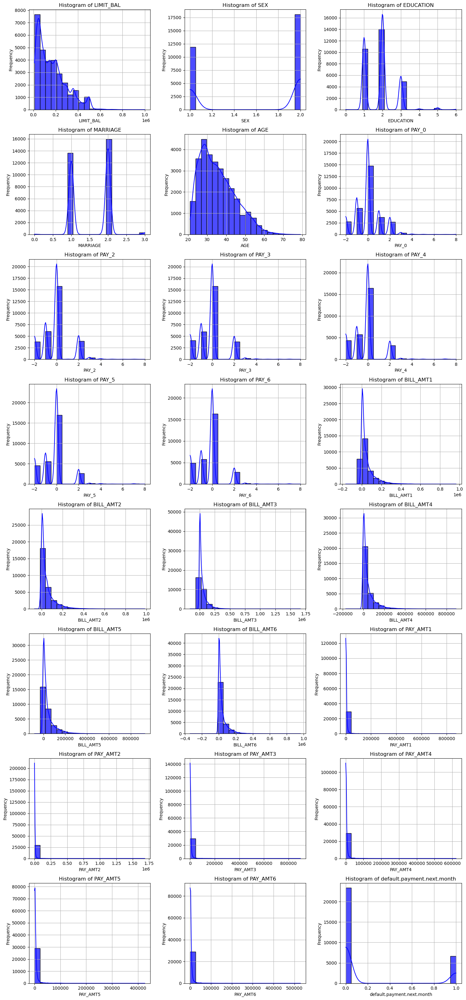

## Step 2: Model Architecture


In [2]:
#pip install tensorflow


In [2]:
import tensorflow as tf

# Define the neural network model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])


## Step 3: Training


In [3]:
# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model
original_history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2)

# Train the original model verbose?
# original_history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2, verbose=0)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print("Original Model Test Accuracy:", accuracy)


Epoch 1/20


600/600 [==============================] - 2s 2ms/step - loss: 0.4496 - accuracy: 0.8146 - val_loss: 0.4442 - val_accuracy: 0.8188
Epoch 2/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4288 - accuracy: 0.8226 - val_loss: 0.4478 - val_accuracy: 0.8169
Epoch 3/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4230 - accuracy: 0.8255 - val_loss: 0.4423 - val_accuracy: 0.8167
Epoch 4/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4196 - accuracy: 0.8252 - val_loss: 0.4413 - val_accuracy: 0.8183
Epoch 5/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4178 - accuracy: 0.8273 - val_loss: 0.4417 - val_accuracy: 0.8160
Epoch 6/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4136 - accuracy: 0.8285 - val_loss: 0.4449 - val_accuracy: 0.8185
Epoch 7/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4110 - accuracy: 0.8294 - val_loss: 0.4459 - val_accuracy: 0.8152
Epo

WARNING:tensorflow:From C:\Users\wjbea\AppData\Roaming\Python\Python311\site-packages\keras\src\optimizers\__init__.py:309: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

Epoch 1/20
WARNING:tensorflow:From C:\Users\wjbea\AppData\Roaming\Python\Python311\site-packages\keras\src\utils\tf_utils.py:492: The name tf.ragged.RaggedTensorValue is deprecated. Please use tf.compat.v1.ragged.RaggedTensorValue instead.

WARNING:tensorflow:From C:\Users\wjbea\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\base_layer_utils.py:384: The name tf.executing_eagerly_outside_functions is deprecated. Please use tf.compat.v1.executing_eagerly_outside_functions instead.

600/600 [==============================] - 2s 2ms/step - loss: 0.4496 - accuracy: 0.8146 - val_loss: 0.4442 - val_accuracy: 0.8188
Epoch 2/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4288 - accuracy: 0.8226 - val_loss: 0.4478 - val_accuracy: 0.8169
Epoch 3/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4230 - accuracy: 0.8255 - val_loss: 0.4423 - val_accuracy: 0.8167
Epoch 4/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4196 - accuracy: 0.8252 - val_loss: 0.4413 - val_accuracy: 0.8183
Epoch 5/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4178 - accuracy: 0.8273 - val_loss: 0.4417 - val_accuracy: 0.8160
Epoch 6/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4136 - accuracy: 0.8285 - val_loss: 0.4449 - val_accuracy: 0.8185
Epoch 7/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4110 - accuracy: 0.8294 - val_loss: 0.4459 - val_accuracy: 0.8152
Epoch 8/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4080 - accuracy: 0.8293 - val_loss: 0.4512 - val_accuracy: 0.8138
Epoch 9/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4053 - accuracy: 0.8306 - val_loss: 0.4525 - val_accuracy: 0.8152
Epoch 10/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4026 - accuracy: 0.8318 - val_loss: 0.4560 - val_accuracy: 0.8108
Epoch 11/20
600/600 [==============================] - 1s 2ms/step - loss: 0.4005 - accuracy: 0.8326 - val_loss: 0.4539 - val_accuracy: 0.8131
Epoch 12/20
600/600 [==============================] - 1s 2ms/step - loss: 0.3971 - accuracy: 0.8351 - val_loss: 0.4580 - val_accuracy: 0.8123
Epoch 13/20
600/600 [==============================] - 1s 2ms/step - loss: 0.3932 - accuracy: 0.8357 - val_loss: 0.4627 - val_accuracy: 0.8069
Epoch 14/20
600/600 [==============================] - 1s 2ms/step - loss: 0.3907 - accuracy: 0.8355 - val_loss: 0.4576 - val_accuracy: 0.8079
Epoch 15/20
600/600 [==============================] - 1s 2ms/step - loss: 0.3885 - accuracy: 0.8380 - val_loss: 0.4741 - val_accuracy: 0.8046
Epoch 16/20
600/600 [==============================] - 1s 2ms/step - loss: 0.3846 - accuracy: 0.8390 - val_loss: 0.4679 - val_accuracy: 0.8100
Epoch 17/20
600/600 [==============================] - 1s 2ms/step - loss: 0.3798 - accuracy: 0.8401 - val_loss: 0.4740 - val_accuracy: 0.8065
Epoch 18/20
600/600 [==============================] - 1s 2ms/step - loss: 0.3779 - accuracy: 0.8407 - val_loss: 0.4722 - val_accuracy: 0.8035
Epoch 19/20
600/600 [==============================] - 1s 2ms/step - loss: 0.3737 - accuracy: 0.8446 - val_loss: 0.4747 - val_accuracy: 0.8067
Epoch 20/20
600/600 [==============================] - 1s 2ms/step - loss: 0.3696 - accuracy: 0.8449 - val_loss: 0.4894 - val_accuracy: 0.8012
188/188 [==============================] - 0s 1ms/step - loss: 0.4749 - accuracy: 0.8090
Original Model Test Accuracy: 0.8090000152587891

In [112]:
import numpy as np

# Print the summary of the model

model.summary()

# Extracting metrics from the original_history object
training_accuracy = original_history.history['accuracy']
validation_accuracy = original_history.history['val_accuracy']
training_loss = original_history.history['loss']
validation_loss = original_history.history['val_loss']

# Calculating final metrics and variance
final_training_accuracy = training_accuracy[-1]
final_validation_accuracy = validation_accuracy[-1]
final_training_loss = training_loss[-1]
final_validation_loss = validation_loss[-1]
variance_accuracy = np.var(validation_accuracy)
variance_loss = np.var(validation_loss)

# Printing the metrics
print("\nModel Performance Metrics:")
print(f"Final Training Accuracy: {final_training_accuracy*100:.2f}%")
print(f"Final Validation Accuracy: {final_validation_accuracy*100:.2f}%")
print(f"Training Accuracy Variance: {np.var(training_accuracy):.4f}")
print(f"Validation Accuracy Variance: {variance_accuracy:.4f}")
print(f"Final Training Loss: {final_training_loss:.4f}")
print(f"Final Validation Loss: {final_validation_loss:.4f}")
print(f"Training Loss Variance: {np.var(training_loss):.4f}")
print(f"Validation Loss Variance: {variance_loss:.4f}")

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_27 (Dense)            (None, 128)               11776     
                                                                 
 dense_28 (Dense)            (None, 64)                8256      
                                                                 
 dense_29 (Dense)            (None, 1)                 65        
                                                                 
Total params: 20097 (78.50 KB)
Trainable params: 20097 (78.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

Model Performance Metrics:
Final Training Accuracy: 84.49%
Final Validation Accuracy: 80.12%
Training Accuracy Variance: 0.0001
Validation Accuracy Variance: 0.0000
Final Training Loss: 0.3696
Final Validation Loss: 0.4894
Training Loss Variance: 0.0004
Validation Loss Variance: 0

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
=================================================================
 dense_27 (Dense)            (None, 128)               11776     
                                                                 
 dense_28 (Dense)            (None, 64)                8256      
                                                                 
 dense_29 (Dense)            (None, 1)                 65        
                                                                 
=================================================================
Total params: 20097 (78.50 KB)
Trainable params: 20097 (78.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

Model Performance Metrics:
Final Training Accuracy: 84.49%
Final Validation Accuracy: 80.12%
Training Accuracy Variance: 0.0001
Validation Accuracy Variance: 0.0000
Final Training Loss: 0.3696
Final Validation Loss: 0.4894
Training Loss Variance: 0.0004
Validation Loss Variance: 0.0002

## Step 4: Evaluation by adding additional training sessions


Compare additional three training sessions

In [18]:
import tensorflow as tf

class TestCallback(tf.keras.callbacks.Callback):
    def __init__(self, test_data):
        super().__init__()
        self.test_data = test_data

    def on_epoch_end(self, epoch, logs=None):
        x, y = self.test_data
        test_loss, test_accuracy = self.model.evaluate(x, y, verbose=0)
        logs['test_loss'] = test_loss
        logs['test_accuracy'] = test_accuracy
        print(f"Epoch {epoch+1}: Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}")

# Function to create and compile the model
def create_model():
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

models = []
histories = []
val_accuracies = []
test_metrics = []

for i in range(3):  # Example: fine-tuning three times
    model = create_model()
    test_callback = TestCallback(test_data=(X_test, y_test))
    history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2, verbose=0, callbacks=[test_callback])
    
    # Store histories and models
    histories.append(history)
    models.append(model)

    # Get last test metrics for display
    last_test_loss = history.history['test_loss'][-1]
    last_test_accuracy = history.history['test_accuracy'][-1]
    test_metrics.append((last_test_loss, last_test_accuracy))

    # Printing detailed metrics from the last epoch of training
    final_training_accuracy = history.history['accuracy'][-1]
    final_training_loss = history.history['loss'][-1]
    final_val_accuracy = history.history['val_accuracy'][-1]
    final_val_loss = history.history['val_loss'][-1]
    val_accuracies.append(final_val_accuracy)

    print(f"Model {i+1} Training Metrics - Final Training Accuracy: {final_training_accuracy:.4f}, Final Training Loss: {final_training_loss:.4f}")
    print(f"Model {i+1} Validation Metrics - Final Validation Accuracy: {final_val_accuracy:.4f}, Final Validation Loss: {final_val_loss:.4f}")
    print(f"Model {i+1} Test Metrics - Final Test Loss: {last_test_loss:.4f}, Final Test Accuracy: {last_test_accuracy:.4f}")
    
    model.summary()

# Identify the best model based on validation accuracy
best_model_index = val_accuracies.index(max(val_accuracies))
best_model = models[best_model_index]
best_test_loss, best_test_accuracy = test_metrics[best_model_index]

print(f"\nBest Model is Model {best_model_index + 1} with Test Loss: {best_test_loss:.4f} and Test Accuracy: {best_test_accuracy:.4f}")


Epoch 1: Test loss: 0.4416, Test accuracy: 0.8212
Epoch 2: Test loss: 0.4450, Test accuracy: 0.8190
Epoch 3: Test loss: 0.4405, Test accuracy: 0.8197
Epoch 4: Test loss: 0.4423, Test accuracy: 0.8190
Epoch 5: Test loss: 0.4420, Test accuracy: 0.8208
Epoch 6: Test loss: 0.4430, Test accuracy: 0.8190
Epoch 7: Test loss: 0.4409, Test accuracy: 0.8182
Epoch 8: Test loss: 0.4419, Test accuracy: 0.8175
Epoch 9: Test loss: 0.4460, Test accuracy: 0.8170
Epoch 10: Test loss: 0.4508, Test accuracy: 0.8172
Epoch 11: Test loss: 0.4522, Test accuracy: 0.8137
Epoch 12: Test loss: 0.4539, Test accuracy: 0.8150
Epoch 13: Test loss: 0.4560, Test accuracy: 0.8148
Epoch 14: Test loss: 0.4745, Test accuracy: 0.8132
Epoch 15: Test loss: 0.4797, Test accuracy: 0.8132
Epoch 16: Test loss: 0.4869, Test accuracy: 0.8088
Epoch 17: Test loss: 0.4864, Test accuracy: 0.8125
Epoch 18: Test loss: 0.4834, Test accuracy: 0.8108
Epoch 19: Test loss: 0.4978, Test accuracy: 0.8098
Epoch 20: Test loss: 0.4917, Test accura

Epoch 1: Test loss: 0.4416, Test accuracy: 0.8212
Epoch 2: Test loss: 0.4450, Test accuracy: 0.8190
Epoch 3: Test loss: 0.4405, Test accuracy: 0.8197
Epoch 4: Test loss: 0.4423, Test accuracy: 0.8190
Epoch 5: Test loss: 0.4420, Test accuracy: 0.8208
Epoch 6: Test loss: 0.4430, Test accuracy: 0.8190
Epoch 7: Test loss: 0.4409, Test accuracy: 0.8182
Epoch 8: Test loss: 0.4419, Test accuracy: 0.8175
Epoch 9: Test loss: 0.4460, Test accuracy: 0.8170
Epoch 10: Test loss: 0.4508, Test accuracy: 0.8172
Epoch 11: Test loss: 0.4522, Test accuracy: 0.8137
Epoch 12: Test loss: 0.4539, Test accuracy: 0.8150
Epoch 13: Test loss: 0.4560, Test accuracy: 0.8148
Epoch 14: Test loss: 0.4745, Test accuracy: 0.8132
Epoch 15: Test loss: 0.4797, Test accuracy: 0.8132
Epoch 16: Test loss: 0.4869, Test accuracy: 0.8088
Epoch 17: Test loss: 0.4864, Test accuracy: 0.8125
Epoch 18: Test loss: 0.4834, Test accuracy: 0.8108
Epoch 19: Test loss: 0.4978, Test accuracy: 0.8098
Epoch 20: Test loss: 0.4917, Test accuracy: 0.8080
Model 1 Training Metrics - Final Training Accuracy: 0.8466, Final Training Loss: 0.3658
Model 1 Validation Metrics - Final Validation Accuracy: 0.8040, Final Validation Loss: 0.4903
Model 1 Test Metrics - Final Test Loss: 0.4917, Final Test Accuracy: 0.8080
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
=================================================================
 dense_21 (Dense)            (None, 128)               11776     
                                                                 
 dense_22 (Dense)            (None, 64)                8256      
                                                                 
 dense_23 (Dense)            (None, 1)                 65        
                                                                 
=================================================================
Total params: 20097 (78.50 KB)
Trainable params: 20097 (78.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1: Test loss: 0.4422, Test accuracy: 0.8173
Epoch 2: Test loss: 0.4386, Test accuracy: 0.8195
Epoch 3: Test loss: 0.4418, Test accuracy: 0.8190
Epoch 4: Test loss: 0.4369, Test accuracy: 0.8195
Epoch 5: Test loss: 0.4375, Test accuracy: 0.8198
Epoch 6: Test loss: 0.4411, Test accuracy: 0.8202
Epoch 7: Test loss: 0.4467, Test accuracy: 0.8195
Epoch 8: Test loss: 0.4448, Test accuracy: 0.8147
Epoch 9: Test loss: 0.4418, Test accuracy: 0.8193
Epoch 10: Test loss: 0.4467, Test accuracy: 0.8167
Epoch 11: Test loss: 0.4505, Test accuracy: 0.8175
Epoch 12: Test loss: 0.4481, Test accuracy: 0.8175
Epoch 13: Test loss: 0.4537, Test accuracy: 0.8180
Epoch 14: Test loss: 0.4587, Test accuracy: 0.8185
Epoch 15: Test loss: 0.4656, Test accuracy: 0.8098
Epoch 16: Test loss: 0.4603, Test accuracy: 0.8150
Epoch 17: Test loss: 0.4724, Test accuracy: 0.8130
Epoch 18: Test loss: 0.4737, Test accuracy: 0.8122
Epoch 19: Test loss: 0.4774, Test accuracy: 0.8120
Epoch 20: Test loss: 0.4751, Test accuracy: 0.8145
Model 2 Training Metrics - Final Training Accuracy: 0.8462, Final Training Loss: 0.3704
Model 2 Validation Metrics - Final Validation Accuracy: 0.8012, Final Validation Loss: 0.4804
Model 2 Test Metrics - Final Test Loss: 0.4751, Final Test Accuracy: 0.8145
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
=================================================================
 dense_24 (Dense)            (None, 128)               11776     
                                                                 
 dense_25 (Dense)            (None, 64)                8256      
                                                                 
 dense_26 (Dense)            (None, 1)                 65        
                                                                 
=================================================================
Total params: 20097 (78.50 KB)
Trainable params: 20097 (78.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1: Test loss: 0.4443, Test accuracy: 0.8187
Epoch 2: Test loss: 0.4435, Test accuracy: 0.8182
Epoch 3: Test loss: 0.4387, Test accuracy: 0.8197
Epoch 4: Test loss: 0.4387, Test accuracy: 0.8192
Epoch 5: Test loss: 0.4388, Test accuracy: 0.8195
Epoch 6: Test loss: 0.4397, Test accuracy: 0.8203
Epoch 7: Test loss: 0.4456, Test accuracy: 0.8203
Epoch 8: Test loss: 0.4486, Test accuracy: 0.8193
Epoch 9: Test loss: 0.4473, Test accuracy: 0.8192
Epoch 10: Test loss: 0.4475, Test accuracy: 0.8148
Epoch 11: Test loss: 0.4514, Test accuracy: 0.8198
Epoch 12: Test loss: 0.4525, Test accuracy: 0.8165
Epoch 13: Test loss: 0.4538, Test accuracy: 0.8170
Epoch 14: Test loss: 0.4560, Test accuracy: 0.8208
Epoch 15: Test loss: 0.4603, Test accuracy: 0.8102
Epoch 16: Test loss: 0.4642, Test accuracy: 0.8140
Epoch 17: Test loss: 0.4686, Test accuracy: 0.8125
Epoch 18: Test loss: 0.4771, Test accuracy: 0.8132
Epoch 19: Test loss: 0.4736, Test accuracy: 0.8067
Epoch 20: Test loss: 0.4749, Test accuracy: 0.8062
Model 3 Training Metrics - Final Training Accuracy: 0.8459, Final Training Loss: 0.3695
Model 3 Validation Metrics - Final Validation Accuracy: 0.7975, Final Validation Loss: 0.4841
Model 3 Test Metrics - Final Test Loss: 0.4749, Final Test Accuracy: 0.8062
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
=================================================================
 dense_27 (Dense)            (None, 128)               11776     
                                                                 
 dense_28 (Dense)            (None, 64)                8256      
                                                                 
 dense_29 (Dense)            (None, 1)                 65        
                                                                 
=================================================================
Total params: 20097 (78.50 KB)
Trainable params: 20097 (78.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________

Best Model is Model 1 with Test Loss: 0.4917 and Test Accuracy: 0.8080

## Step 5: Visual Comparison

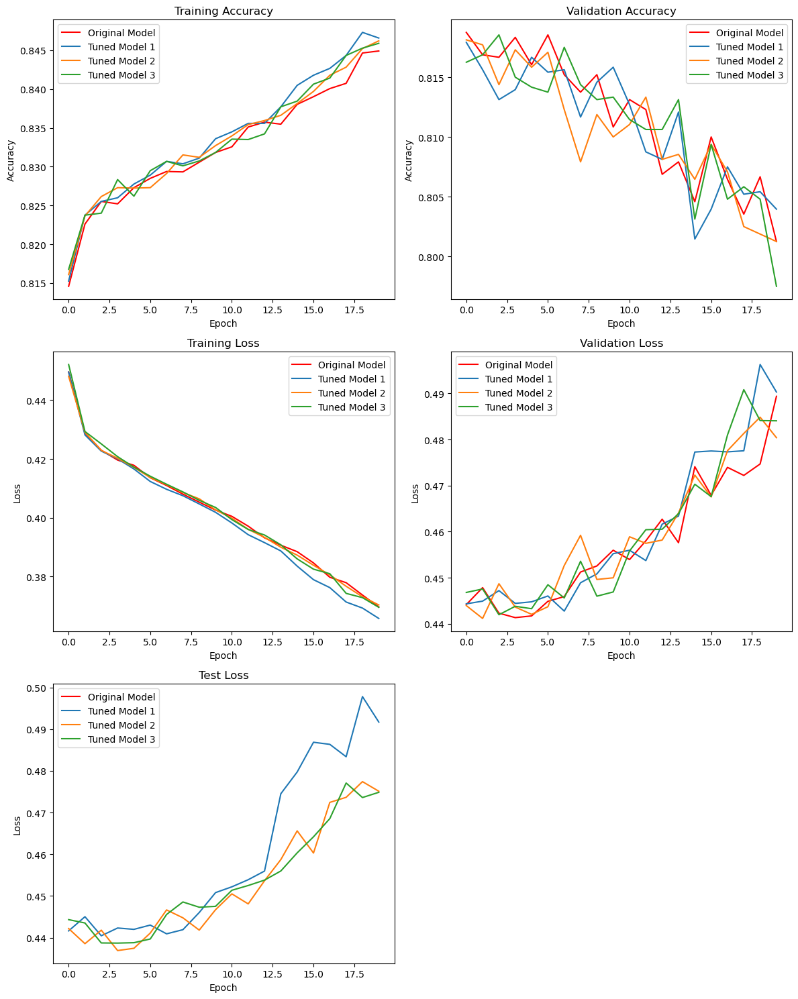

In [19]:
import matplotlib.pyplot as plt

# Assuming you have test_loss data in a similar structure as other metrics
# For example: original_history.history['test_loss'] and history.history['test_loss']

# Set figure size
plt.figure(figsize=(12, 15))

# Compare training accuracy
plt.subplot(3, 2, 1)
plt.plot(original_history.history['accuracy'], label='Original Model', color='red')
for i, history in enumerate(histories):
    plt.plot(history.history['accuracy'], label=f'Tuned Model {i+1}')
plt.title('Training Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Compare validation accuracy
plt.subplot(3, 2, 2)
plt.plot(original_history.history['val_accuracy'], label='Original Model', color='red')
for i, history in enumerate(histories):
    plt.plot(history.history['val_accuracy'], label=f'Tuned Model {i+1}')
plt.title('Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Compare training loss
plt.subplot(3, 2, 3)
plt.plot(original_history.history['loss'], label='Original Model', color='red')
for i, history in enumerate(histories):
    plt.plot(history.history['loss'], label=f'Tuned Model {i+1}')
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Compare validation loss
plt.subplot(3, 2, 4)
plt.plot(original_history.history['val_loss'], label='Original Model', color='red')
for i, history in enumerate(histories):
    plt.plot(history.history['val_loss'], label=f'Tuned Model {i+1}')
plt.title('Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Compare test loss
plt.subplot(3, 2, 5)
plt.plot(original_history.history.get('test_loss', []), label='Original Model', color='red')
for i, history in enumerate(histories):
    plt.plot(history.history.get('test_loss', []), label=f'Tuned Model {i+1}')
plt.title('Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()



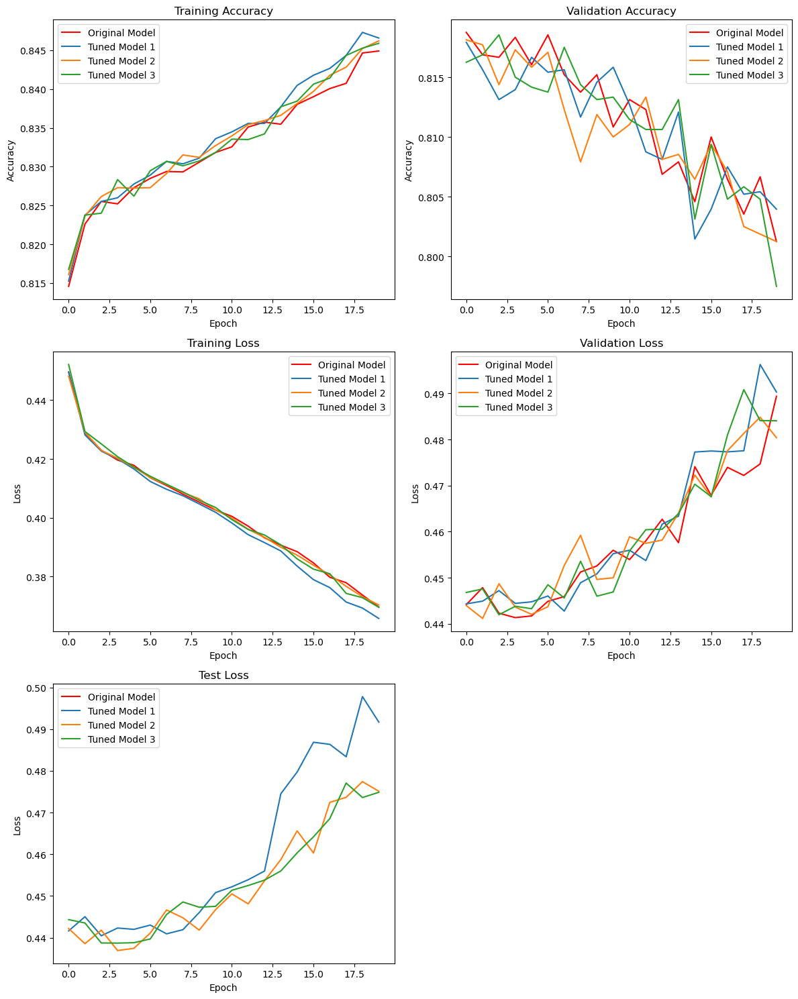

## Step 6: Sampling 20 cases to check the model

1/1 [==============================] - 0s 20ms/step


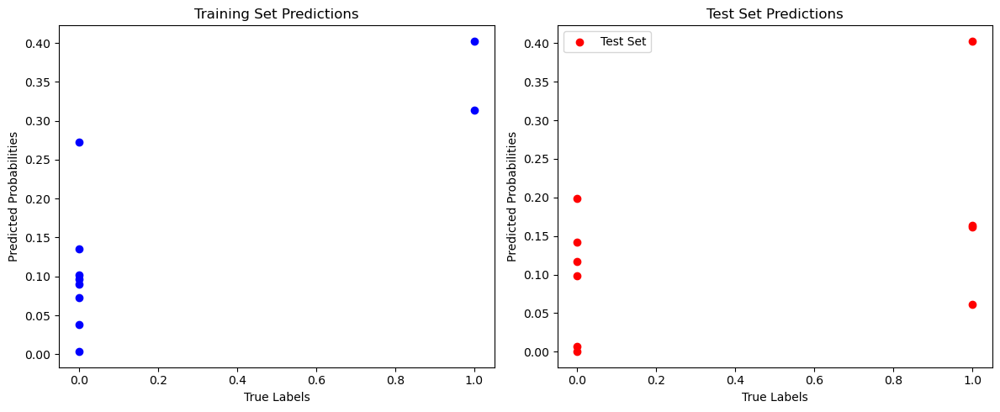

In [20]:
import random
import matplotlib.pyplot as plt

# Randomly select 10 cases from the training set
random.seed(42)  # for reproducibility
train_indices = random.sample(range(len(X_train)), k=10)
test_indices = random.sample(range(len(X_test)), k=10)

# Function to decode model output
def decode_output(output):
    return 1 if output >= 0.5 else 0

# Initialize lists to store predictions
train_true_labels = []
train_predicted_labels = []
train_predicted_probs = []

test_true_labels = []
test_predicted_labels = []
test_predicted_probs = []

# Make predictions on the training set
for idx in train_indices:
    input_sample = X_train[idx]
    true_label = y_train[idx]
    predicted_prob = model.predict(input_sample.reshape(1, -1))[0, 0]
    predicted_label = decode_output(predicted_prob)
    
    train_true_labels.append(true_label)
    train_predicted_labels.append(predicted_label)
    train_predicted_probs.append(predicted_prob)

# Make predictions on the test set
for idx in test_indices:
    input_sample = X_test[idx]
    true_label = y_test[idx]
    predicted_prob = model.predict(input_sample.reshape(1, -1))[0, 0]
    predicted_label = decode_output(predicted_prob)
    
    test_true_labels.append(true_label)
    test_predicted_labels.append(predicted_label)
    test_predicted_probs.append(predicted_prob)

# Plotting
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot training predictions
axes[0].scatter(train_true_labels, train_predicted_probs, color='blue', label='Training Set')
axes[0].set_title('Training Set Predictions')
axes[0].set_xlabel('True Labels')
axes[0].set_ylabel('Predicted Probabilities')

# Plot test predictions
axes[1].scatter(test_true_labels, test_predicted_probs, color='red', label='Test Set')
axes[1].set_title('Test Set Predictions')
axes[1].set_xlabel('True Labels')
axes[1].set_ylabel('Predicted Probabilities')

plt.tight_layout()
plt.legend()
plt.show()


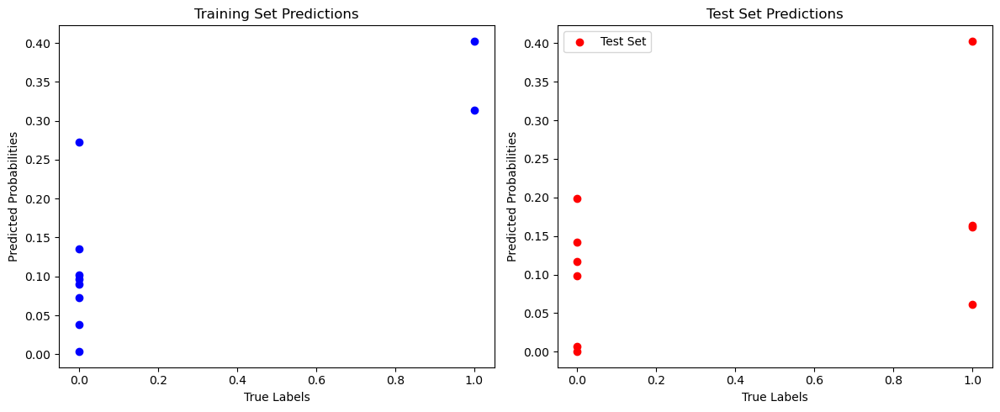

## step 7: output model layers

In [8]:
for layer in model.layers:
    print(layer.get_config())  # Print layer's configuration
    print(layer.get_weights())  # Print layer's weights


{'name': 'dense_9', 'trainable': True, 'dtype': 'float32', 'batch_input_shape': (None, 91), 'units': 128, 'activation': 'relu', 'use_bias': True, 'kernel_initializer': {'module': 'keras.initializers', 'class_name': 'GlorotUniform', 'config': {'seed': None}, 'registered_name': None}, 'bias_initializer': {'module': 'keras.initializers', 'class_name': 'Zeros', 'config': {}, 'registered_name': None}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}
[array([[-0.34895286,  0.01201281, -0.13307273, ..., -0.21278805,
        -0.18258691, -0.25108486],
       [ 0.16567841, -0.2402565 ,  0.09233525, ...,  0.07244123,
        -0.0263452 ,  0.11939079],
       [ 0.25135198,  0.33400875,  0.09434951, ...,  0.31980872,
         0.22936581,  0.1828151 ],
       ...,
       [-0.2639305 , -0.25723118,  0.05139139, ...,  0.40191334,
        -0.34093416,  0.03388142],
       [-0.261041  ,  0.23185252,  0.14336365, ...,

{'name': 'dense_9', 'trainable': True, 'dtype': 'float32', 'batch_input_shape': (None, 91), 'units': 128, 'activation': 'relu', 'use_bias': True, 'kernel_initializer': {'module': 'keras.initializers', 'class_name': 'GlorotUniform', 'config': {'seed': None}, 'registered_name': None}, 'bias_initializer': {'module': 'keras.initializers', 'class_name': 'Zeros', 'config': {}, 'registered_name': None}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}
[array([[-0.34895286,  0.01201281, -0.13307273, ..., -0.21278805,
        -0.18258691, -0.25108486],
       [ 0.16567841, -0.2402565 ,  0.09233525, ...,  0.07244123,
        -0.0263452 ,  0.11939079],
       [ 0.25135198,  0.33400875,  0.09434951, ...,  0.31980872,
         0.22936581,  0.1828151 ],
       ...,
       [-0.2639305 , -0.25723118,  0.05139139, ...,  0.40191334,
        -0.34093416,  0.03388142],
       [-0.261041  ,  0.23185252,  0.14336365, ..., -0.05057188,
         0.07120042, -0.27063882],
       [-0.28424248, -0.07790797, -0.08367033, ...,  0.04228606,
        -0.25409424, -0.04150939]], dtype=float32), array([-0.22523542, -0.25526887, -0.18037726, -0.18353312, -0.15577456,
       -0.27382943,  0.00847239, -0.12887952, -0.2448165 , -0.16868415,
       -0.20627165, -0.01658995, -0.24396792, -0.13832435, -0.04052296,
       -0.10854956, -0.16609938, -0.06173831, -0.2811161 , -0.16108237,
       -0.21985248, -0.06550115, -0.24797983, -0.1506908 , -0.20763458,
       -0.19365206, -0.29163456, -0.08891385,  0.04866282, -0.2910447 ,
       -0.16967858, -0.05085804, -0.29622254, -0.23694856, -0.13163403,
       -0.04446776, -0.18103549, -0.136926  , -0.12898806, -0.22717267,
       -0.15120943, -0.22106348, -0.16820386, -0.02170256, -0.01415865,
       -0.15896682, -0.0927678 , -0.04526434, -0.24757789,  0.02688417,
       -0.02367901, -0.28355083, -0.30693662, -0.09442049, -0.13114202,
       -0.3062211 , -0.11588019, -0.19226037, -0.29796302, -0.28074303,
       -0.13087347, -0.12850928, -0.21781495, -0.08051904, -0.0891399 ,
       -0.12441334, -0.25355396, -0.31154254,  0.05045633, -0.10465044,
       -0.1380761 , -0.08701248, -0.08928563, -0.00456393,  0.01269354,
       -0.21669942, -0.11742659, -0.3983048 , -0.2445104 , -0.18821535,
       -0.2605204 , -0.0863233 , -0.03932237, -0.26904678,  0.01441806,
        0.01511   , -0.09265786,  0.05381887, -0.15125428, -0.18969178,
       -0.10592833, -0.07540254,  0.03264599, -0.28822216, -0.04627088,
        0.00265818, -0.03524004, -0.26689196,  0.06217193, -0.23143974,
       -0.15401973, -0.16324067,  0.01914743, -0.13476288, -0.04514126,
       -0.03797299, -0.20061101, -0.12230746, -0.18737158, -0.16434263,
        0.00354064, -0.0470225 , -0.17586188, -0.19778933, -0.21955106,
        0.05147153, -0.20438597, -0.26658925, -0.29724392, -0.31982127,
       -0.0600569 , -0.0320214 , -0.14444035, -0.09046169, -0.11783994,
       -0.22282912, -0.23929472, -0.10461161], dtype=float32)]
{'name': 'dense_10', 'trainable': True, 'dtype': 'float32', 'units': 64, 'activation': 'relu', 'use_bias': True, 'kernel_initializer': {'module': 'keras.initializers', 'class_name': 'GlorotUniform', 'config': {'seed': None}, 'registered_name': None}, 'bias_initializer': {'module': 'keras.initializers', 'class_name': 'Zeros', 'config': {}, 'registered_name': None}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}
[array([[-0.25504282, -0.05577598,  0.05960509, ...,  0.05257875,
        -0.09581033, -0.03165493],
       [-0.3382737 ,  0.2654177 ,  0.13271675, ...,  0.09321381,
        -0.2094246 , -0.18789949],
       [-0.03864492,  0.16467738, -0.04345155, ..., -0.05761062,
         0.18177988,  0.2341333 ],
       ...,
       [-0.11769672,  0.3973473 , -0.05714713, ..., -0.00795201,
         0.03975541,  0.11185792],
       [-0.01368926, -0.1832547 ,  0.15387647, ...,  0.08025943,
        -0.02710246,  0.06610069],
       [-0.00209075, -0.5267998 , -0.01974206, ..., -0.13231729,
         0.11644025, -0.05150257]], dtype=float32), array([ 0.06738515,  0.11819376, -0.09733424, -0.0726729 ,  0.12581132,
        0.06181548, -0.01984064, -0.02598453,  0.00550217, -0.04937208,
        0.12711716,  0.15733325,  0.03162907,  0.04492915, -0.04113998,
       -0.0822538 , -0.07919246, -0.01495011, -0.0035418 , -0.03536182,
       -0.08214649, -0.03441007, -0.03510763, -0.03113298, -0.04112803,
        0.08855885,  0.02051275, -0.00265452, -0.11603757, -0.04829536,
        0.12311445, -0.06235908, -0.08087553, -0.16775064, -0.01565873,
       -0.01629214, -0.04676663,  0.01584304, -0.03907678,  0.02479071,
       -0.03492992,  0.1461224 ,  0.08843827,  0.08775879, -0.04873688,
        0.08339773,  0.05679819,  0.06871198, -0.00231266,  0.04065555,
       -0.00420853, -0.02511603, -0.03193717,  0.07078734,  0.07537094,
       -0.00459815,  0.06357845,  0.05529359, -0.02189361, -0.03130367,
        0.08144137, -0.05371156, -0.1022651 ,  0.07650752], dtype=float32)]
{'name': 'dense_11', 'trainable': True, 'dtype': 'float32', 'units': 1, 'activation': 'sigmoid', 'use_bias': True, 'kernel_initializer': {'module': 'keras.initializers', 'class_name': 'GlorotUniform', 'config': {'seed': None}, 'registered_name': None}, 'bias_initializer': {'module': 'keras.initializers', 'class_name': 'Zeros', 'config': {}, 'registered_name': None}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}
[array([[-0.08489259],
       [-0.58002496],
       [ 0.29832473],
       [ 0.18486561],
       [-0.21393506],
       [-0.22986707],
       [ 0.15428323],
       [ 0.14431188],
       [ 0.33101475],
       [ 0.07462916],
       [-0.21113561],
       [-0.1799378 ],
       [ 0.12155388],
       [-0.28162184],
       [-0.31172305],
       [ 0.28374925],
       [ 0.17151032],
       [ 0.18440711],
       [ 0.12915762],
       [ 0.01003574],
       [ 0.41498286],
       [-0.21268843],
       [ 0.37450477],
       [ 0.5293554 ],
       [ 0.42027348],
       [-0.28933063],
       [-0.00953442],
       [-0.3512194 ],
       [ 0.00910375],
       [ 0.01425328],
       [-0.06611307],
       [ 0.39496377],
       [ 0.02609257],
       [-0.00228508],
       [ 0.00965341],
       [ 0.4760414 ],
       [ 0.19256896],
       [ 0.45667112],
       [-0.10815147],
       [ 0.15957701],
       [ 0.00101599],
       [-0.2738268 ],
       [-0.0677378 ],
       [-0.36704144],
       [ 0.13736829],
       [-0.1850411 ],
       [-0.34803253],
       [-0.15151061],
       [ 0.16007039],
       [-0.09962377],
       [ 0.43319795],
       [-0.317394  ],
       [ 0.17226337],
       [-0.13515104],
       [-0.3443773 ],
       [ 0.1823725 ],
       [-0.09579681],
       [-0.17021511],
       [ 0.18766786],
       [ 0.6768575 ],
       [-0.04418128],
       [ 0.14214315],
       [ 0.03342289],
       [-0.34987476]], dtype=float32), array([-0.09361923], dtype=float32)]

# Section 2: Hyperparameter tuning

## Step 1: variations setting
now creat more models to fine tune : epochs +- 10 holding others constant. Batch +-10 holding others constant. Validation split+- 0,1 holding others constant.
Changing hyper parameters to check different models.

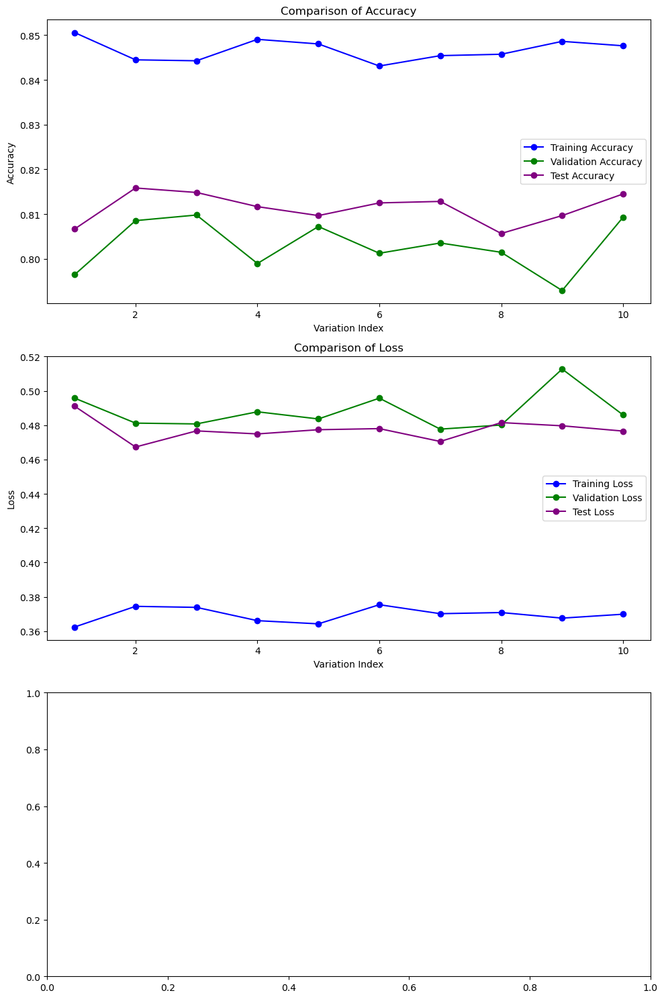

In [65]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Define your model architecture and any required data preprocessing
def create_model():
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Function to train and evaluate the model, with callback for capturing test accuracy and loss
class TestMetrics(tf.keras.callbacks.Callback):
    def __init__(self, test_data):
        self.test_data = test_data
        self.test_losses = []
        self.test_accuracies = []

    def on_epoch_end(self, epoch, logs=None):
        test_loss, test_accuracy = self.model.evaluate(self.test_data[0], self.test_data[1], verbose=0)
        self.test_losses.append(test_loss)
        self.test_accuracies.append(test_accuracy)

def train_model_with_variation(epochs_variation=0, batch_size_variation=0, validation_split_variation=0.0):
    model_variation = create_model()
    epochs = 20 + epochs_variation
    batch_size = 32 + batch_size_variation
    validation_split = 0.2 + validation_split_variation
    
    test_metrics_callback = TestMetrics(test_data=(X_test, y_test))
    history = model_variation.fit(
        X_train, y_train, 
        epochs=epochs, 
        batch_size=batch_size, 
        validation_split=validation_split, 
        verbose=0, 
        callbacks=[test_metrics_callback]
    )

    return history, test_metrics_callback

# Variations
variations = [
    (1, 0, 0.0),  # Increase epochs by 1
    (-1, 0, 0.0),  # Decrease epochs by 1
    (0, 10, 0.0),  # Increase batch size by 10
    (0, -10, 0.0),  # Decrease batch size by 10
    (0, 0, 0.1),  # Increase validation split by 0.1
    (0, 0, -0.1),  # Decrease validation split by 0.1
    (1, 10, 0.0),  # Increase epochs by 1 and batch size by 10
    (-1, -10, 0.0),  # Decrease epochs by 1 and batch size by 10
    (1, 0, -0.1),  # Increase epochs by 1 and decrease validation split by 0.1
    (-1, 0, 0.1)   # Decrease epochs by 1 and increase validation split by 0.1
]

# Training and collecting data
histories = []
test_metrics = []

for variation in variations:
    history, test_metric = train_model_with_variation(*variation)
    histories.append(history)
    test_metrics.append(test_metric)

# Plotting all metrics
fig, ax = plt.subplots(3, 1, figsize=(10, 15))
var_ids = range(1, len(variations) + 1)

# Accuracy Plot (Training, Validation, and Test)
ax[0].plot(var_ids, [h.history['accuracy'][-1] for h in histories], label='Training Accuracy', color='blue', marker='o')
ax[0].plot(var_ids, [h.history['val_accuracy'][-1] for h in histories], label='Validation Accuracy', color='green', marker='o')
ax[0].plot(var_ids, [tm.test_accuracies[-1] for tm in test_metrics], label='Test Accuracy', color='purple', marker='o')
ax[0].set_title('Comparison of Accuracy')
ax[0].set_xlabel('Variation Index')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

# Loss Plot (Training, Validation, and Test)
ax[1].plot(var_ids, [h.history['loss'][-1] for h in histories], label='Training Loss', color='blue', marker='o')
ax[1].plot(var_ids, [h.history['val_loss'][-1] for h in histories], label='Validation Loss', color='green', marker='o')
ax[1].plot(var_ids, [tm.test_losses[-1] for tm in test_metrics], label='Test Loss', color='purple', marker='o')
ax[1].set_title('Comparison of Loss')
ax[1].set_xlabel('Variation Index')
ax[1].set_ylabel('Loss')
ax[1].legend()

plt.tight_layout()
plt.show()


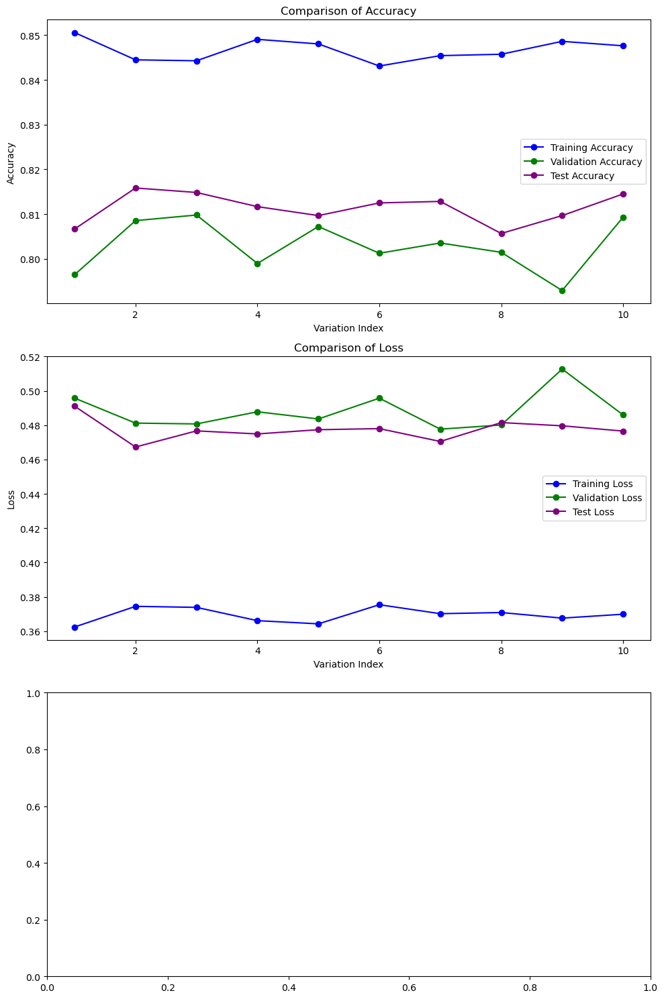

Data Collection

In [66]:
histories = []
test_metrics = []

for variation in variations:
    history, test_metric = train_model_with_variation(*variation)
    histories.append(history)
    test_metrics.append(test_metric)


Plotting

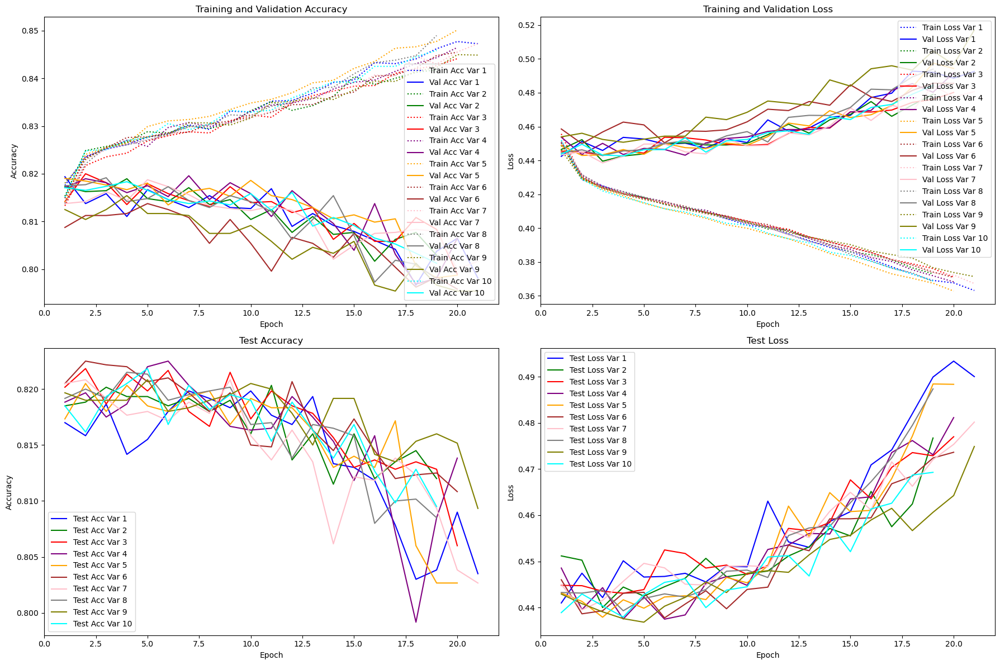

In [83]:
# Set up plot structure
fig, axes = plt.subplots(2, 2, figsize=(18, 12))
axes = axes.flatten()

# Plotting training accuracy, validation accuracy, training loss, validation loss
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'olive', 'cyan']

for i, (history, test_metric) in enumerate(zip(histories, test_metrics)):
    epochs = range(1, len(history.history['accuracy']) + 1)
    
    # Training and Validation Accuracy
    axes[0].plot(epochs, history.history['accuracy'], label=f'Train Acc Var {i+1}', color=colors[i], linestyle='dotted')
    axes[0].plot(epochs, history.history['val_accuracy'], label=f'Val Acc Var {i+1}', color=colors[i], linestyle='solid')
    
    # Training and Validation Loss
    axes[1].plot(epochs, history.history['loss'], label=f'Train Loss Var {i+1}', color=colors[i], linestyle='dotted')
    axes[1].plot(epochs, history.history['val_loss'], label=f'Val Loss Var {i+1}', color=colors[i], linestyle='solid')
    
    # Test Accuracy and Loss
    axes[2].plot(epochs, test_metric.test_accuracies, label=f'Test Acc Var {i+1}', color=colors[i])
    axes[3].plot(epochs, test_metric.test_losses, label=f'Test Loss Var {i+1}', color=colors[i])

axes[0].set_title('Training and Validation Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].set_title('Training and Validation Loss')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()

axes[2].set_title('Test Accuracy')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Accuracy')
axes[2].legend()

axes[3].set_title('Test Loss')
axes[3].set_xlabel('Epoch')
axes[3].set_ylabel('Loss')
axes[3].legend()

plt.tight_layout()
plt.show()



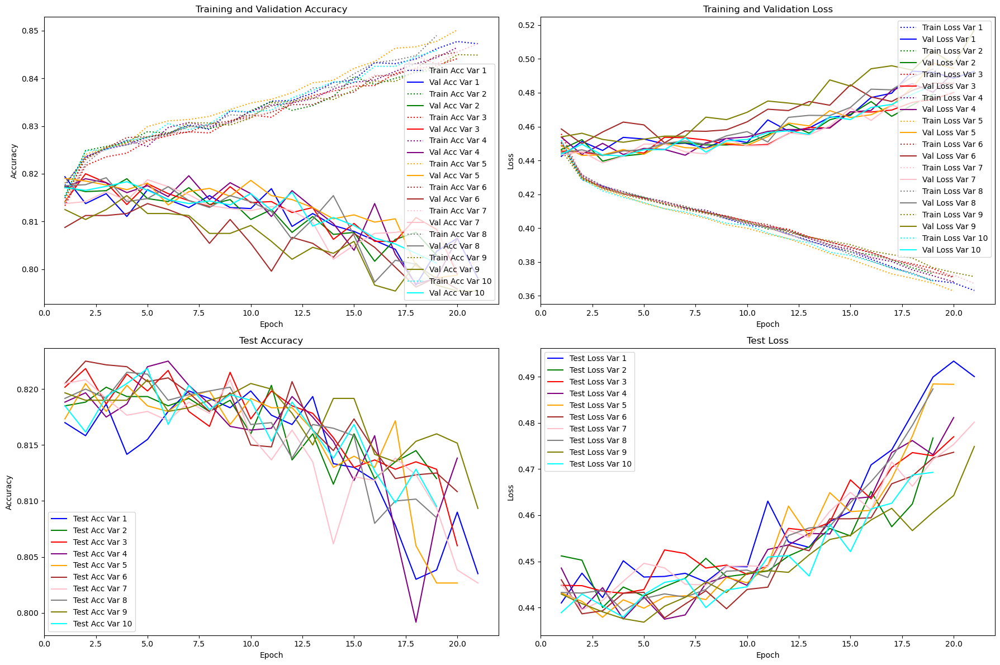

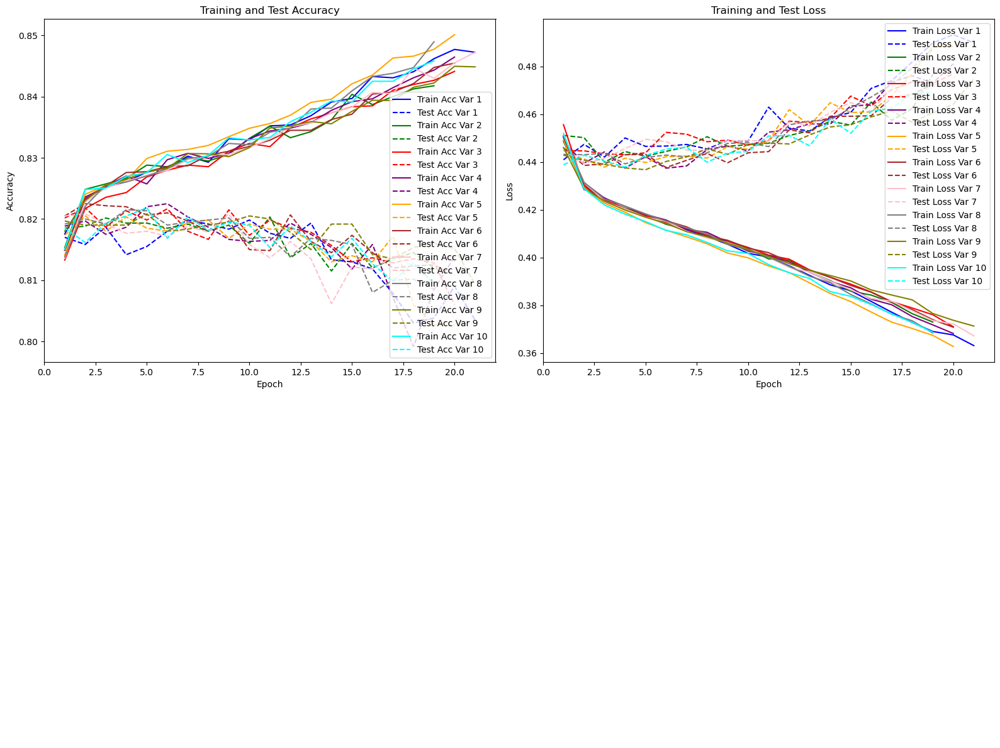

In [97]:
import matplotlib.pyplot as plt

# Set up plot structure
fig, axes = plt.subplots(2, 2, figsize=(16, 12))  # Two rows, two columns
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'olive', 'cyan']

for i, (history, test_metric) in enumerate(zip(histories, test_metrics)):
    epochs = range(1, len(history.history['accuracy']) + 1)
    
    # Training and Test Accuracy
    axes[0, 0].plot(epochs, history.history['accuracy'], label=f'Train Acc Var {i+1}', color=colors[i], linestyle='solid')
    axes[0, 0].plot(epochs, test_metric.test_accuracies, label=f'Test Acc Var {i+1}', color=colors[i], linestyle='dashed')
    
    # Training and Test Loss
    axes[0, 1].plot(epochs, history.history['loss'], label=f'Train Loss Var {i+1}', color=colors[i], linestyle='solid')
    axes[0, 1].plot(epochs, test_metric.test_losses, label=f'Test Loss Var {i+1}', color=colors[i], linestyle='dashed')

# Configure the Training and Test Accuracy graph
axes[0, 0].set_title('Training and Test Accuracy')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Accuracy')
axes[0, 0].legend(loc='lower right')

# Configure the Training and Test Loss graph
axes[0, 1].set_title('Training and Test Loss')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].legend(loc='upper right')

# Hide empty plots if not used
axes[1, 0].axis('off')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()


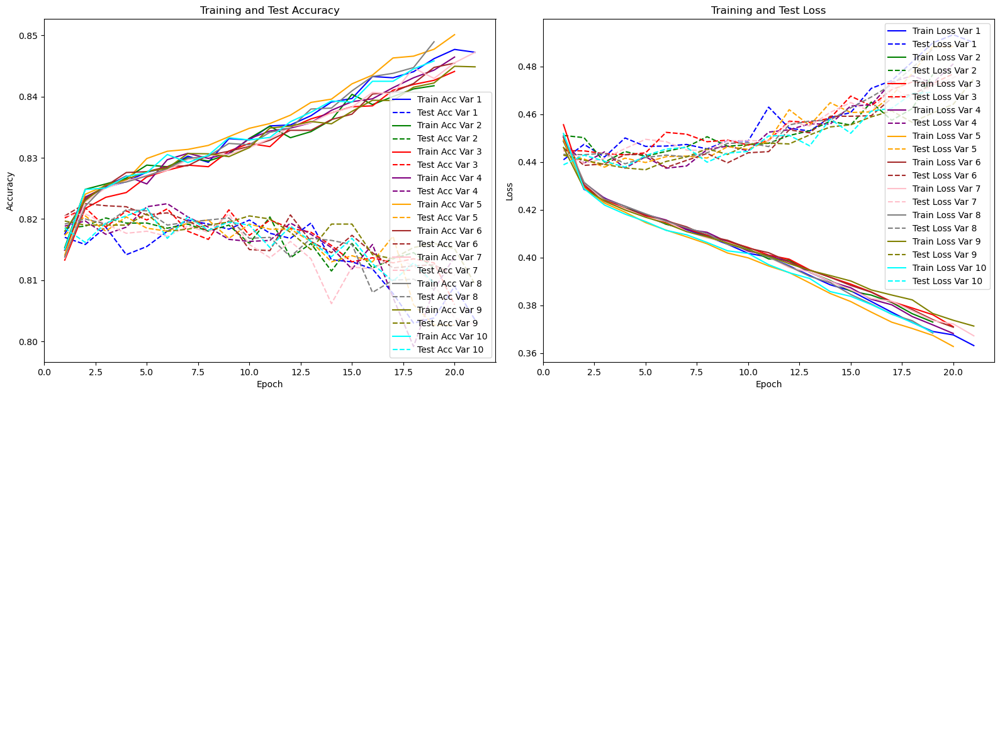

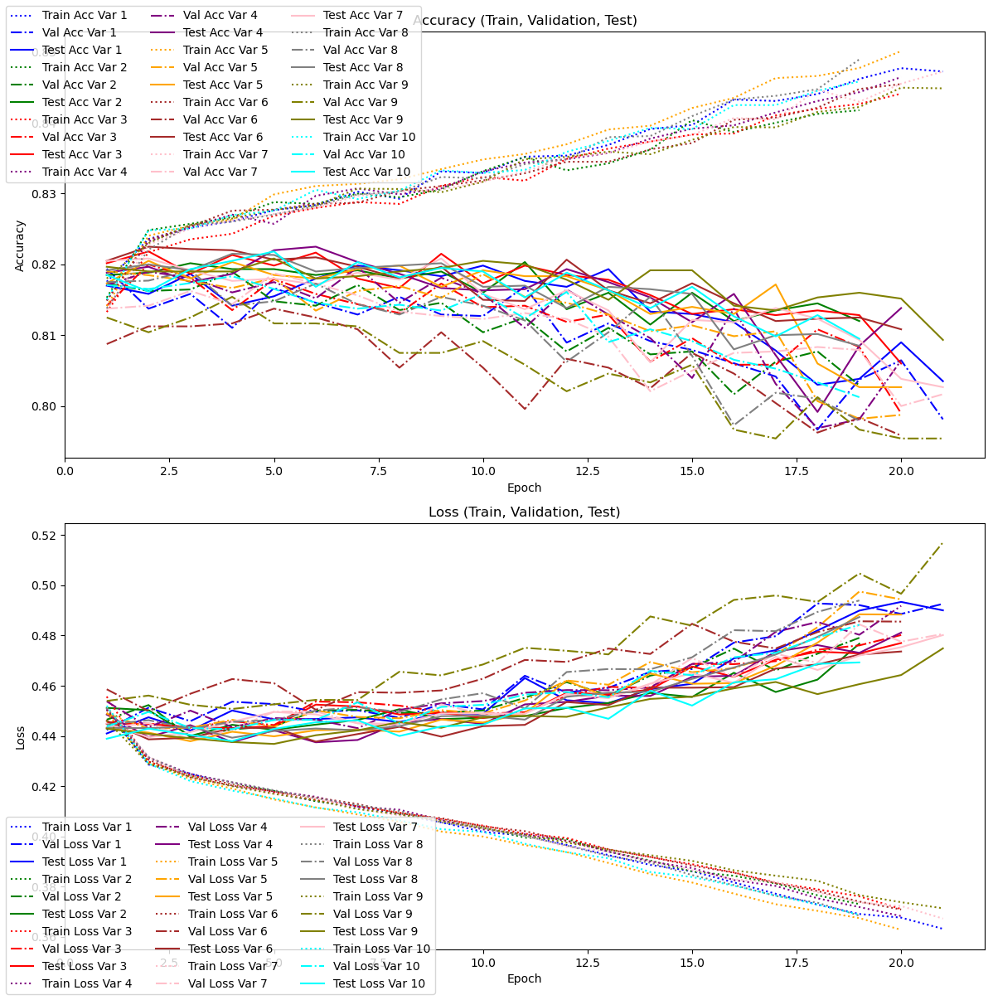

In [96]:
import matplotlib.pyplot as plt

# Set up plot structure
fig, axes = plt.subplots(2, 1, figsize=(12, 12))  # Two rows, one column
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'olive', 'cyan']

for i, (history, test_metric) in enumerate(zip(histories, test_metrics)):
    epochs = range(1, len(history.history['accuracy']) + 1)
    
    # Accuracy Plot (Training, Validation, Test)
    axes[0].plot(epochs, history.history['accuracy'], label=f'Train Acc Var {i+1}', color=colors[i], linestyle='dotted')
    axes[0].plot(epochs, history.history['val_accuracy'], label=f'Val Acc Var {i+1}', color=colors[i], linestyle='dashdot')
    axes[0].plot(epochs, test_metric.test_accuracies, label=f'Test Acc Var {i+1}', color=colors[i], linestyle='solid')
    
    # Loss Plot (Training, Validation, Test)
    axes[1].plot(epochs, history.history['loss'], label=f'Train Loss Var {i+1}', color=colors[i], linestyle='dotted')
    axes[1].plot(epochs, history.history['val_loss'], label=f'Val Loss Var {i+1}', color=colors[i], linestyle='dashdot')
    axes[1].plot(epochs, test_metric.test_losses, label=f'Test Loss Var {i+1}', color=colors[i], linestyle='solid')

# Configure the Accuracy graph
axes[0].set_title('Accuracy (Train, Validation, Test)')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
#axes[0].legend(loc='upper left')
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left', ncol=3)


# Configure the Loss graph
axes[1].set_title('Loss (Train, Validation, Test)')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
#axes[1].legend(loc='lower right')
handles, labels = axes[1].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower left', ncol=3)



plt.tight_layout()
plt.show()


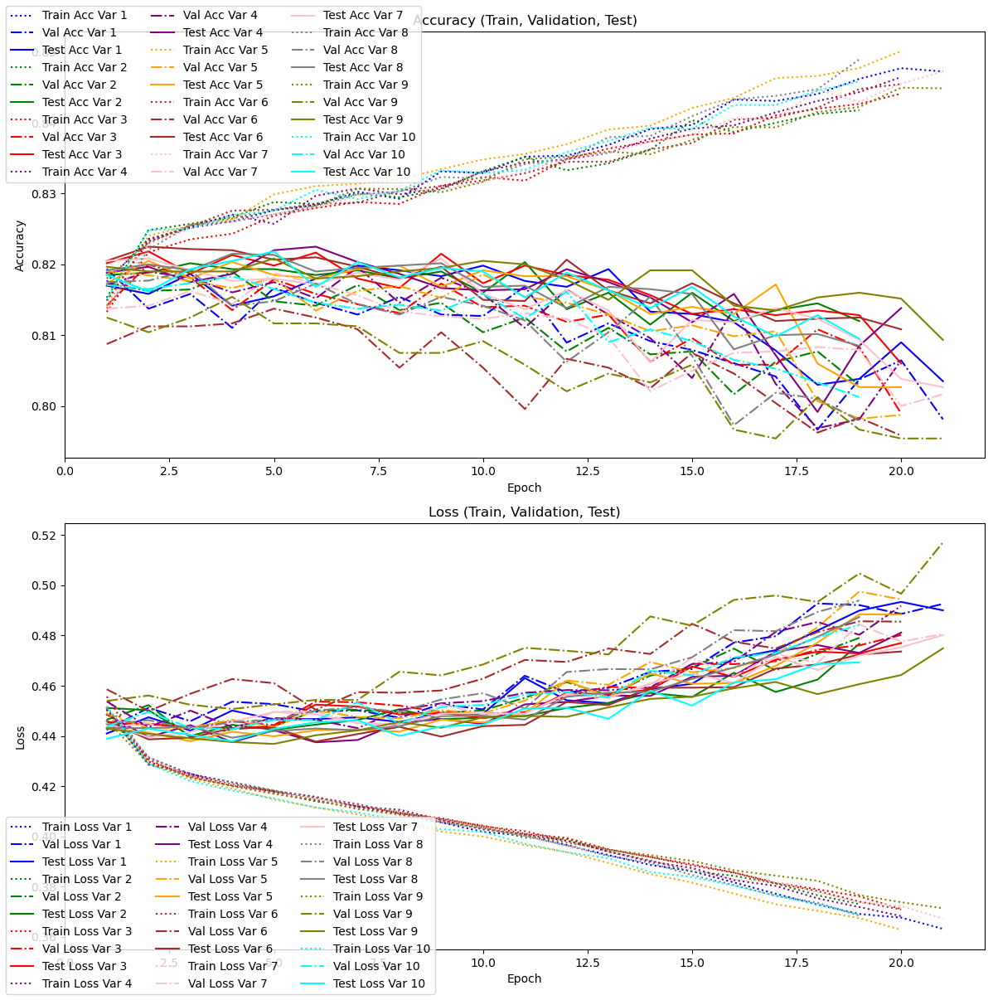

Print best model and scatter plot of metrics

In [99]:
# Identify the best model based on test accuracy
best_model_index = np.argmax([tm.test_accuracies[-1] for tm in test_metrics])  # Index of the best model
best_history = histories[best_model_index]
best_test_metric = test_metrics[best_model_index]

print("\nBest Model Details:")
print(f"Variation Index: {best_model_index + 1}")
print(f"Training Accuracy: {best_history.history['accuracy'][-1]:.4f}")
print(f"Validation Accuracy: {best_history.history['val_accuracy'][-1]:.4f}")
print(f"Test Accuracy: {best_test_metric.test_accuracies[-1]:.4f}")
print(f"Training Loss: {best_history.history['loss'][-1]:.4f}")
print(f"Validation Loss: {best_history.history['val_loss'][-1]:.4f}")
print(f"Test Loss: {best_test_metric.test_losses[-1]:.4f}")



Best Model Details:
Variation Index: 4
Training Accuracy: 0.8465
Validation Accuracy: 0.8065
Test Accuracy: 0.8138
Training Loss: 0.3682
Validation Loss: 0.4918
Test Loss: 0.4811


All models

In [107]:
# Assuming you have 'histories' and 'test_metrics' from your previous training runs

print("All Models' Metrics:")
for i, (history, test_metric) in enumerate(zip(histories, test_metrics)):
    # Retrieve the last epoch's metrics from the history
    final_train_accuracy = history.history['accuracy'][-1]
    final_val_accuracy = history.history['val_accuracy'][-1]
    final_train_loss = history.history['loss'][-1]
    final_val_loss = history.history['val_loss'][-1]
    
    # Retrieve the last recorded test metrics
    final_test_accuracy = test_metric.test_accuracies[-1]
    final_test_loss = test_metric.test_losses[-1]
    
    # Print the collected metrics
    print(f"\nModel Variation {i+1}:")
    print(f"  Training Accuracy: {final_train_accuracy:.4f}")
    print(f"  Validation Accuracy: {final_val_accuracy:.4f}")
    print(f"  Test Accuracy: {final_test_accuracy:.4f}")
    print(f"  Training Loss: {final_train_loss:.4f}")
    print(f"  Validation Loss: {final_val_loss:.4f}")
    print(f"  Test Loss: {final_test_loss:.4f}")


All Models' Metrics:

Model Variation 1:
  Training Accuracy: 0.8472
  Validation Accuracy: 0.7981
  Test Accuracy: 0.8035
  Training Loss: 0.3632
  Validation Loss: 0.4926
  Test Loss: 0.4900

Model Variation 2:
  Training Accuracy: 0.8418
  Validation Accuracy: 0.8029
  Test Accuracy: 0.8120
  Training Loss: 0.3730
  Validation Loss: 0.4791
  Test Loss: 0.4767

Model Variation 3:
  Training Accuracy: 0.8441
  Validation Accuracy: 0.7990
  Test Accuracy: 0.8060
  Training Loss: 0.3711
  Validation Loss: 0.4802
  Test Loss: 0.4770

Model Variation 4:
  Training Accuracy: 0.8465
  Validation Accuracy: 0.8065
  Test Accuracy: 0.8138
  Training Loss: 0.3682
  Validation Loss: 0.4918
  Test Loss: 0.4811

Model Variation 5:
  Training Accuracy: 0.8501
  Validation Accuracy: 0.7987
  Test Accuracy: 0.8027
  Training Loss: 0.3628
  Validation Loss: 0.4944
  Test Loss: 0.4884

Model Variation 6:
  Training Accuracy: 0.8455
  Validation Accuracy: 0.7958
  Test Accuracy: 0.8108
  Training Loss: 

In [108]:
import pandas as pd

# Create a DataFrame to hold all the data
data = {
    "Variation": [f"Var {i+1}" for i in range(len(histories))],
    "Train Accuracy": [h.history['accuracy'][-1] for h in histories],
    "Validation Accuracy": [h.history['val_accuracy'][-1] for h in histories],
    "Test Accuracy": [tm.test_accuracies[-1] for tm in test_metrics],
    "Train Loss": [h.history['loss'][-1] for h in histories],
    "Validation Loss": [h.history['val_loss'][-1] for h in histories],
    "Test Loss": [tm.test_losses[-1] for tm in test_metrics]
}

df = pd.DataFrame(data)

# Display the DataFrame
print(df.to_string(index=False))


Variation  Train Accuracy  Validation Accuracy  Test Accuracy  Train Loss  Validation Loss  Test Loss
    Var 1        0.847240             0.798125       0.803500    0.363166         0.492602   0.490032
    Var 2        0.841771             0.802917       0.812000    0.373027         0.479086   0.476731
    Var 3        0.844115             0.798958       0.806000    0.371068         0.480192   0.477003
    Var 4        0.846458             0.806458       0.813833    0.368240         0.491831   0.481148
    Var 5        0.850119             0.798750       0.802667    0.362796         0.494384   0.488361
    Var 6        0.845463             0.795833       0.810833    0.370867         0.485538   0.473637
    Var 7        0.847240             0.801667       0.802667    0.367261         0.480633   0.480172
    Var 8        0.848958             0.797917       0.808500    0.368417         0.493958   0.487366
    Var 9        0.844861             0.795417       0.809333    0.371354         

Variation  Train Accuracy  Validation Accuracy  Test Accuracy  Train Loss  Validation Loss  Test Loss
    Var 1        0.847240             0.798125       0.803500    0.363166         0.492602   0.490032
    Var 2        0.841771             0.802917       0.812000    0.373027         0.479086   0.476731
    Var 3        0.844115             0.798958       0.806000    0.371068         0.480192   0.477003
    Var 4        0.846458             0.806458       0.813833    0.368240         0.491831   0.481148
    Var 5        0.850119             0.798750       0.802667    0.362796         0.494384   0.488361
    Var 6        0.845463             0.795833       0.810833    0.370867         0.485538   0.473637
    Var 7        0.847240             0.801667       0.802667    0.367261         0.480633   0.480172
    Var 8        0.848958             0.797917       0.808500    0.368417         0.493958   0.487366
    Var 9        0.844861             0.795417       0.809333    0.371354         0.517088   0.474893
   Var 10        0.845833             0.801250       0.809500    0.368786         0.484298   0.469284

Scatter Plot of Training and Test Accuracies, and Losses

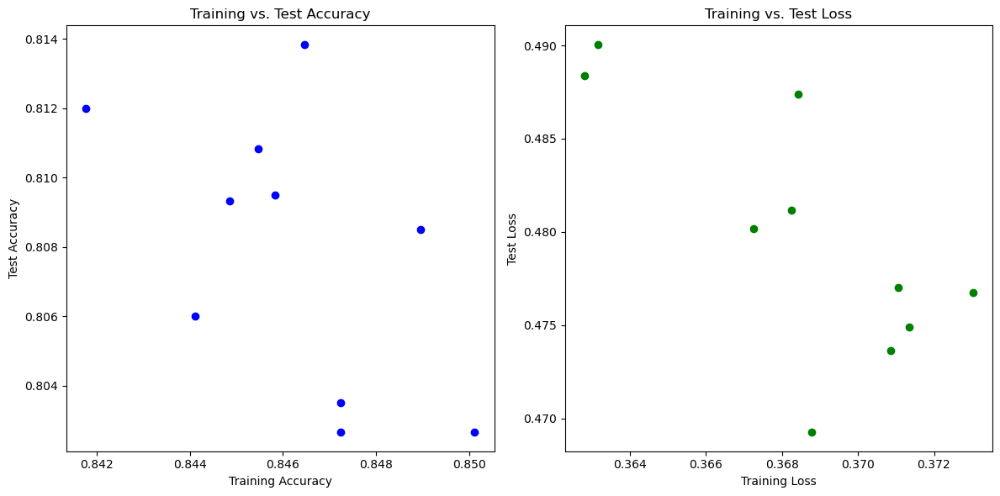

In [101]:
# Prepare data for scatter plots
training_accuracies = [h.history['accuracy'][-1] for h in histories]
test_accuracies = [tm.test_accuracies[-1] for tm in test_metrics]
training_losses = [h.history['loss'][-1] for h in histories]
test_losses = [tm.test_losses[-1] for tm in test_metrics]

# Set up scatter plot
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Scatter plot for Accuracies
ax[0].scatter(training_accuracies, test_accuracies, color='blue')
ax[0].set_title('Training vs. Test Accuracy')
ax[0].set_xlabel('Training Accuracy')
ax[0].set_ylabel('Test Accuracy')

# Scatter plot for Losses
ax[1].scatter(training_losses, test_losses, color='green')
ax[1].set_title('Training vs. Test Loss')
ax[1].set_xlabel('Training Loss')
ax[1].set_ylabel('Test Loss')

plt.tight_layout()
plt.show()


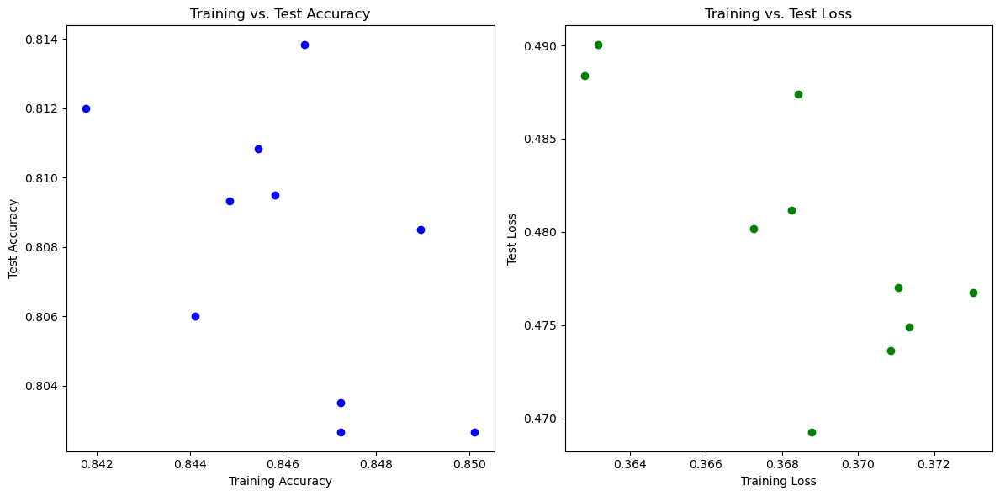

# Section 3: model structure/additional hyperparameter fine tuning 


## step 1: changing numbers of neuron in each layer
assume base case as 128 64 1, make 6 variations on 128 and 6 variations on 64, holding ohters constant in each try

In [113]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt

# Define the input shape
input_shape = X_train.shape[1]  # Assuming X_train is predefined

def create_model(first_layer_neurons, second_layer_neurons):
    model = Sequential()
    model.add(Dense(first_layer_neurons, activation='relu', input_shape=(input_shape,)))
    model.add(Dense(second_layer_neurons, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    return model

first_layer_neurons_variations = [64, 96, 128, 160, 192, 224]
second_layer_neurons_variations = [32, 48, 64, 80, 96, 112]

model_performances = []
models = []
histories = []

for first_layer_neurons in first_layer_neurons_variations:
    for second_layer_neurons in second_layer_neurons_variations:
        model = create_model(first_layer_neurons, second_layer_neurons)
        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
        history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2, verbose=0)
        test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
        
        final_training_accuracy = history.history['accuracy'][-1]
        final_validation_accuracy = history.history['val_accuracy'][-1]
        final_training_loss = history.history['loss'][-1]
        final_validation_loss = history.history['val_loss'][-1]

        # Clean output format
        print(f"Model ({first_layer_neurons},{second_layer_neurons}) - "
              f"Test Acc: {test_accuracy:.4f}, Train Acc: {final_training_accuracy:.4f}, "
              f"Val Acc: {final_validation_accuracy:.4f}, Train Loss: {final_training_loss:.4f}, "
              f"Val Loss: {final_validation_loss:.4f}")
        
        model_performances.append((test_accuracy, final_training_accuracy, final_validation_accuracy, final_training_loss, final_validation_loss, first_layer_neurons, second_layer_neurons))
        models.append(model)
        histories.append(history)

# Finding the best performing model
best_performance = max(model_performances, key=lambda x: x[0])
(best_test_accuracy, best_training_accuracy, best_validation_accuracy,
 best_training_loss, best_validation_loss, best_first_layer_neurons, best_second_layer_neurons) = best_performance

print(f"\nBest Model Configuration: {best_first_layer_neurons} neurons (1st layer), {best_second_layer_neurons} neurons (2nd layer)")
print(f"Best Model Metrics: Test Accuracy: {best_test_accuracy:.4f}, Training Accuracy: {best_training_accuracy:.4f}, "
      f"Validation Accuracy: {best_validation_accuracy:.4f}, Training Loss: {best_training_loss:.4f}, "
      f"Validation Loss: {best_validation_loss:.4f}\n")



Model (64,32) - Test Acc: 0.8125, Train Acc: 0.8405, Val Acc: 0.8046, Train Loss: 0.3843, Val Loss: 0.4732
Model (64,48) - Test Acc: 0.8133, Train Acc: 0.8402, Val Acc: 0.8035, Train Loss: 0.3833, Val Loss: 0.4635
Model (64,64) - Test Acc: 0.8122, Train Acc: 0.8417, Val Acc: 0.8035, Train Loss: 0.3785, Val Loss: 0.4749
Model (64,80) - Test Acc: 0.8125, Train Acc: 0.8409, Val Acc: 0.8069, Train Loss: 0.3807, Val Loss: 0.4771
Model (64,96) - Test Acc: 0.8103, Train Acc: 0.8405, Val Acc: 0.8002, Train Loss: 0.3791, Val Loss: 0.4825
Model (64,112) - Test Acc: 0.8068, Train Acc: 0.8445, Val Acc: 0.8069, Train Loss: 0.3756, Val Loss: 0.4777
Model (96,32) - Test Acc: 0.8143, Train Acc: 0.8424, Val Acc: 0.8083, Train Loss: 0.3793, Val Loss: 0.4699
Model (96,48) - Test Acc: 0.8202, Train Acc: 0.8426, Val Acc: 0.8087, Train Loss: 0.3765, Val Loss: 0.4762
Model (96,64) - Test Acc: 0.8063, Train Acc: 0.8437, Val Acc: 0.8006, Train Loss: 0.3719, Val Loss: 0.4873
Model (96,80) - Test Acc: 0.8082, Tr

Model (64,32) - Test Acc: 0.8125, Train Acc: 0.8405, Val Acc: 0.8046, Train Loss: 0.3843, Val Loss: 0.4732
Model (64,48) - Test Acc: 0.8133, Train Acc: 0.8402, Val Acc: 0.8035, Train Loss: 0.3833, Val Loss: 0.4635
Model (64,64) - Test Acc: 0.8122, Train Acc: 0.8417, Val Acc: 0.8035, Train Loss: 0.3785, Val Loss: 0.4749
Model (64,80) - Test Acc: 0.8125, Train Acc: 0.8409, Val Acc: 0.8069, Train Loss: 0.3807, Val Loss: 0.4771
Model (64,96) - Test Acc: 0.8103, Train Acc: 0.8405, Val Acc: 0.8002, Train Loss: 0.3791, Val Loss: 0.4825
Model (64,112) - Test Acc: 0.8068, Train Acc: 0.8445, Val Acc: 0.8069, Train Loss: 0.3756, Val Loss: 0.4777
Model (96,32) - Test Acc: 0.8143, Train Acc: 0.8424, Val Acc: 0.8083, Train Loss: 0.3793, Val Loss: 0.4699
Model (96,48) - Test Acc: 0.8202, Train Acc: 0.8426, Val Acc: 0.8087, Train Loss: 0.3765, Val Loss: 0.4762
Model (96,64) - Test Acc: 0.8063, Train Acc: 0.8437, Val Acc: 0.8006, Train Loss: 0.3719, Val Loss: 0.4873
Model (96,80) - Test Acc: 0.8082, Train Acc: 0.8465, Val Acc: 0.8044, Train Loss: 0.3671, Val Loss: 0.4758
Model (96,96) - Test Acc: 0.8065, Train Acc: 0.8491, Val Acc: 0.7958, Train Loss: 0.3656, Val Loss: 0.4988
Model (96,112) - Test Acc: 0.8025, Train Acc: 0.8494, Val Acc: 0.7990, Train Loss: 0.3672, Val Loss: 0.4854
Model (128,32) - Test Acc: 0.8103, Train Acc: 0.8439, Val Acc: 0.8044, Train Loss: 0.3743, Val Loss: 0.4837
Model (128,48) - Test Acc: 0.8135, Train Acc: 0.8451, Val Acc: 0.8029, Train Loss: 0.3710, Val Loss: 0.4796
Model (128,64) - Test Acc: 0.8118, Train Acc: 0.8457, Val Acc: 0.8081, Train Loss: 0.3716, Val Loss: 0.4941
Model (128,80) - Test Acc: 0.8072, Train Acc: 0.8481, Val Acc: 0.8012, Train Loss: 0.3644, Val Loss: 0.4843
Model (128,96) - Test Acc: 0.8048, Train Acc: 0.8485, Val Acc: 0.7948, Train Loss: 0.3630, Val Loss: 0.4898
Model (128,112) - Test Acc: 0.8067, Train Acc: 0.8516, Val Acc: 0.8004, Train Loss: 0.3619, Val Loss: 0.4871
Model (160,32) - Test Acc: 0.8127, Train Acc: 0.8450, Val Acc: 0.8065, Train Loss: 0.3758, Val Loss: 0.4769
Model (160,48) - Test Acc: 0.8018, Train Acc: 0.8459, Val Acc: 0.7944, Train Loss: 0.3711, Val Loss: 0.4992
Model (160,64) - Test Acc: 0.8128, Train Acc: 0.8476, Val Acc: 0.8033, Train Loss: 0.3638, Val Loss: 0.4853
Model (160,80) - Test Acc: 0.8002, Train Acc: 0.8488, Val Acc: 0.7967, Train Loss: 0.3631, Val Loss: 0.4978
Model (160,96) - Test Acc: 0.8113, Train Acc: 0.8500, Val Acc: 0.7979, Train Loss: 0.3613, Val Loss: 0.4977
Model (160,112) - Test Acc: 0.8125, Train Acc: 0.8518, Val Acc: 0.8027, Train Loss: 0.3554, Val Loss: 0.4895
Model (192,32) - Test Acc: 0.8120, Train Acc: 0.8456, Val Acc: 0.8058, Train Loss: 0.3708, Val Loss: 0.4772
Model (192,48) - Test Acc: 0.8128, Train Acc: 0.8449, Val Acc: 0.8065, Train Loss: 0.3710, Val Loss: 0.4753
Model (192,64) - Test Acc: 0.8063, Train Acc: 0.8486, Val Acc: 0.8002, Train Loss: 0.3652, Val Loss: 0.4916
Model (192,80) - Test Acc: 0.8105, Train Acc: 0.8489, Val Acc: 0.8023, Train Loss: 0.3630, Val Loss: 0.4924
Model (192,96) - Test Acc: 0.8082, Train Acc: 0.8532, Val Acc: 0.7987, Train Loss: 0.3565, Val Loss: 0.5023
Model (192,112) - Test Acc: 0.8132, Train Acc: 0.8507, Val Acc: 0.8042, Train Loss: 0.3584, Val Loss: 0.5052
Model (224,32) - Test Acc: 0.8033, Train Acc: 0.8460, Val Acc: 0.7940, Train Loss: 0.3685, Val Loss: 0.5009
Model (224,48) - Test Acc: 0.8132, Train Acc: 0.8465, Val Acc: 0.8035, Train Loss: 0.3680, Val Loss: 0.4822
Model (224,64) - Test Acc: 0.8077, Train Acc: 0.8464, Val Acc: 0.8056, Train Loss: 0.3671, Val Loss: 0.4848
Model (224,80) - Test Acc: 0.8055, Train Acc: 0.8501, Val Acc: 0.7990, Train Loss: 0.3597, Val Loss: 0.5065
Model (224,96) - Test Acc: 0.7988, Train Acc: 0.8483, Val Acc: 0.7975, Train Loss: 0.3625, Val Loss: 0.5045
Model (224,112) - Test Acc: 0.8053, Train Acc: 0.8502, Val Acc: 0.7973, Train Loss: 0.3571, Val Loss: 0.5014

Best Model Configuration: 96 neurons (1st layer), 48 neurons (2nd layer)
Best Model Metrics: Test Accuracy: 0.8202, Training Accuracy: 0.8426, Validation Accuracy: 0.8087, Training Loss: 0.3765, Validation Loss: 0.4762


Plot Accuracy and Loss for Each Epoch

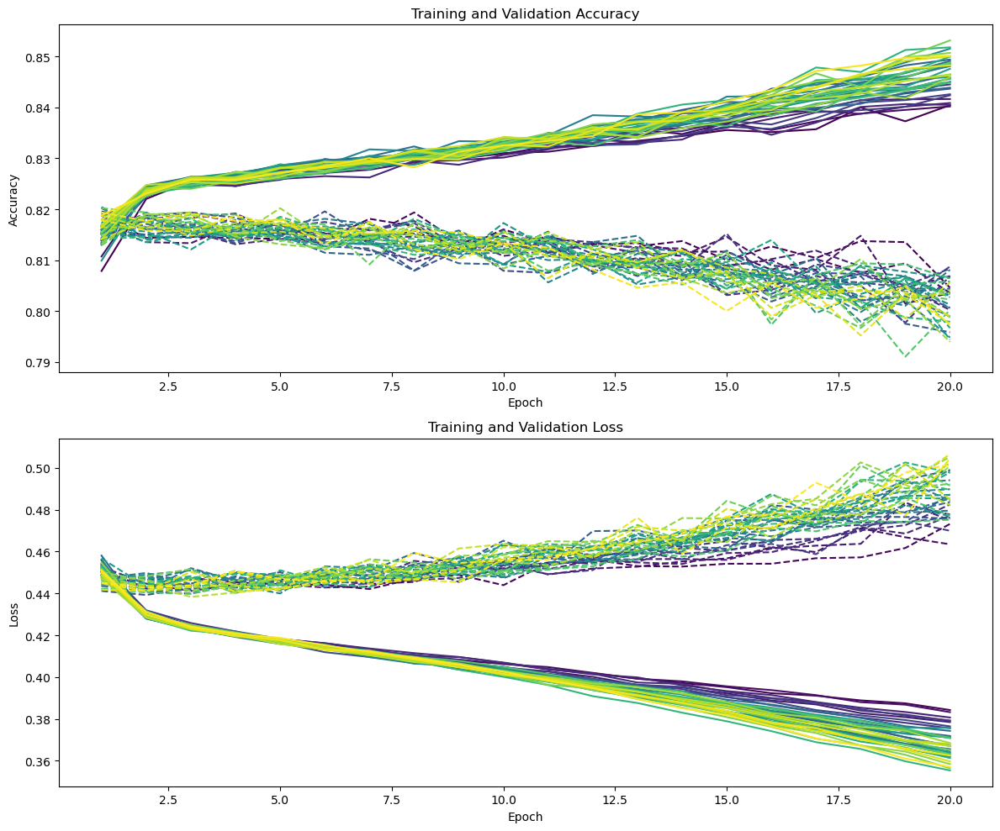

In [123]:
import matplotlib.pyplot as plt
import numpy as np

def plot_train_val_metrics(histories):
    fig, axes = plt.subplots(2, 1, figsize=(12, 10))  # Two plots: one for accuracy and one for loss

    # Generate a color map that varies between two shades
    colors = plt.cm.viridis(np.linspace(0, 1, len(histories) * 2))  # Create more colors than models for variety

    for i, history in enumerate(histories):
        epochs = range(1, len(history.history['accuracy']) + 1)

        # Training accuracy and loss
        train_acc_color = colors[i * 2]  # Even index
        train_loss_color = colors[i * 2 + 1]  # Odd index

        # Validation accuracy and loss
        val_acc_color = colors[i * 2]  # Matching train color but different line style
        val_loss_color = colors[i * 2 + 1]  # Matching train color but different line style

        # Plot training and validation accuracy
        axes[0].plot(epochs, history.history['accuracy'], label=f'Model {i+1} Train Acc', linestyle='-', color=train_acc_color)
        axes[0].plot(epochs, history.history['val_accuracy'], label=f'Model {i+1} Val Acc', linestyle='--', color=val_acc_color)
        
        # Plot training and validation loss
        axes[1].plot(epochs, history.history['loss'], label=f'Model {i+1} Train Loss', linestyle='-', color=train_loss_color)
        axes[1].plot(epochs, history.history['val_loss'], label=f'Model {i+1} Val Loss', linestyle='--', color=val_loss_color)

    # Configure the accuracy plot
    axes[0].set_title('Training and Validation Accuracy')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')


    # Configure the loss plot
    axes[1].set_title('Training and Validation Loss')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')


    plt.tight_layout()
    plt.show()

# Example of using the function with your model histories
plot_train_val_metrics(histories)


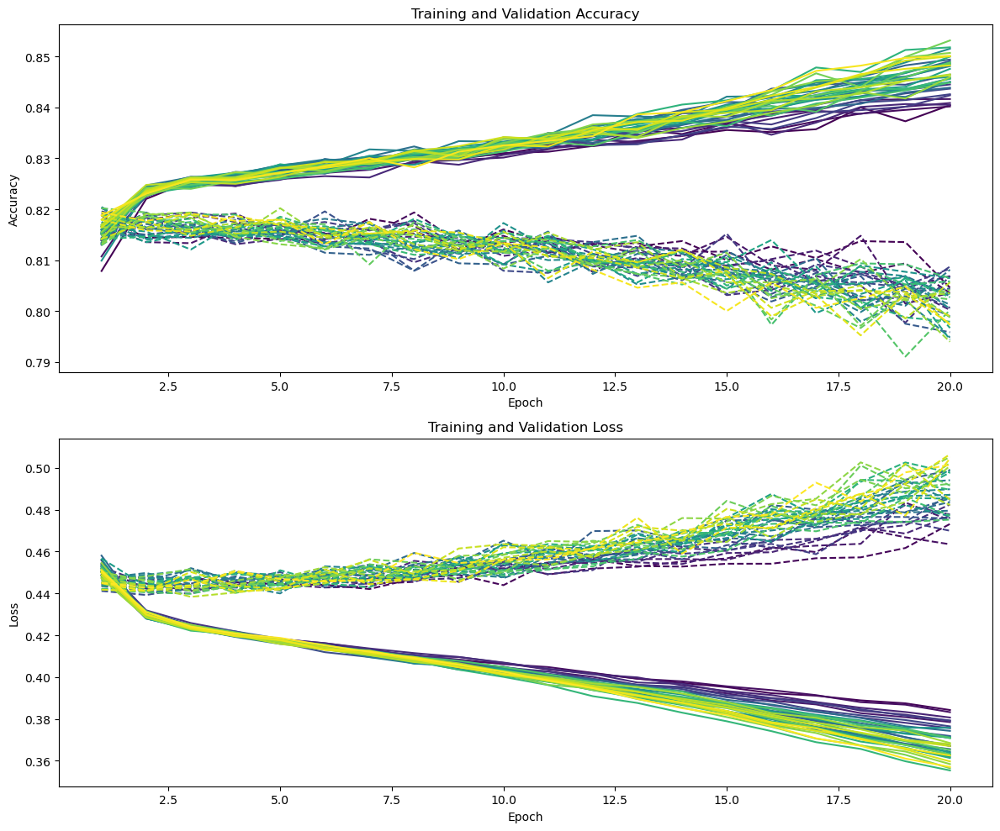

# redo training loop

Step 1: Modify the Training Loop


In [133]:
from tensorflow.keras.callbacks import Callback

class TestMetrics(Callback):
    def __init__(self, test_data):
        super().__init__()
        self.test_data = test_data
        self.test_loss = []
        self.test_accuracy = []

    def on_epoch_end(self, epoch, logs=None):
        x, y = self.test_data
        test_loss, test_accuracy = self.model.evaluate(x, y, verbose=0)
        self.test_loss.append(test_loss)
        self.test_accuracy.append(test_accuracy)


Now, integrate this callback into your training loop:



In [140]:
for first_layer_neurons in first_layer_neurons_variations:
    for second_layer_neurons in second_layer_neurons_variations:
        model = create_model(first_layer_neurons, second_layer_neurons)
        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
        
        # Create an instance of the callback with test data
        test_metrics = TestMetrics((X_test, y_test))
        
        history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2, verbose=0, callbacks=[test_metrics])
        
        # Append the histories including test metrics
        histories.append({
            'train': {
                'accuracy': history.history['accuracy'],
                'loss': history.history['loss'],
                'val_accuracy': history.history['val_accuracy'],
                'val_loss': history.history['val_loss']
            },
            'test': {
                'accuracy': test_metrics.test_accuracy,
                'loss': test_metrics.test_loss
            }
        })


In [160]:
def plot_train_val_test_metrics(histories):
    fig, axes = plt.subplots(2, 1, figsize=(12, 10))  # Two plots: one for accuracy and one for loss

    # Define shades of red, blue, and green
    red_shade = '#FF5733'
    blue_shade = '#3366FF'
    green_shade = '#33FF57'

    for i, history_data in enumerate(histories):
        if isinstance(history_data, dict):  # Check if it's a direct dictionary
            train_loss = history_data['train']['loss']
            train_acc = history_data['train']['accuracy']
            val_loss = history_data['train']['val_loss']
            val_acc = history_data['train']['val_accuracy']
            test_loss = history_data['test']['loss']
            test_acc = history_data['test']['accuracy']
            epochs = range(1, len(train_acc) + 1)
        else:  # Assume it's an instance of History class
            epochs = range(1, len(history_data.history['accuracy']) + 1)
            train_loss = history_data.history['loss']
            train_acc = history_data.history['accuracy']
            val_loss = history_data.history['val_loss']
            val_acc = history_data.history['val_accuracy']
            # If available, extract test metrics
            if 'test' in history_data.history.keys():
                test_loss = history_data.history['test']['loss']
                test_acc = history_data.history['test']['accuracy']
            else:
                test_loss = None
                test_acc = None

        # Plot training, validation, and test accuracy
        axes[0].plot(epochs, train_acc, label=f'Model {i+1} Train Acc', linestyle='-', color=blue_shade)
        axes[0].plot(epochs, val_acc, label=f'Model {i+1} Val Acc', linestyle='--', color=green_shade)
        if test_acc is not None:
            axes[0].plot(epochs, test_acc, label=f'Model {i+1} Test Acc', linestyle='-.', color=red_shade)
        
        # Plot training, validation, and test loss
        axes[1].plot(epochs, train_loss, label=f'Model {i+1} Train Loss', linestyle='-', color=blue_shade)
        axes[1].plot(epochs, val_loss, label=f'Model {i+1} Val Loss', linestyle='--', color=green_shade)
        if test_loss is not None:
            axes[1].plot(epochs, test_loss, label=f'Model {i+1} Test Loss', linestyle='-.', color=red_shade)

    axes[0].set_title('Model Accuracy, blue_train, green_val, red_test')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
#    axes[0].legend()

    axes[1].set_title('Model Loss, blue_train, green_val, red_test')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
#    axes[1].legend()

    plt.tight_layout()
    plt.show()


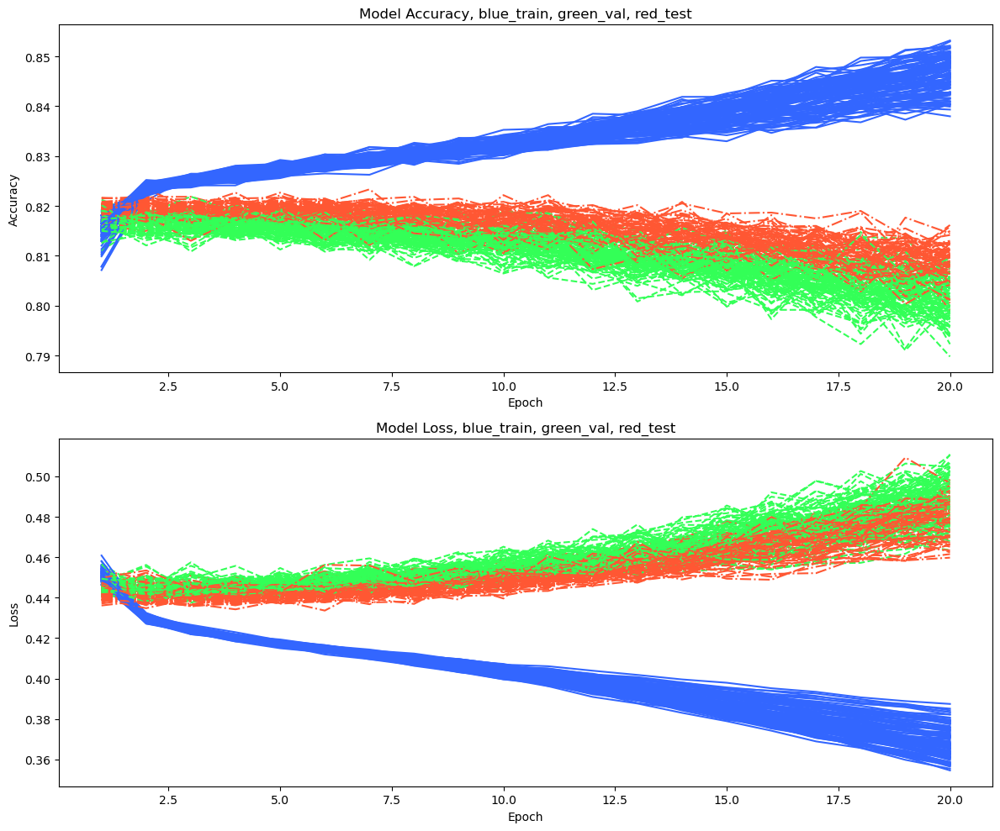

In [161]:
plot_train_val_test_metrics(histories)


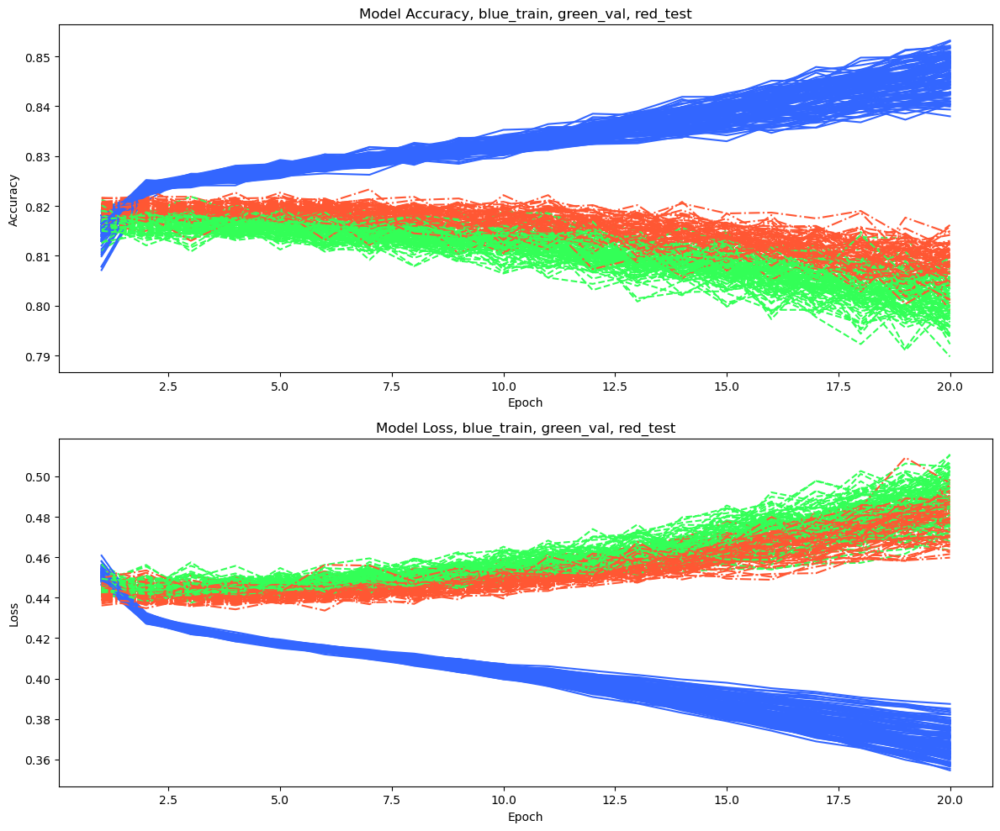

In [162]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np


In [170]:
def plot_train_val_test_scatter(histories):
    fig, axes = plt.subplots(3, 2, figsize=(15, 15))  # Three rows and two columns for each pair

    for i, history_data in enumerate(histories):
        if isinstance(history_data, dict):  # Check if it's a direct dictionary
            train_loss = history_data['train']['loss']
            train_acc = history_data['train']['accuracy']
            val_loss = history_data['train']['val_loss']
            val_acc = history_data['train']['val_accuracy']
            test_loss = history_data['test']['loss']
            test_acc = history_data['test']['accuracy']
        else:  # Assume it's an instance of History class
            train_loss = history_data.history['loss']
            train_acc = history_data.history['accuracy']
            val_loss = history_data.history['val_loss']
            val_acc = history_data.history['val_accuracy']
            # If available, extract test metrics
            if 'test' in history_data.history.keys():
                test_loss = history_data.history['test']['loss']
                test_acc = history_data.history['test']['accuracy']
            else:
                test_loss = None
                test_acc = None

        # Scatter plot for training pair (accuracy vs. loss)
        axes[0, 0].scatter(train_loss, train_acc, label=f'Model {i+1}')
        axes[0, 0].set_title('Training Pair')
        axes[0, 0].set_xlabel('Loss')
        axes[0, 0].set_ylabel('Accuracy')

        # Scatter plot for validation pair (accuracy vs. loss)
        axes[1, 0].scatter(val_loss, val_acc, label=f'Model {i+1}')
        axes[1, 0].set_title('Validation Pair')
        axes[1, 0].set_xlabel('Loss')
        axes[1, 0].set_ylabel('Accuracy')

        # Scatter plot for test pair (accuracy vs. loss)
        if test_loss is not None and test_acc is not None:
            axes[2, 0].scatter(test_loss, test_acc, label=f'Model {i+1}')
            axes[2, 0].set_title('Test Pair')
            axes[2, 0].set_xlabel('Loss')
            axes[2, 0].set_ylabel('Accuracy')

    plt.tight_layout()
    plt.show()


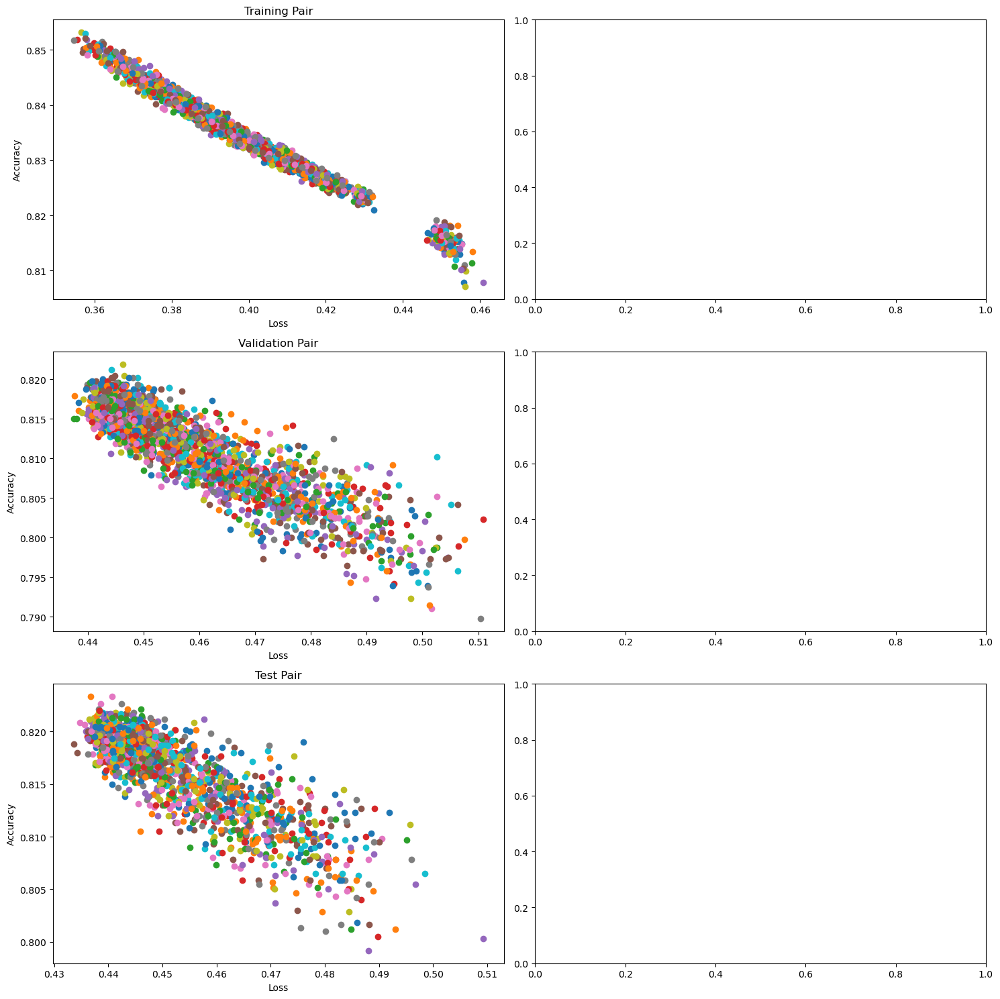

In [171]:
plot_train_val_test_scatter(histories)


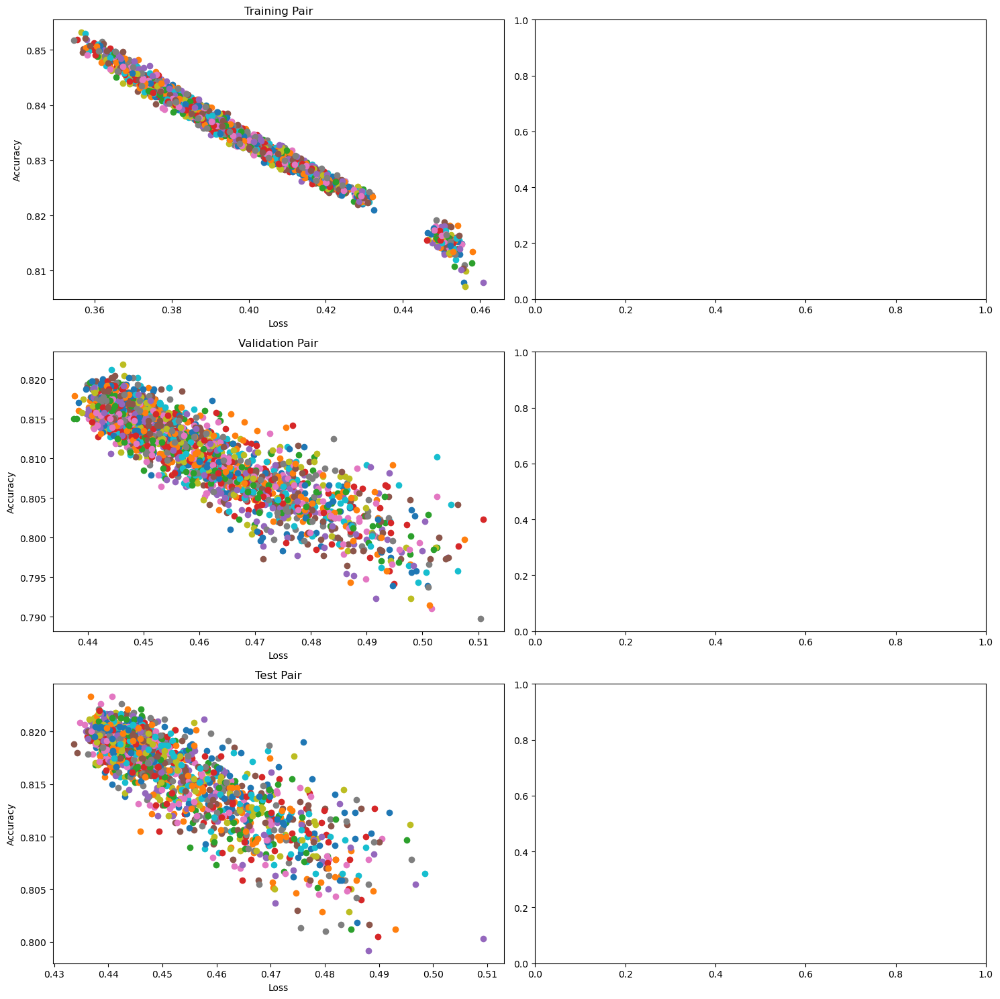

In [174]:
def plot_epoch_wise_box(histories):
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))  # Two rows and two columns for loss and accuracy

    # Extract loss and accuracy data for each epoch
    train_loss_data = []
    val_loss_data = []
    train_acc_data = []
    val_acc_data = []
    test_loss_data = []
    test_acc_data = []

    for history_data in histories:
        if isinstance(history_data, dict):  # Check if it's a direct dictionary
            train_loss = history_data['train']['loss']
            train_acc = history_data['train']['accuracy']
            val_loss = history_data['train']['val_loss']
            val_acc = history_data['train']['val_accuracy']
            test_loss = history_data['test']['loss']
            test_acc = history_data['test']['accuracy']
        else:  # Assume it's an instance of History class
            train_loss = history_data.history['loss']
            train_acc = history_data.history['accuracy']
            val_loss = history_data.history['val_loss']
            val_acc = history_data.history['val_accuracy']
            # If available, extract test metrics
            if 'test' in history_data.history.keys():
                test_loss = history_data.history['test']['loss']
                test_acc = history_data.history['test']['accuracy']
            else:
                test_loss = None
                test_acc = None

        train_loss_data.append(train_loss)
        val_loss_data.append(val_loss)
        train_acc_data.append(train_acc)
        val_acc_data.append(val_acc)
        if test_loss is not None and test_acc is not None:
            test_loss_data.append(test_loss)
            test_acc_data.append(test_acc)

    # Box plot for training and validation losses
    axes[0, 0].boxplot(train_loss_data, labels=[f'Model {i+1}' for i in range(len(train_loss_data))])
    axes[0, 0].set_title('Training Loss')
    axes[0, 0].set_xlabel('Model')
    axes[0, 0].set_ylabel('Loss')

    axes[0, 1].boxplot(val_loss_data, labels=[f'Model {i+1}' for i in range(len(val_loss_data))])
    axes[0, 1].set_title('Validation Loss')
    axes[0, 1].set_xlabel('Model')
    axes[0, 1].set_ylabel('Loss')

    # Box plot for training and validation accuracies
    axes[1, 0].boxplot(train_acc_data, labels=[f'Model {i+1}' for i in range(len(train_acc_data))])
    axes[1, 0].set_title('Training Accuracy')
    axes[1, 0].set_xlabel('Model')
    axes[1, 0].set_ylabel('Accuracy')

    axes[1, 1].boxplot(val_acc_data, labels=[f'Model {i+1}' for i in range(len(val_acc_data))])
    axes[1, 1].set_title('Validation Accuracy')
    axes[1, 1].set_xlabel('Model')
    axes[1, 1].set_ylabel('Accuracy')

    # Add box plots for testing loss and testing accuracy
    if test_loss_data and test_acc_data:
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))

        axes[0].boxplot(test_loss_data, labels=[f'Model {i+1}' for i in range(len(test_loss_data))])
        axes[0].set_title('Testing Loss')
        axes[0].set_xlabel('Model')
        axes[0].set_ylabel('Loss')

        axes[1].boxplot(test_acc_data, labels=[f'Model {i+1}' for i in range(len(test_acc_data))])
        axes[1].set_title('Testing Accuracy')
        axes[1].set_xlabel('Model')
        axes[1].set_ylabel('Accuracy')

    plt.tight_layout()
    plt.show()


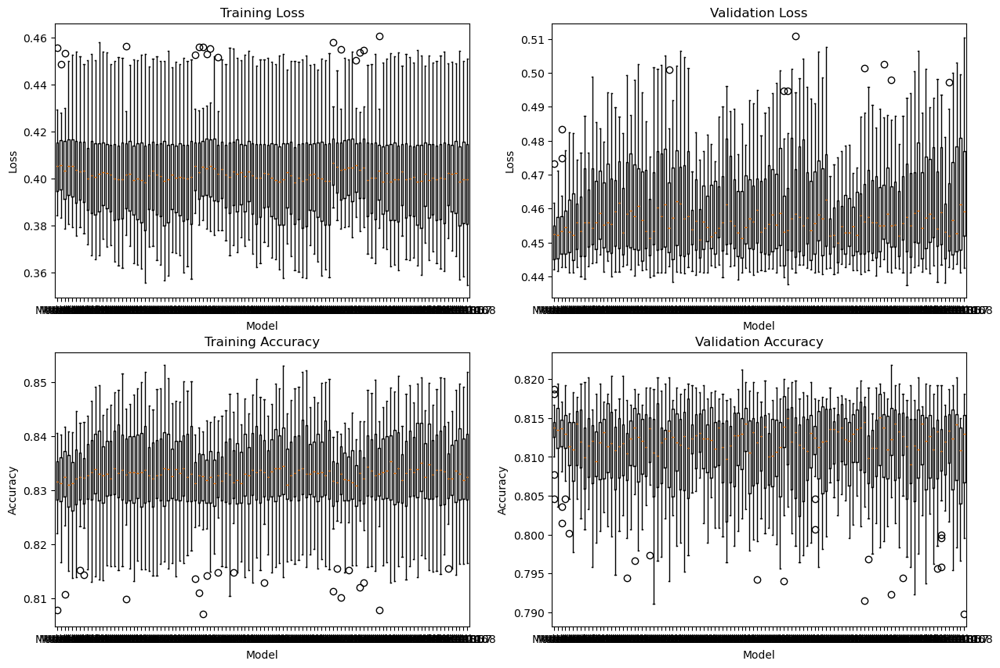

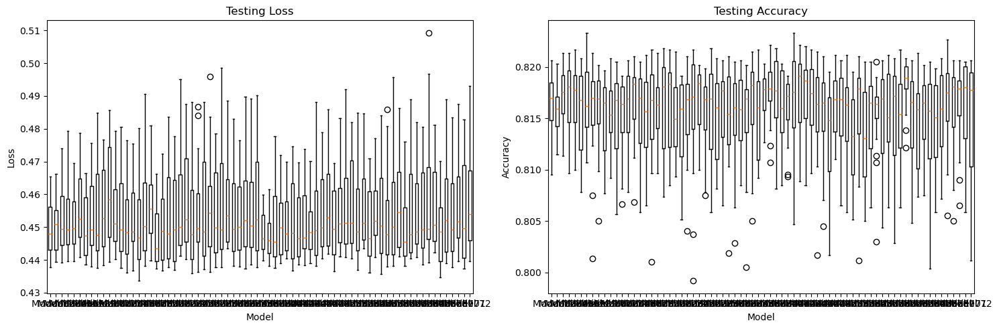

In [175]:
plot_epoch_wise_box(histories)


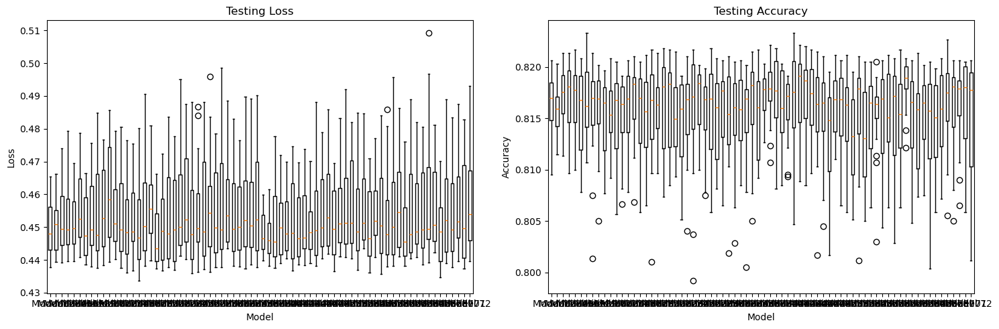
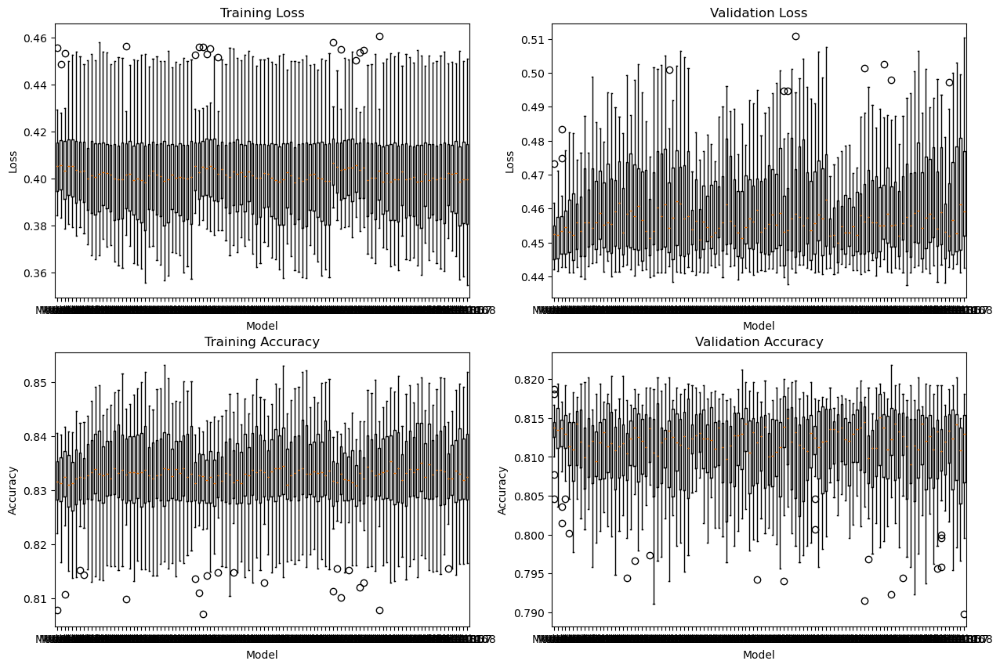

# Below is old code

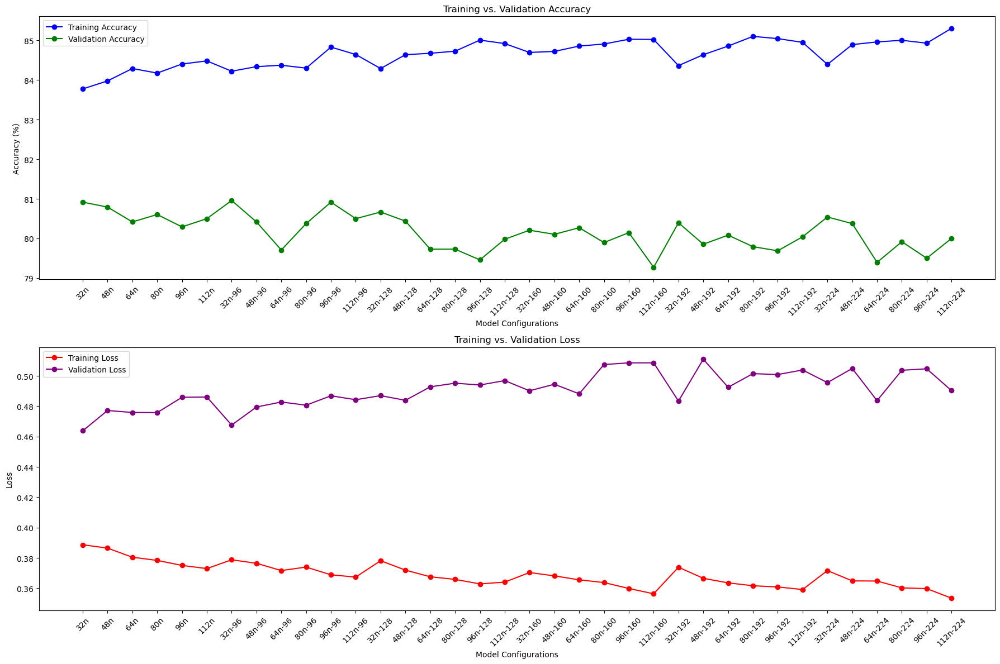

In [7]:
import matplotlib.pyplot as plt

# Model data, including training and validation metrics
models = {
    'Configurations': ['32n', '48n', '64n', '80n', '96n', '112n', '32n-96', '48n-96', '64n-96', '80n-96', '96n-96', '112n-96', '32n-128', '48n-128', '64n-128', '80n-128', '96n-128', '112n-128', '32n-160', '48n-160', '64n-160', '80n-160', '96n-160', '112n-160', '32n-192', '48n-192', '64n-192', '80n-192', '96n-192', '112n-192', '32n-224', '48n-224', '64n-224', '80n-224', '96n-224', '112n-224'],
    'Training Accuracy': [83.776, 83.979, 84.292, 84.177, 84.406, 84.484, 84.224, 84.339, 84.375, 84.302, 84.833, 84.646, 84.292, 84.641, 84.677, 84.729, 85.010, 84.922, 84.698, 84.724, 84.859, 84.911, 85.031, 85.026, 84.365, 84.641, 84.859, 85.104, 85.047, 84.953, 84.396, 84.896, 84.964, 85.005, 84.932, 85.307],
    'Validation Accuracy': [80.917, 80.792, 80.417, 80.604, 80.292, 80.500, 80.958, 80.417, 79.708, 80.375, 80.917, 80.500, 80.667, 80.438, 79.729, 79.729, 79.458, 79.979, 80.208, 80.104, 80.271, 79.896, 80.146, 79.271, 80.396, 79.854, 80.083, 79.792, 79.688, 80.042, 80.542, 80.375, 79.396, 79.917, 79.500, 80.000],
    'Training Loss': [0.3887, 0.3865, 0.3805, 0.3784, 0.3751, 0.3730, 0.3788, 0.3765, 0.3717, 0.3740, 0.3689, 0.3674, 0.3782, 0.3720, 0.3676, 0.3659, 0.3629, 0.3641, 0.3704, 0.3682, 0.3656, 0.3638, 0.3599, 0.3564, 0.3739, 0.3666, 0.3636, 0.3617, 0.3609, 0.3592, 0.3717, 0.3649, 0.3648, 0.3603, 0.3598, 0.3535],
    'Validation Loss': [0.4638, 0.4772, 0.4759, 0.4758, 0.4859, 0.4861, 0.4676, 0.4795, 0.4828, 0.4807, 0.4869, 0.4843, 0.4870, 0.4839, 0.4928, 0.4952, 0.4940, 0.4969, 0.4902, 0.4945, 0.4882, 0.5075, 0.5086, 0.5086, 0.4834, 0.5110, 0.4925, 0.5015, 0.5009, 0.5039, 0.4956, 0.5049, 0.4837, 0.5037, 0.5047, 0.4903]
}

# Plotting
fig, ax = plt.subplots(2, 1, figsize=(18, 12))

# Accuracy Plot
ax[0].plot(models['Configurations'], models['Training Accuracy'], label='Training Accuracy', color='blue', marker='o')
ax[0].plot(models['Configurations'], models['Validation Accuracy'], label='Validation Accuracy', color='green', marker='o')
ax[0].set_title('Training vs. Validation Accuracy')
ax[0].set_xlabel('Model Configurations')
ax[0].set_ylabel('Accuracy (%)')
ax[0].set_xticks(models['Configurations'])
ax[0].set_xticklabels(models['Configurations'], rotation=45)
ax[0].legend()

# Loss Plot
ax[1].plot(models['Configurations'], models['Training Loss'], label='Training Loss', color='red', marker='o')
ax[1].plot(models['Configurations'], models['Validation Loss'], label='Validation Loss', color='purple', marker='o')
ax[1].set_title('Training vs. Validation Loss')
ax[1].set_xlabel('Model Configurations')
ax[1].set_ylabel('Loss')
ax[1].set_xticks(models['Configurations'])
ax[1].set_xticklabels(models['Configurations'], rotation=45)
ax[1].legend()

plt.tight_layout()
plt.show()


## step 2: print summaries, metrics, graphs

In [ ]:
# Model Summary and Accuracy Trend Graph Block
for model, history, first_layer_neurons, second_layer_neurons in zip(models, histories, first_layer_neurons_variations, second_layer_neurons_variations):
    # Print Model Summary
    print(f"Model Summary with {first_layer_neurons} neurons in the first layer and {second_layer_neurons} neurons in the second layer:")
    model.summary()
    
    # Plot training history
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'Accuracy Trend for Model with {first_layer_neurons} Neurons in the First Layer and {second_layer_neurons} Neurons in the Second Layer')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()
    
    # Evaluate model and print Test Accuracy
    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Test Accuracy: {test_accuracy}\n")

#too many outputs, deleted

step 3: Compare models in collectively

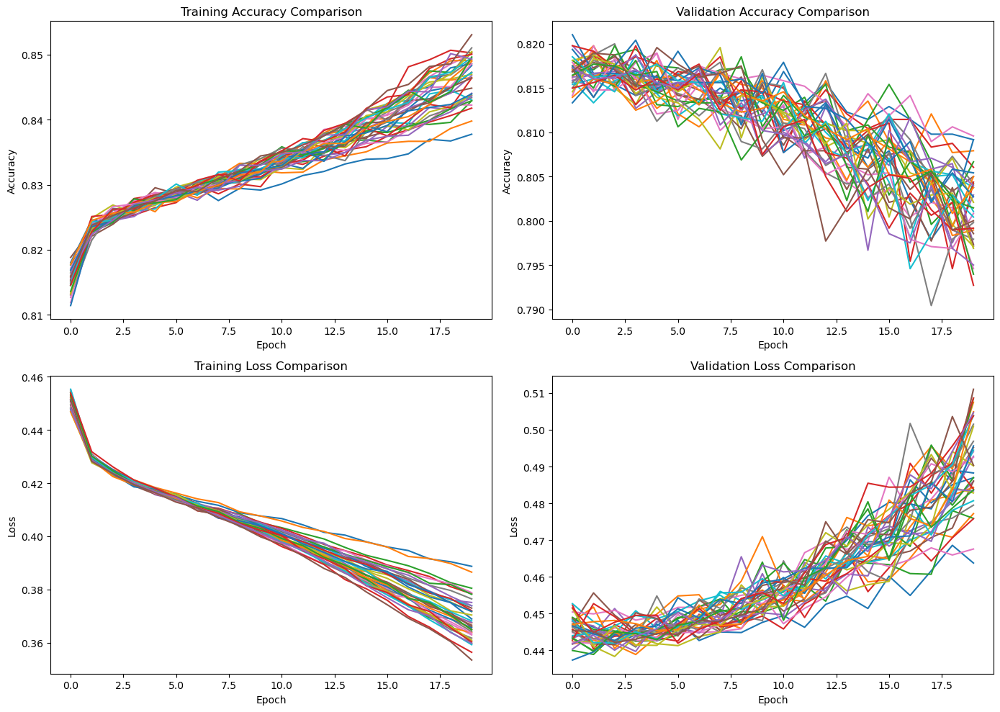

In [14]:
import matplotlib.pyplot as plt

# Initialize subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Plot Training Accuracy Comparison
axs[0, 0].set_title('Training Accuracy Comparison')
for i, history in enumerate(histories):
    axs[0, 0].plot(history.history['accuracy'], label=f'Model {i+1}')
axs[0, 0].set_xlabel('Epoch')
axs[0, 0].set_ylabel('Accuracy')
#axs[0, 0].legend()

# Plot Validation Accuracy Comparison
axs[0, 1].set_title('Validation Accuracy Comparison')
for i, history in enumerate(histories):
    axs[0, 1].plot(history.history['val_accuracy'], label=f'Model {i+1}')
axs[0, 1].set_xlabel('Epoch')
axs[0, 1].set_ylabel('Accuracy')
#axs[0, 1].legend()

# Plot Training Loss Comparison
axs[1, 0].set_title('Training Loss Comparison')
for i, history in enumerate(histories):
    axs[1, 0].plot(history.history['loss'], label=f'Model {i+1}')
axs[1, 0].set_xlabel('Epoch')
axs[1, 0].set_ylabel('Loss')
#axs[1, 0].legend()

# Plot Validation Loss Comparison
axs[1, 1].set_title('Validation Loss Comparison')
for i, history in enumerate(histories):
    axs[1, 1].plot(history.history['val_loss'], label=f'Model {i+1}')
axs[1, 1].set_xlabel('Epoch')
axs[1, 1].set_ylabel('Loss')
#axs[1, 1].legend()

plt.tight_layout()
plt.show()


## step 4: box plot to see general variations of metrics

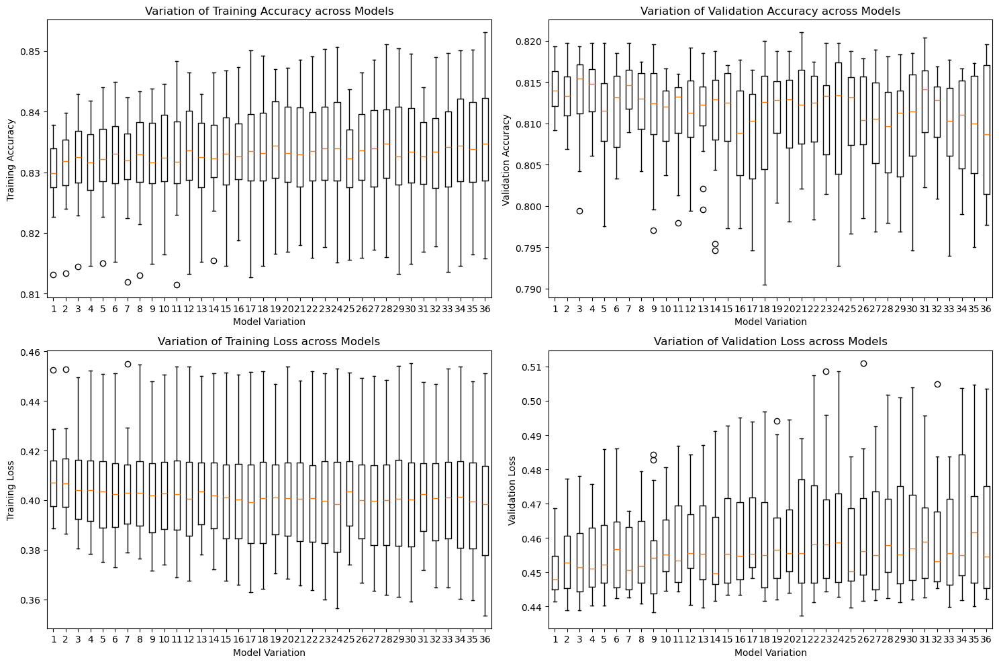

In [15]:
import matplotlib.pyplot as plt

# Extract metrics for all epochs
train_accuracies = []
val_accuracies = []
train_losses = []
val_losses = []

for history in histories:
    train_accuracies.append(history.history['accuracy'])
    val_accuracies.append(history.history['val_accuracy'])
    train_losses.append(history.history['loss'])
    val_losses.append(history.history['val_loss'])

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 10))

# Box plot for training accuracy
axs[0, 0].boxplot(train_accuracies, positions=range(1, len(train_accuracies)+1))
axs[0, 0].set_xlabel('Model Variation')
axs[0, 0].set_ylabel('Training Accuracy')
axs[0, 0].set_title('Variation of Training Accuracy across Models')

# Box plot for validation accuracy
axs[0, 1].boxplot(val_accuracies, positions=range(1, len(val_accuracies)+1))
axs[0, 1].set_xlabel('Model Variation')
axs[0, 1].set_ylabel('Validation Accuracy')
axs[0, 1].set_title('Variation of Validation Accuracy across Models')

# Box plot for training loss
axs[1, 0].boxplot(train_losses, positions=range(1, len(train_losses)+1))
axs[1, 0].set_xlabel('Model Variation')
axs[1, 0].set_ylabel('Training Loss')
axs[1, 0].set_title('Variation of Training Loss across Models')

# Box plot for validation loss
axs[1, 1].boxplot(val_losses, positions=range(1, len(val_losses)+1))
axs[1, 1].set_xlabel('Model Variation')
axs[1, 1].set_ylabel('Validation Loss')
axs[1, 1].set_title('Variation of Validation Loss across Models')

plt.tight_layout()
plt.show()


## step 5: shaded variance trend graph

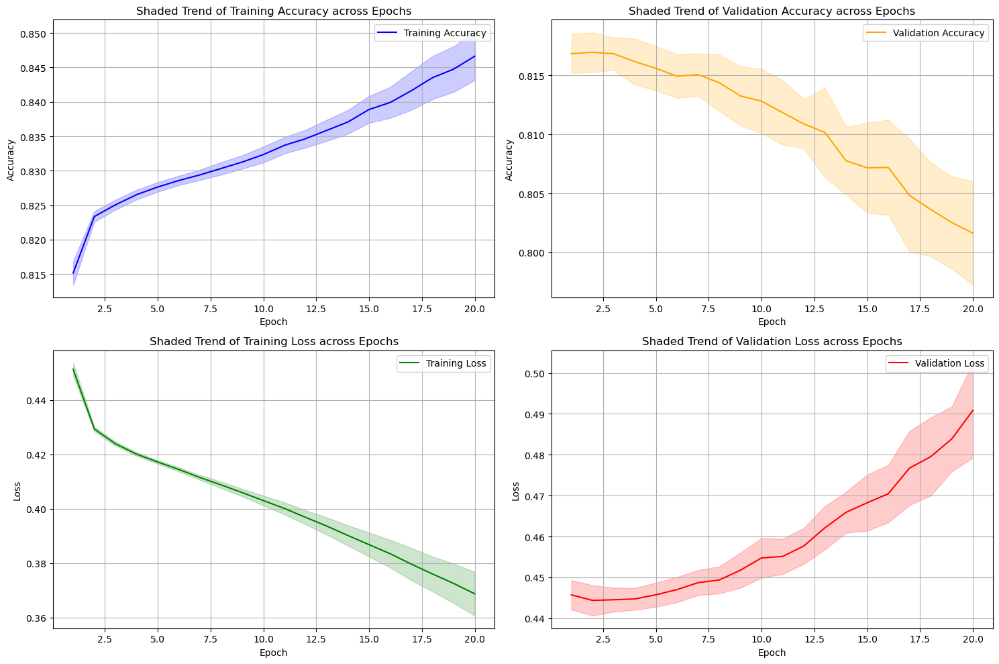

In [16]:
import numpy as np
import matplotlib.pyplot as plt

# Extract metrics for all epochs
train_accuracies = []
val_accuracies = []
train_losses = []
val_losses = []

for history in histories:
    train_accuracies.append(history.history['accuracy'])
    val_accuracies.append(history.history['val_accuracy'])
    train_losses.append(history.history['loss'])
    val_losses.append(history.history['val_loss'])

# Calculate mean and standard deviation for each epoch
mean_train_accuracy = np.mean(train_accuracies, axis=0)
std_train_accuracy = np.std(train_accuracies, axis=0)
mean_val_accuracy = np.mean(val_accuracies, axis=0)
std_val_accuracy = np.std(val_accuracies, axis=0)
mean_train_loss = np.mean(train_losses, axis=0)
std_train_loss = np.std(train_losses, axis=0)
mean_val_loss = np.mean(val_losses, axis=0)
std_val_loss = np.std(val_losses, axis=0)

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 10))

# Plot shaded trend for training accuracy
axs[0, 0].plot(range(1, len(mean_train_accuracy) + 1), mean_train_accuracy, label='Training Accuracy', color='blue')
axs[0, 0].fill_between(range(1, len(mean_train_accuracy) + 1),
                       mean_train_accuracy - std_train_accuracy,
                       mean_train_accuracy + std_train_accuracy,
                       color='blue', alpha=0.2)
axs[0, 0].set_xlabel('Epoch')
axs[0, 0].set_ylabel('Accuracy')
axs[0, 0].set_title('Shaded Trend of Training Accuracy across Epochs')
axs[0, 0].legend()
axs[0, 0].grid(True)

# Plot shaded trend for validation accuracy
axs[0, 1].plot(range(1, len(mean_val_accuracy) + 1), mean_val_accuracy, label='Validation Accuracy', color='orange')
axs[0, 1].fill_between(range(1, len(mean_val_accuracy) + 1),
                       mean_val_accuracy - std_val_accuracy,
                       mean_val_accuracy + std_val_accuracy,
                       color='orange', alpha=0.2)
axs[0, 1].set_xlabel('Epoch')
axs[0, 1].set_ylabel('Accuracy')
axs[0, 1].set_title('Shaded Trend of Validation Accuracy across Epochs')
axs[0, 1].legend()
axs[0, 1].grid(True)

# Plot shaded trend for training loss
axs[1, 0].plot(range(1, len(mean_train_loss) + 1), mean_train_loss, label='Training Loss', color='green')
axs[1, 0].fill_between(range(1, len(mean_train_loss) + 1),
                       mean_train_loss - std_train_loss,
                       mean_train_loss + std_train_loss,
                       color='green', alpha=0.2)
axs[1, 0].set_xlabel('Epoch')
axs[1, 0].set_ylabel('Loss')
axs[1, 0].set_title('Shaded Trend of Training Loss across Epochs')
axs[1, 0].legend()
axs[1, 0].grid(True)

# Plot shaded trend for validation loss
axs[1, 1].plot(range(1, len(mean_val_loss) + 1), mean_val_loss, label='Validation Loss', color='red')
axs[1, 1].fill_between(range(1, len(mean_val_loss) + 1),
                       mean_val_loss - std_val_loss,
                       mean_val_loss + std_val_loss,
                       color='red', alpha=0.2)
axs[1, 1].set_xlabel('Epoch')
axs[1, 1].set_ylabel('Loss')
axs[1, 1].set_title('Shaded Trend of Validation Loss across Epochs')
axs[1, 1].legend()
axs[1, 1].grid(True)

plt.tight_layout()
plt.show()


### step 6: best model

Previous code as redundant and incorporated in the main training block.

The best model has 64 neurons in the first layer and 80 neurons in the second layer with Test Accuracy: 0.8173333406448364, Training Accuracy: 0.8285416960716248, Validation Accuracy: 0.815833330154419, Training Loss: 0.4011897146701813, Validation Loss: 0.4485721290111542.


Any markdown about model results are at the moment of training at specific time. Differences are due to running models in another time.

### step 7, fixing overfitting

Reducing overfitting in neural networks involves several techniques:

1. **More Data**: Increase the size of your training dataset to provide the network with more diverse examples.

2. **Regularization**: Techniques like L1 and L2 regularization penalize large weights, preventing the network from fitting noise in the data.

3. **Dropout**: Randomly deactivate neurons during training to prevent the network from relying too much on specific features.

4. **Cross-Validation**: Split your dataset into training and validation sets to evaluate the model's performance and adjust hyperparameters accordingly.

5. **Early Stopping**: Monitor the validation error during training and stop when it starts increasing, indicating overfitting.

6. **Simplifying the Model**: Reduce the complexity of the model by decreasing the number of layers or neurons.

7. **Data Augmentation**: Generate more training data by applying transformations like rotation, scaling, or flipping to the existing data.

Implementing a combination of these techniques can help mitigate overfitting in neural networks.

# Initial plan

import tensorflow as tf
from tensorflow.keras import layers, regularizers

# Define a function to create and compile the model with specified regularization
def create_model(regularizer):
    model = tf.keras.Sequential([
        layers.Dense(128, activation='relu', kernel_regularizer=regularizer),
        layers.Dropout(0.5),
        layers.Dense(64, activation='relu', kernel_regularizer=regularizer),
        layers.Dropout(0.5),
        layers.Dense(10, activation='softmax')
    ])
    
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    
    return model

# Define a range of regularization strengths to try
regularization_strengths = [0.001, 0.01, 0.1]

# Experiment with different regularization techniques and strengths
for strength in regularization_strengths:
    l1_regularizer = regularizers.l1(strength)
    l2_regularizer = regularizers.l2(strength)
    l1_l2_regularizer = regularizers.l1_l2(l1=strength, l2=strength)
    
    print(f"Regularization strength: {strength}")
    
    # Create and train models with different regularization techniques
    model_l1 = create_model(l1_regularizer)
    model_l2 = create_model(l2_regularizer)
    model_l1_l2 = create_model(l1_l2_regularizer)
    
    print("L1 Regularization:")
    model_l1.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val))
    
    print("L2 Regularization:")
    model_l2.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val))
    
    print("L1_L2 Regularization:")
    model_l1_l2.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val))


# Find the best models from the previous code

Best Model Configuration: 96 neurons (1st layer), 48 neurons (2nd layer)
Best Model Metrics: Test Accuracy: 0.8202, Training Accuracy: 0.8426, Validation Accuracy: 0.8087, Training Loss: 0.3765, Validation Loss: 0.4762


## From neuron change models batch

## L1 L2 L1_L2, range 0 0.1 0.01 0.001


In [24]:
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.regularizers import l1, l2, l1_l2

# Define variations of regularization strengths
l1_strengths = [0, 0.001, 0.01, 0.1]
l2_strengths = [0, 0.001, 0.01, 0.1]

# Function to create model with regularization
def create_regularized_model(first_layer_neurons, second_layer_neurons, reg_type, reg_strength):
    model = Sequential()
    if reg_type == 'L1':
        model.add(Dense(first_layer_neurons, activation='relu', input_shape=(X_train.shape[1],), kernel_regularizer=l1(reg_strength)))
        model.add(Dense(second_layer_neurons, activation='relu', kernel_regularizer=l1(reg_strength)))
    elif reg_type == 'L2':
        model.add(Dense(first_layer_neurons, activation='relu', input_shape=(X_train.shape[1],), kernel_regularizer=l2(reg_strength)))
        model.add(Dense(second_layer_neurons, activation='relu', kernel_regularizer=l2(reg_strength)))
    elif reg_type == 'L1_L2':
        model.add(Dense(first_layer_neurons, activation='relu', input_shape=(X_train.shape[1],), kernel_regularizer=l1_l2(l1=reg_strength, l2=reg_strength)))
        model.add(Dense(second_layer_neurons, activation='relu', kernel_regularizer=l1_l2(l1=reg_strength, l2=reg_strength)))
    else:
        raise ValueError("Invalid regularization type. Use 'L1', 'L2', or 'L1_L2'.")

    model.add(Dense(1, activation='sigmoid'))
    return model

# Lists to store performances of models with regularization
regularized_model_performances = []
regularized_models = []
regularized_histories = []

# Create an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['Test Accuracy', 'Training Accuracy', 'Validation Accuracy', 'Training Loss', 'Validation Loss', 'Regularization Type', 'L1 Strength', 'L2 Strength'])

# Loop over different combinations of regularization types and strengths
for reg_type in ['L1', 'L2', 'L1_L2']:
    for l1_strength in l1_strengths:
        for l2_strength in l2_strengths:
            if (l1_strength != 0 and l2_strength == 0 and reg_type == 'L1') or \
               (l1_strength == 0 and l2_strength != 0 and reg_type == 'L2') or \
               (l1_strength != 0 and l2_strength != 0 and reg_type == 'L1_L2'):
                model = create_regularized_model(96, 48, reg_type, (l1_strength + l2_strength))
                model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
                history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2, verbose=0)
                test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
                
                final_training_accuracy = history.history['accuracy'][-1]
                final_validation_accuracy = history.history['val_accuracy'][-1]
                final_training_loss = history.history['loss'][-1]
                final_validation_loss = history.history['val_loss'][-1]

                # Append results to the DataFrame
                results_df = pd.concat([results_df, pd.DataFrame({'Test Accuracy': [test_accuracy],
                                                'Training Accuracy': [final_training_accuracy],
                                                'Validation Accuracy': [final_validation_accuracy],
                                                'Training Loss': [final_training_loss],
                                                'Validation Loss': [final_validation_loss],
                                                'Regularization Type': [reg_type],
                                                'L1 Strength': [l1_strength],
                                                'L2 Strength': [l2_strength]})], ignore_index=True)

                regularized_model_performances.append((test_accuracy, final_training_accuracy, final_validation_accuracy, final_training_loss, final_validation_loss, reg_type, l1_strength, l2_strength))
                regularized_models.append(model)
                regularized_histories.append(history)

# Finding the best performing regularized model
best_regularized_performance = max(regularized_model_performances, key=lambda x: x[0])
(best_test_accuracy, best_training_accuracy, best_validation_accuracy,
 best_training_loss, best_validation_loss, best_reg_type, best_l1_strength, best_l2_strength) = best_regularized_performance

print(f"\nBest Regularized Model Configuration: Type: {best_reg_type}, L1 Strength: {best_l1_strength}, L2 Strength: {best_l2_strength}")
print(f"Best Model Metrics: Test Accuracy: {best_test_accuracy:.4f}, Training Accuracy: {best_training_accuracy:.4f}, "
      f"Validation Accuracy: {best_validation_accuracy:.4f}, Training Loss: {best_training_loss:.4f}, "
      f"Validation Loss: {best_validation_loss:.4f}\n")

# Now, the results are stored in the DataFrame 'results_df'
# You can access and analyze the results further as needed


C:\Users\wjbea\AppData\Local\Temp\ipykernel_2136\1675760752.py:55: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.




Best Regularized Model Configuration: Type: L2, L1 Strength: 0, L2 Strength: 0.01
Best Model Metrics: Test Accuracy: 0.8207, Training Accuracy: 0.8229, Validation Accuracy: 0.8152, Training Loss: 0.4393, Validation Loss: 0.4468



In [25]:
results_df

,Test Accuracy,Training Accuracy,Validation Accuracy,Training Loss,Validation Loss,Regularization Type,L1 Strength,L2 Strength
0,0.820000,0.822708,0.818542,0.441258,0.452167,L1,0.001,0
1,0.817833,0.820781,0.814375,0.477329,0.484645,L1,0.010,0
2,0.781167,0.778490,0.777083,0.688834,0.690012,L1,0.100,0
3,0.819167,0.826979,0.816667,0.425356,0.444518,L2,0.000,0.001
4,0.820667,0.822917,0.815208,0.439274,0.446761,L2,0.000,0.01
5,0.811167,0.819635,0.808333,0.456318,0.460663,L2,0.000,0.1
6,0.819667,0.822031,0.816667,0.450602,0.457831,L1_L2,0.001,0.001
7,0.781167,0.778490,0.777083,0.546248,0.548758,L1_L2,0.001,0.01
8,0.781167,0.778490,0.777083,0.694016,0.696148,L1_L2,0.001,0.1
9,0.781167,0.778490,0.777083,0.546851,0.548813,L1_L2,0.010,0.001


In [29]:
# Find the row with the maximum test accuracy
best_test_accuracy_row = results_df.loc[results_df['Test Accuracy'].idxmax()]

# Find the row with the minimum absolute difference between test and training accuracy
min_abs_diff_row = results_df.loc[results_df['Test Accuracy'].sub(results_df['Training Accuracy']).abs().idxmin()]

# Compare the two rows to determine the best model
if best_test_accuracy_row['Regularization Type'] == min_abs_diff_row['Regularization Type']:
    best_row = best_test_accuracy_row if best_test_accuracy_row['Test Accuracy'] >= min_abs_diff_row['Test Accuracy'] else min_abs_diff_row
else:
    best_row = best_test_accuracy_row if best_test_accuracy_row['Regularization Type'] == 'L1' else min_abs_diff_row

# Print the best model's details
print("Best Model Metrics:")
print(best_row)


Best Model Metrics:
Test Accuracy          0.820667
Training Accuracy      0.822917
Validation Accuracy    0.815208
Training Loss          0.439274
Validation Loss        0.446761
Regularization Type          L2
L1 Strength                 0.0
L2 Strength                0.01
Name: 4, dtype: object


plot

In [30]:
import plotly.graph_objects as go

# Define a color map for the regularization types
color_map = {'L1': 'rgb(255,0,0)', 'L2': 'rgb(0,255,0)', 'L1_L2': 'rgb(0,0,255)'}

# Find the best model row
best_model_row = results_df.loc[best_row.name]

# Create a list to store marker colors
marker_colors = results_df['Regularization Type'].map(color_map).tolist()

# Find the index of the best model row in the DataFrame
best_model_index = results_df.index.get_loc(best_model_row.name)

# Highlight the best model by changing its marker color
marker_colors[best_model_index] = 'rgb(255,255,0)'  # Yellow color for the best model

# Create a 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=results_df['L1 Strength'],
    y=results_df['L2 Strength'],
    z=results_df['Test Accuracy'],
    mode='markers',
    marker=dict(
        size=5,
        color=marker_colors,  # Use the updated marker colors
        opacity=0.8
    )
)])

# Update layout
fig.update_layout(
    scene=dict(
        xaxis_title='L1 Strength',
        yaxis_title='L2 Strength',
        zaxis_title='Test Accuracy'
    ),
    title='3D Scatter Plot of Test Accuracy vs L1 Strength and L2 Strength',
    width=800,
    height=600
)

# Show plot
fig.show()


In [31]:
# Find the row indices of the top three best models
top_three_indices = results_df['Test Accuracy'].nlargest(3).index

# Calculate the differences in test accuracies
diff_second_best = results_df.loc[top_three_indices[0], 'Test Accuracy'] - results_df.loc[top_three_indices[1], 'Test Accuracy']
diff_third_best = results_df.loc[top_three_indices[0], 'Test Accuracy'] - results_df.loc[top_three_indices[2], 'Test Accuracy']

print(f"Difference between best and second best: {diff_second_best:.4f}")
print(f"Difference between best and third best: {diff_third_best:.4f}")


Difference between best and second best: 0.0007
Difference between best and third best: 0.0010


highlight all three

In [38]:
import plotly.graph_objects as go

# Define a color map for the regularization types
color_map = {'L1': 'rgb(255,0,0)', 'L2': 'rgb(0,255,0)', 'L1_L2': 'rgb(0,0,255)'}

# Create a 3D scatter plot with all points, highlighting top 3
fig_all_points = go.Figure()

# Add trace for all points
fig_all_points.add_trace(go.Scatter3d(
    x=results_df['L1 Strength'],
    y=results_df['L2 Strength'],
    z=results_df['Test Accuracy'],
    mode='markers',
    marker=dict(
        size=5,
        color=[color_map[reg_type] for reg_type in results_df['Regularization Type']],  # Use color map for each point
        opacity=0.8
    ),
    name='All Points'  # Legend label for all points
))

# Add trace for highlighting top 3 points
fig_all_points.add_trace(go.Scatter3d(
    x=results_df.loc[top_three_indices, 'L1 Strength'],
    y=results_df.loc[top_three_indices, 'L2 Strength'],
    z=results_df.loc[top_three_indices, 'Test Accuracy'],
    mode='markers',
    marker=dict(
        size=10,  # Larger size for top 3 points
        color='rgb(255,255,255)',  # White color for top 3 points
        opacity=0.8,
        line=dict(
            color='black',  # Black border for top 3 points
            width=2
        )
    ),
    name='Top 3 Points'  # Legend label for top 3 points
))

# Update layout for the first plot
fig_all_points.update_layout(
    scene=dict(
        xaxis_title='L1 Strength',
        yaxis_title='L2 Strength',
        zaxis_title='Test Accuracy'
    ),
    title='All Points with Top 3 Highlighted',
    width=800,
    height=600
)

# Create a 3D scatter plot showing only top 3 points
fig_top_three_points = go.Figure()

# Add trace for top 3 points
fig_top_three_points.add_trace(go.Scatter3d(
    x=results_df.loc[top_three_indices, 'L1 Strength'],
    y=results_df.loc[top_three_indices, 'L2 Strength'],
    z=results_df.loc[top_three_indices, 'Test Accuracy'],
    mode='markers',
    marker=dict(
        size=10,  # Larger size for top 3 points
        color='rgb(255,255,255)',  # White color for top 3 points
        opacity=0.8,
        line=dict(
            color='black',  # Black border for top 3 points
            width=2
        )
    ),
    name='Top 3 Points'  # Legend label for top 3 points
))

# Update layout for the second plot
fig_top_three_points.update_layout(
    scene=dict(
        xaxis_title='L1 Strength',
        yaxis_title='L2 Strength',
        zaxis_title='Test Accuracy'
    ),
    title='Top 3 Points Only',
    width=800,
    height=600
)

# Show both plots
fig_all_points.show()
fig_top_three_points.show()


In [41]:
import plotly.graph_objects as go

# Define a color map for the regularization types
color_map = {'L1': 'rgb(255,0,0)', 'L2': 'rgb(0,255,0)', 'L1_L2': 'rgb(0,0,255)'}

# Create a 3D scatter plot showing the top 3 points
fig_top_three = go.Figure()

# Get the indices of the top 3 points
top_three_indices = results_df.nlargest(3, 'Test Accuracy').index

# Add traces for the top 3 points
for i, index in enumerate(top_three_indices):
    if i == 0:  # Highlight the best point
        marker_color = 'rgb(255,255,255)'
        marker_size = 10
        line_color = 'black'
    else:
        marker_color = color_map[results_df.loc[index, 'Regularization Type']]
        marker_size = 5
        line_color = None
        
    fig_top_three.add_trace(go.Scatter3d(
        x=[results_df.loc[index, 'L1 Strength']],
        y=[results_df.loc[index, 'L2 Strength']],
        z=[results_df.loc[index, 'Test Accuracy']],
        mode='markers',
        marker=dict(
            size=marker_size,
            color=marker_color,
            opacity=0.8,
            line=dict(
                color=line_color,
                width=2 if line_color else None
            )
        ),
        name=f'Top {i+1}'  # Legend label for the top points
    ))

# Update layout for the plot
fig_top_three.update_layout(
    scene=dict(
        xaxis_title='L1 Strength',
        yaxis_title='L2 Strength',
        zaxis_title='Test Accuracy'
    ),
    title='Top 3 Points Highlighting Best',
    width=800,
    height=600
)

# Show the plot
fig_top_three.show()


 scatter plot matrix 

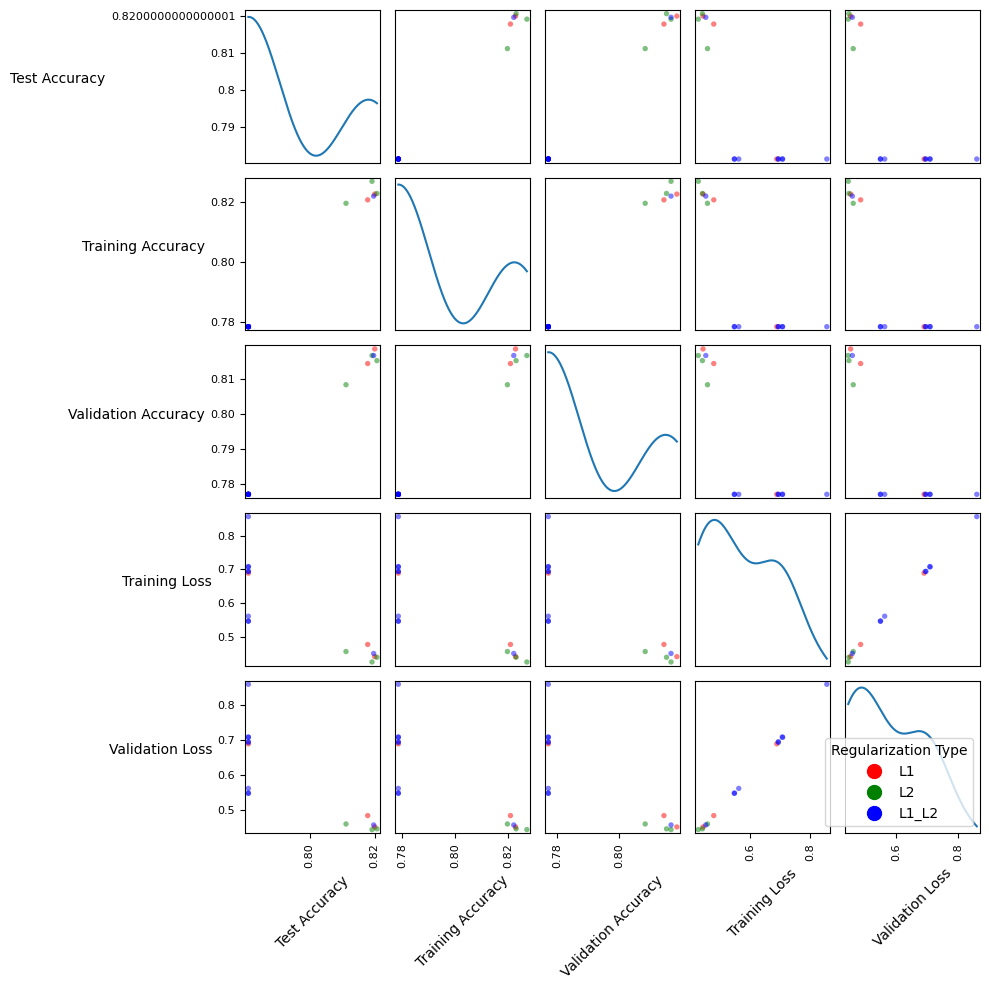

In [78]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming results_df has a 'Regularization Type' column indicating the regularization type for each row
color_map = {'L1': 'red', 'L2': 'green', 'L1_L2': 'blue'}
colors = results_df['Regularization Type'].map(color_map)  # Map 'Regularization Type' to colors

# Plot scatter matrix with color-coded dots
scatter_matrix = pd.plotting.scatter_matrix(results_df.drop(columns=['Regularization Type', 'L1 Strength']), figsize=(10,10), diagonal='kde', alpha=0.5, color=colors, s=60)  # Increased size with `s=60`

# Rotate the x-axis labels and y-axis labels for better readability
for ax in scatter_matrix.ravel():  # Flatten the array for easier iteration
    ax.xaxis.label.set_rotation(45)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

# Legend handling
handles = [plt.Line2D([0], [0], marker='o', color=color, linestyle='', markersize=10) for color in color_map.values()]
labels = list(color_map.keys())
plt.legend(handles, labels, loc='best', title='Regularization Type')

plt.tight_layout()
plt.show()


test best model

change to softmax to compare

# problem
Regularization Type: L1, L1 Strength: 0.001, L2 Strength: 0.001
Test Acc: 0.8190, Train Acc: 0.8221, Val Acc: 0.8169, Train Loss: 0.4489, Val Loss: 0.4610
Regularization Type: L1, L1 Strength: 0.001, L2 Strength: 0.01
Test Acc: 0.8188, Train Acc: 0.8205, Val Acc: 0.8156, Train Loss: 0.4812, Val Loss: 0.4885
Regularization Type: L1, L1 Strength: 0.001, L2 Strength: 0.1
Test Acc: 0.7812, Train Acc: 0.7785, Val Acc: 0.7771, Train Loss: 0.6894, Val Loss: 0.6912
Regularization Type: L1, L1 Strength: 0.01, L2 Strength: 0.001
Test Acc: 0.8192, Train Acc: 0.8195, Val Acc: 0.8160, Train Loss: 0.4811, Val Loss: 0.4865
Regularization Type: L1, L1 Strength: 0.01, L2 Strength: 0.01
Test Acc: 0.7812, Train Acc: 0.7785, Val Acc: 0.7771, Train Loss: 0.5593, Val Loss: 0.5610
Regularization Type: L1, L1 Strength: 0.01, L2 Strength: 0.1
Test Acc: 0.7812, Train Acc: 0.7785, Val Acc: 0.7771, Train Loss: 0.7030, Val Loss: 0.7037
Regularization Type: L1, L1 Strength: 0.1, L2 Strength: 0.001
Test Acc: 0.7812, Train Acc: 0.7785, Val Acc: 0.7771, Train Loss: 0.6870, Val Loss: 0.6881
Regularization Type: L1, L1 Strength: 0.1, L2 Strength: 0.01
Test Acc: 0.7812, Train Acc: 0.7785, Val Acc: 0.7771, Train Loss: 0.7019, Val Loss: 0.7037
Regularization Type: L1, L1 Strength: 0.1, L2 Strength: 0.1
Test Acc: 0.7812, Train Acc: 0.7785, Val Acc: 0.7771, Train Loss: 0.8426, Val Loss: 0.8455
Regularization Type: L2, L1 Strength: 0.001, L2 Strength: 0.001
Test Acc: 0.8198, Train Acc: 0.8269, Val Acc: 0.8148, Train Loss: 0.4300, Val Loss: 0.4478
Regularization Type: L2, L1 Strength: 0.001, L2 Strength: 0.01
Test Acc: 0.8190, Train Acc: 0.8231, Val Acc: 0.8192, Train Loss: 0.4383, Val Loss: 0.4470
Regularization Type: L2, L1 Strength: 0.001, L2 Strength: 0.1
Test Acc: 0.8135, Train Acc: 0.8174, Val Acc: 0.8115, Train Loss: 0.4563, Val Loss: 0.4597
Regularization Type: L2, L1 Strength: 0.01, L2 Strength: 0.001
Test Acc: 0.8207, Train Acc: 0.8240, Val Acc: 0.8200, Train Loss: 0.4385, Val Loss: 0.4484
Regularization Type: L2, L1 Strength: 0.01, L2 Strength: 0.01
Test Acc: 0.8188, Train Acc: 0.8205, Val Acc: 0.8192, Train Loss: 0.4434, Val Loss: 0.4504
Regularization Type: L2, L1 Strength: 0.01, L2 Strength: 0.1
Test Acc: 0.8088, Train Acc: 0.8154, Val Acc: 0.8029, Train Loss: 0.4600, Val Loss: 0.4683
Regularization Type: L2, L1 Strength: 0.1, L2 Strength: 0.001
Test Acc: 0.8147, Train Acc: 0.8172, Val Acc: 0.8167, Train Loss: 0.4568, Val Loss: 0.4569
Regularization Type: L2, L1 Strength: 0.1, L2 Strength: 0.01
Test Acc: 0.8157, Train Acc: 0.8163, Val Acc: 0.8163, Train Loss: 0.4578, Val Loss: 0.4609
Regularization Type: L2, L1 Strength: 0.1, L2 Strength: 0.1
Test Acc: 0.8130, Train Acc: 0.8146, Val Acc: 0.8094, Train Loss: 0.4666, Val Loss: 0.4688
Regularization Type: L1_L2, L1 Strength: 0.001, L2 Strength: 0.001
Test Acc: 0.8170, Train Acc: 0.8213, Val Acc: 0.8175, Train Loss: 0.4498, Val Loss: 0.4577
Regularization Type: L1_L2, L1 Strength: 0.001, L2 Strength: 0.01
Test Acc: 0.7812, Train Acc: 0.7785, Val Acc: 0.7771, Train Loss: 0.5462, Val Loss: 0.5481
Regularization Type: L1_L2, L1 Strength: 0.001, L2 Strength: 0.1
Test Acc: 0.7812, Train Acc: 0.7785, Val Acc: 0.7771, Train Loss: 0.6951, Val Loss: 0.6955
Regularization Type: L1_L2, L1 Strength: 0.01, L2 Strength: 0.001
Test Acc: 0.8198, Train Acc: 0.8202, Val Acc: 0.8135, Train Loss: 0.4832, Val Loss: 0.4919
Regularization Type: L1_L2, L1 Strength: 0.01, L2 Strength: 0.01
Test Acc: 0.7812, Train Acc: 0.7785, Val Acc: 0.7771, Train Loss: 0.5609, Val Loss: 0.5626
Regularization Type: L1_L2, L1 Strength: 0.01, L2 Strength: 0.1
Test Acc: 0.7812, Train Acc: 0.7785, Val Acc: 0.7771, Train Loss: 0.7090, Val Loss: 0.7100
Regularization Type: L1_L2, L1 Strength: 0.1, L2 Strength: 0.001
Test Acc: 0.7812, Train Acc: 0.7785, Val Acc: 0.7771, Train Loss: 0.6944, Val Loss: 0.6972
Regularization Type: L1_L2, L1 Strength: 0.1, L2 Strength: 0.01
Test Acc: 0.7812, Train Acc: 0.7785, Val Acc: 0.7771, Train Loss: 0.7076, Val Loss: 0.7082
Regularization Type: L1_L2, L1 Strength: 0.1, L2 Strength: 0.1
Test Acc: 0.7812, Train Acc: 0.7785, Val Acc: 0.7771, Train Loss: 0.8559, Val Loss: 0.8587

Best Regularized Model Configuration: Type: L2, L1 Strength: 0.01, L2 Strength: 0.001
Best Model Metrics: Test Accuracy: 0.8207, Training Accuracy: 0.8240, Validation Accuracy: 0.8200, Training Loss: 0.4385, Validation Loss: 0.4484


c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

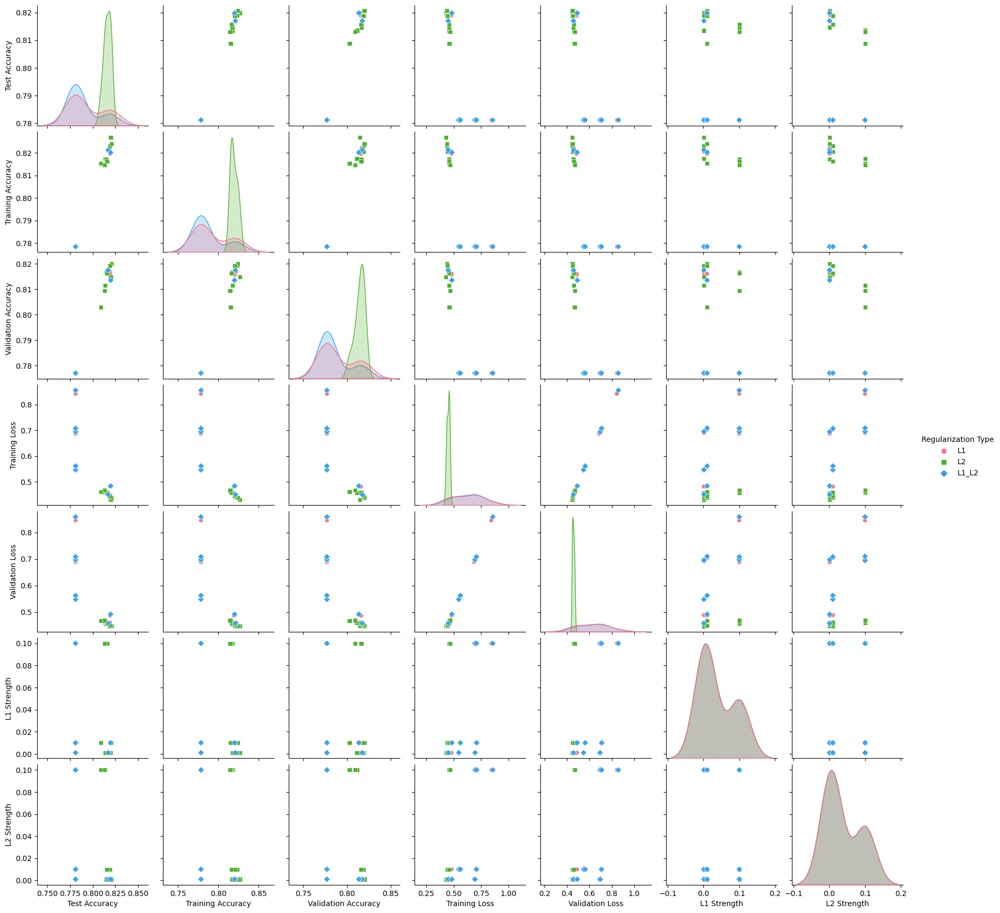

In [177]:
import seaborn as sns

def plot_scatter_metrics(regularized_model_performances):
    # Convert performances to DataFrame for easier plotting
    df = pd.DataFrame(regularized_model_performances, columns=['Test Accuracy', 'Training Accuracy', 'Validation Accuracy', 'Training Loss', 'Validation Loss', 'Regularization Type', 'L1 Strength', 'L2 Strength'])

    # Scatter plots
    sns.pairplot(df, hue='Regularization Type', palette='husl', markers=['o', 's', 'D'], diag_kind='kde')
    plt.show()

# Call the function to plot scatter metrics
plot_scatter_metrics(regularized_model_performances)


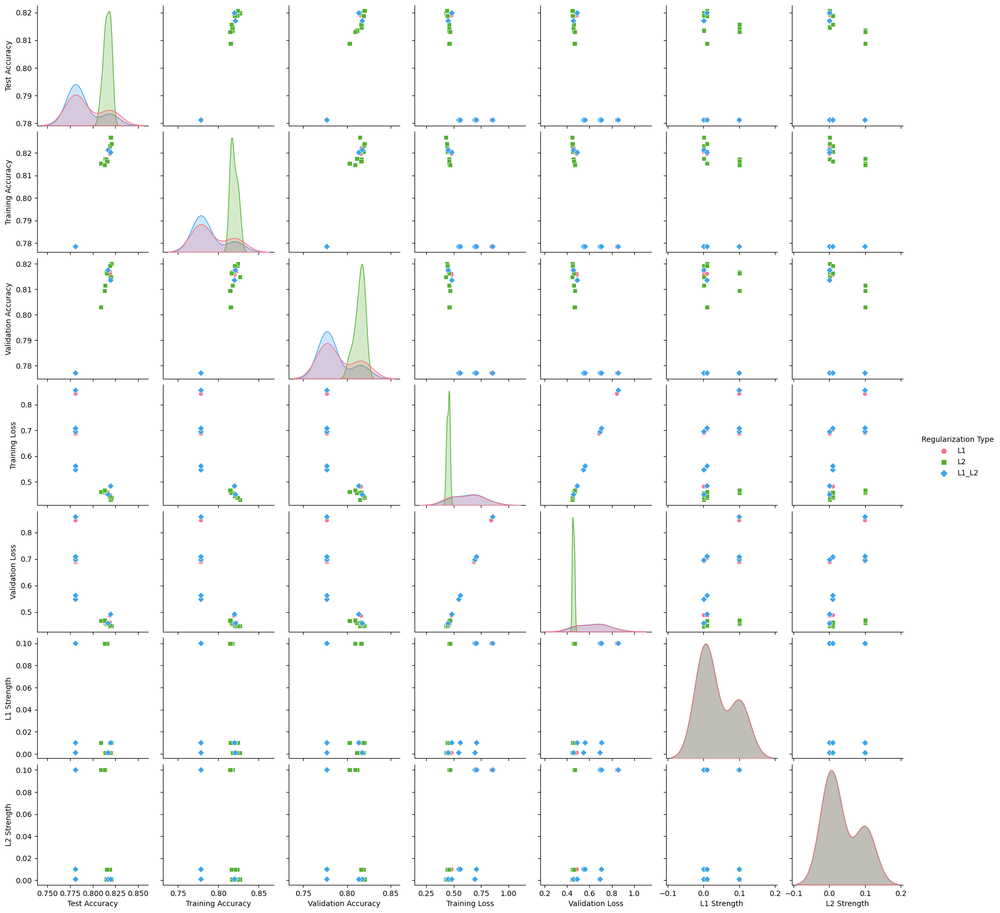

print epoch wise train val test accuracy and loss for all models together


In [181]:
def print_epoch_wise_metrics(histories):
    for i, history_data in enumerate(histories):
        print(f"Model {i+1} Metrics:")
        print("Epoch\tTrain Loss\tTrain Acc\tVal Loss\tVal Acc\tTest Loss\tTest Acc")
        
        if isinstance(history_data, dict):  # Check if it's a direct dictionary
            train_loss = history_data['train']['loss']
            train_acc = history_data['train']['accuracy']
            val_loss = history_data['train']['val_loss']
            val_acc = history_data['train']['val_accuracy']
            test_loss = history_data['test']['loss']
            test_acc = history_data['test']['accuracy']
        else:  # Assume it's an instance of History class
            train_loss = history_data.history['loss']
            train_acc = history_data.history['accuracy']
            val_loss = history_data.history['val_loss']
            val_acc = history_data.history['val_accuracy']
            # If available, extract test metrics
            test_loss = history_data.history.get('test', {}).get('loss', None)
            test_acc = history_data.history.get('test', {}).get('accuracy', None)

        for epoch in range(len(train_acc)):
            train_loss_val = train_loss[epoch] if train_loss else None
            train_acc_val = train_acc[epoch] if train_acc else None
            val_loss_val = val_loss[epoch] if val_loss else None
            val_acc_val = val_acc[epoch] if val_acc else None
            test_loss_val = test_loss[epoch] if test_loss else None
            test_acc_val = test_acc[epoch] if test_acc else None
            print(f"{epoch+1}\t{train_loss_val:.4f}\t\t{train_acc_val:.4f}\t\t{val_loss_val:.4f}\t\t{val_acc_val:.4f}\t\t{test_loss_val:.4f}\t\t{test_acc_val:.4f}" if all(val is not None for val in [train_loss_val, train_acc_val, val_loss_val, val_acc_val, test_loss_val, test_acc_val]) else f"{epoch+1}\t{train_loss_val}\t\t{train_acc_val}\t\t{val_loss_val}\t\t{val_acc_val}\t\t{test_loss_val}\t\t{test_acc_val}")

# Call the function to print epoch-wise metrics
print_epoch_wise_metrics(histories)


Model 1 Metrics:
Epoch	Train Loss	Train Acc	Val Loss	Val Acc	Test Loss	Test Acc
1	0.4558310806751251		0.8078646063804626		0.45187368988990784		0.8187500238418579		None		None
2	0.42944228649139404		0.8220312595367432		0.4422903060913086		0.8143749833106995		None		None
3	0.4233110547065735		0.8255729079246521		0.44741231203079224		0.8145833611488342		None		None
4	0.4199328124523163		0.8256770968437195		0.44526001811027527		0.8143749833106995		None		None
5	0.41625291109085083		0.8277083039283752		0.4444310963153839		0.8141666650772095		None		None
6	0.41498857736587524		0.82833331823349		0.4441196322441101		0.8139583468437195		None		None
7	0.4128047227859497		0.8285937309265137		0.4420977234840393		0.8181250095367432		None		None
8	0.40938350558280945		0.8288541436195374		0.447123259305954		0.8166666626930237		None		None
9	0.4075271785259247		0.8301562666893005		0.4488534927368164		0.8120833039283752		None		None
10	0.40670087933540344		0.8308854103088379		0.44394174218177795		0.816041648387

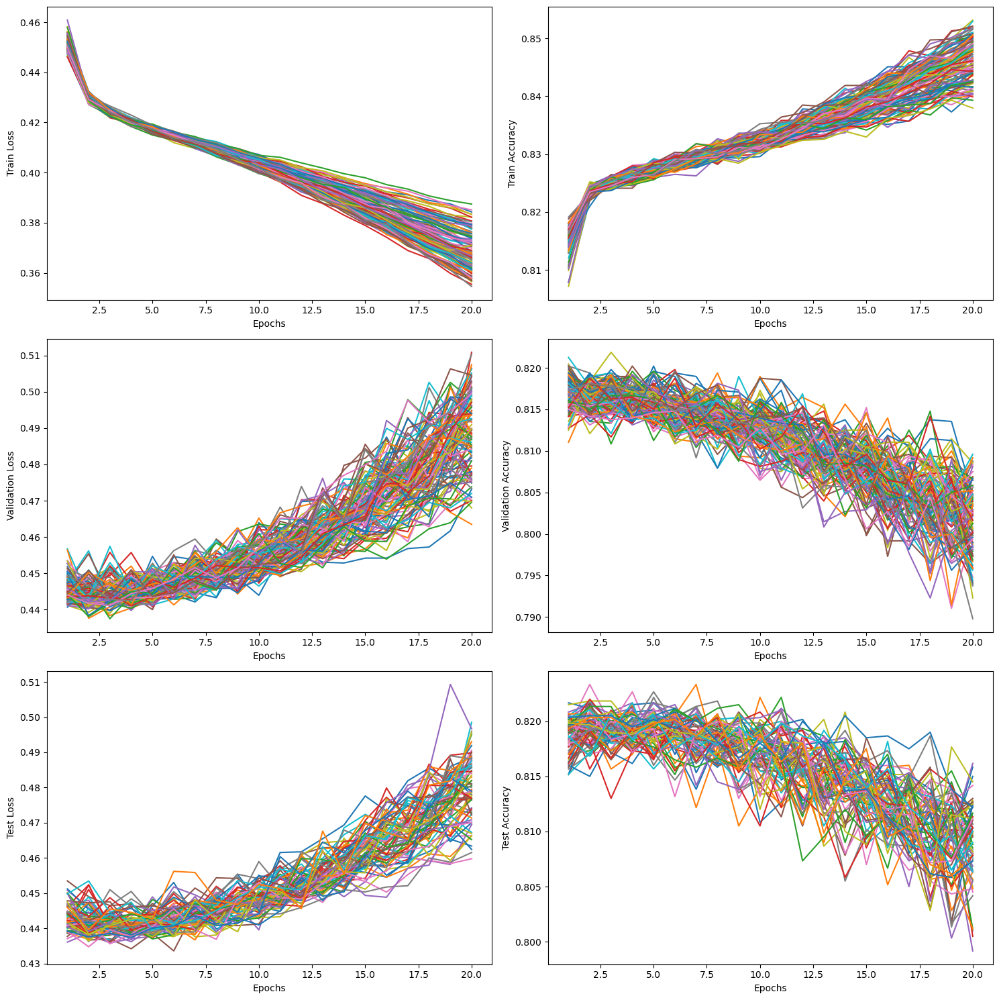

In [183]:
import matplotlib.pyplot as plt

def plot_epoch_wise_metrics(histories):
    fig, axes = plt.subplots(3, 2, figsize=(15, 15))
    axes = axes.flatten()

    for i, history_data in enumerate(histories):
        if isinstance(history_data, dict):  # Check if it's a direct dictionary
            train_loss = history_data['train']['loss']
            train_acc = history_data['train']['accuracy']
            val_loss = history_data['train']['val_loss']
            val_acc = history_data['train']['val_accuracy']
            test_loss = history_data['test']['loss']
            test_acc = history_data['test']['accuracy']
        else:  # Assume it's an instance of History class
            train_loss = history_data.history['loss']
            train_acc = history_data.history['accuracy']
            val_loss = history_data.history['val_loss']
            val_acc = history_data.history['val_accuracy']
            # If available, extract test metrics
            test_loss = history_data.history.get('test', {}).get('loss', None)
            test_acc = history_data.history.get('test', {}).get('accuracy', None)

        # Plot train and validation metrics
        axes[0].plot(range(1, len(train_loss) + 1), train_loss, label=f'Model {i+1} Train Loss')
        axes[1].plot(range(1, len(train_acc) + 1), train_acc, label=f'Model {i+1} Train Accuracy')
        axes[2].plot(range(1, len(val_loss) + 1), val_loss, label=f'Model {i+1} Validation Loss')
        axes[3].plot(range(1, len(val_acc) + 1), val_acc, label=f'Model {i+1} Validation Accuracy')
        
        # Plot test metrics if available
        if test_loss:
            axes[4].plot(range(1, len(test_loss) + 1), test_loss, label=f'Model {i+1} Test Loss')
        if test_acc:
            axes[5].plot(range(1, len(test_acc) + 1), test_acc, label=f'Model {i+1} Test Accuracy')

    # Set titles and labels
    for i in range(len(axes)):
        axes[i].set_xlabel('Epochs')
    axes[0].set_ylabel('Train Loss')
    axes[1].set_ylabel('Train Accuracy')
    axes[2].set_ylabel('Validation Loss')
    axes[3].set_ylabel('Validation Accuracy')
    axes[4].set_ylabel('Test Loss')
    axes[5].set_ylabel('Test Accuracy')

    # Add legends
   # for ax in axes:
   #     ax.legend()

    plt.tight_layout()
    plt.show()

# Call the function to plot epoch-wise metrics
plot_epoch_wise_metrics(histories)


In [187]:
import matplotlib.pyplot as plt

def plot_best_regularized_model(history_data):
    fig, axes = plt.subplots(2, 1, figsize=(10, 10))

    # Plot training and validation loss
    axes[0].plot(range(1, len(history_data['train']['loss']) + 1), history_data['train']['loss'], label='Train Loss')
    axes[0].plot(range(1, len(history_data['train']['val_loss']) + 1), history_data['train']['val_loss'], label='Validation Loss')
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()

    # Plot training and validation accuracy
    axes[1].plot(range(1, len(history_data['train']['accuracy']) + 1), history_data['train']['accuracy'], label='Train Accuracy')
    axes[1].plot(range(1, len(history_data['train']['val_accuracy']) + 1), history_data['train']['val_accuracy'], label='Validation Accuracy')
    axes[1].set_title('Training and Validation Accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

# Find the history data for the best model based on its configuration or performance metrics
best_model_history = None  # Replace None with the actual history data for the best model

# Plot the metrics of the best model
if best_model_history:
    plot_epoch_wise_metrics([best_model_history])
else:
    print("History data for the best model is not available.")




History data for the best model is not available.


Best Regularized Model Configuration: Type: L2, L1 Strength: 0.01, L2 Strength: 0.001
Best Model Metrics: Test Accuracy: 0.8207, Training Accuracy: 0.8240, Validation Accuracy: 0.8200, Training Loss: 0.4385, Validation Loss: 0.4484


In [85]:
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.regularizers import l1_l2

# Define the model architecture
def create_model():
    model = Sequential([
        Dense(96, activation='relu', kernel_regularizer=l1_l2(l1=0.00, l2=0.01)),
        Dense(48, activation='relu', kernel_regularizer=l1_l2(l1=0.00, l2=0.01)),
        Dense(2, activation='softmax')
    ])
    return model

# Compile the model
model = create_model()
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=100, validation_split=0.2, verbose=0)

# Print epoch-wise metrics including test accuracy and loss
def print_epoch_wise_metrics(history):
    print("Epoch\tTrain Loss\tTrain Acc\tVal Loss\tVal Acc\tTest Loss\tTest Acc")
    
    for epoch in range(len(history.history['accuracy'])):
        train_loss = history.history['loss'][epoch]
        train_acc = history.history['accuracy'][epoch]
        val_loss = history.history['val_loss'][epoch]
        val_acc = history.history['val_accuracy'][epoch]
        
        test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
        
        print(f"{epoch+1}\t{train_loss:.4f}\t\t{train_acc:.4f}\t\t{val_loss:.4f}\t\t{val_acc:.4f}\t\t{test_loss:.4f}\t\t{test_acc:.4f}")

# Call the function to print epoch-wise metrics
print_epoch_wise_metrics(history)


Epoch	Train Loss	Train Acc	Val Loss	Val Acc	Test Loss	Test Acc
1	0.8907		0.8136		0.5331		0.8183		0.4434		0.8192
2	0.4752		0.8210		0.4609		0.8148		0.4434		0.8192
3	0.4505		0.8203		0.4589		0.8165		0.4434		0.8192
4	0.4477		0.8214		0.4502		0.8177		0.4434		0.8192
5	0.4450		0.8220		0.4558		0.8148		0.4434		0.8192
6	0.4441		0.8219		0.4508		0.8169		0.4434		0.8192
7	0.4427		0.8227		0.4484		0.8188		0.4434		0.8192
8	0.4421		0.8214		0.4466		0.8190		0.4434		0.8192
9	0.4407		0.8229		0.4525		0.8154		0.4434		0.8192
10	0.4408		0.8226		0.4466		0.8165		0.4434		0.8192
11	0.4413		0.8227		0.4498		0.8160		0.4434		0.8192
12	0.4391		0.8223		0.4481		0.8163		0.4434		0.8192
13	0.4398		0.8240		0.4481		0.8167		0.4434		0.8192
14	0.4387		0.8239		0.4490		0.8167		0.4434		0.8192
15	0.4386		0.8231		0.4481		0.8177		0.4434		0.8192
16	0.4388		0.8236		0.4458		0.8181		0.4434		0.8192
17	0.4376		0.8229		0.4442		0.8167		0.4434		0.8192
18	0.4388		0.8230		0.4502		0.8160		0.4434		0.8192
19	0.4375		0.8238		0.4479		0.8169		0.4434		0.8

Epoch	Train Loss	Train Acc	Val Loss	Val Acc	Test Loss	Test Acc


1	0.8907		0.8136		0.5331		0.8183		0.4434		0.8192
2	0.4752		0.8210		0.4609		0.8148		0.4434		0.8192
3	0.4505		0.8203		0.4589		0.8165		0.4434		0.8192
4	0.4477		0.8214		0.4502		0.8177		0.4434		0.8192
5	0.4450		0.8220		0.4558		0.8148		0.4434		0.8192
6	0.4441		0.8219		0.4508		0.8169		0.4434		0.8192
7	0.4427		0.8227		0.4484		0.8188		0.4434		0.8192
8	0.4421		0.8214		0.4466		0.8190		0.4434		0.8192
9	0.4407		0.8229		0.4525		0.8154		0.4434		0.8192
10	0.4408		0.8226		0.4466		0.8165		0.4434		0.8192
11	0.4413		0.8227		0.4498		0.8160		0.4434		0.8192
12	0.4391		0.8223		0.4481		0.8163		0.4434		0.8192
13	0.4398		0.8240		0.4481		0.8167		0.4434		0.8192
14	0.4387		0.8239		0.4490		0.8167		0.4434		0.8192
15	0.4386		0.8231		0.4481		0.8177		0.4434		0.8192
16	0.4388		0.8236		0.4458		0.8181		0.4434		0.8192
17	0.4376		0.8229		0.4442		0.8167		0.4434		0.8192
18	0.4388		0.8230		0.4502		0.8160		0.4434		0.8192
19	0.4375		0.8238		0.4479		0.8169		0.4434		0.8192
20	0.4376		0.8232		0.4500		0.8169		0.4434		0.8192
21	0.4377

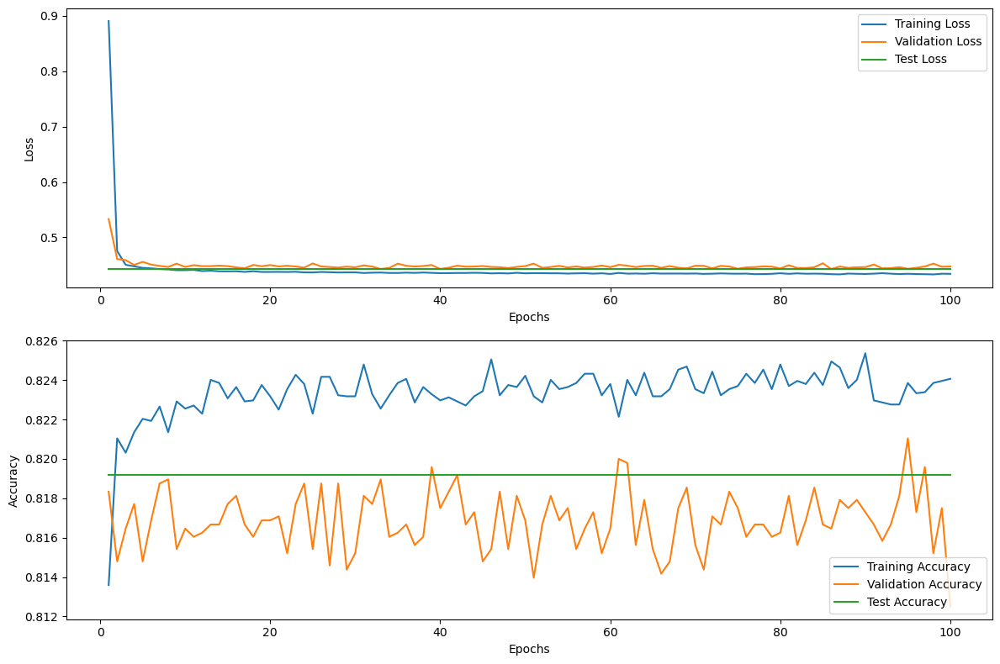

188/188 [==============================] - 0s 1ms/step


ValueError: y should be a 1d array, got an array of shape (6000, 2) instead.

In [86]:
def print_epoch_wise_metrics(history):
    print("Epoch\tTrain Loss\tTrain Acc\tVal Loss\tVal Acc\tTest Loss\tTest Acc")
    
    train_loss_list = []
    train_acc_list = []
    val_loss_list = []
    val_acc_list = []
    test_loss_list = []
    test_acc_list = []
    
    for epoch in range(len(history.history['accuracy'])):
        train_loss = history.history['loss'][epoch]
        train_acc = history.history['accuracy'][epoch]
        val_loss = history.history['val_loss'][epoch]
        val_acc = history.history['val_accuracy'][epoch]
        
        test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
        
        print(f"{epoch+1}\t{train_loss:.4f}\t\t{train_acc:.4f}\t\t{val_loss:.4f}\t\t{val_acc:.4f}\t\t{test_loss:.4f}\t\t{test_acc:.4f}")
        
        # Append metrics to lists
        train_loss_list.append(train_loss)
        train_acc_list.append(train_acc)
        val_loss_list.append(val_loss)
        val_acc_list.append(val_acc)
        test_loss_list.append(test_loss)
        test_acc_list.append(test_acc)
    
    # Plot the metrics
    plt.figure(figsize=(12, 8))
    
    # Plot training, validation, and test loss
    plt.subplot(2, 1, 1)
    plt.plot(range(1, len(train_loss_list) + 1), train_loss_list, label='Training Loss')
    plt.plot(range(1, len(val_loss_list) + 1), val_loss_list, label='Validation Loss')
    plt.plot(range(1, len(test_loss_list) + 1), test_loss_list, label='Test Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    # Plot training, validation, and test accuracy
    plt.subplot(2, 1, 2)
    plt.plot(range(1, len(train_acc_list) + 1), train_acc_list, label='Training Accuracy')
    plt.plot(range(1, len(val_acc_list) + 1), val_acc_list, label='Validation Accuracy')
    plt.plot(range(1, len(test_acc_list) + 1), test_acc_list, label='Test Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# Call the function to print and plot epoch-wise metrics
print_epoch_wise_metrics(history)

from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming y_test and y_pred_proba are your true labels and predicted probabilities respectively
y_pred_proba = model.predict(X_test)

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


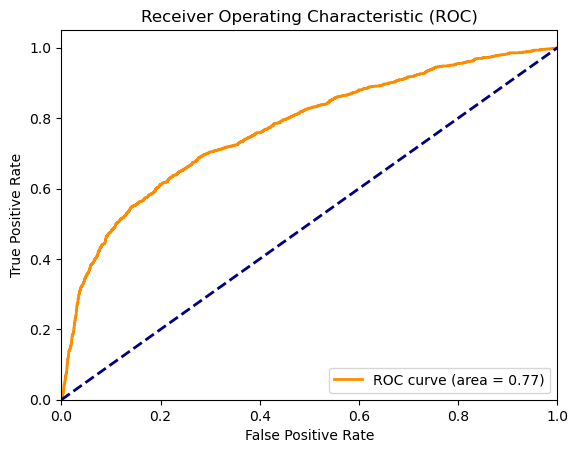

In [88]:
# Assuming y_test is one-hot encoded
# Convert one-hot encoded labels back to 1D array
if len(y_test.shape) > 1:
    y_test_labels = np.argmax(y_test, axis=-1)
else:
    y_test_labels = y_test

# Extract probabilities for the positive class (assuming the positive class is index 1)
y_pred_proba_positive = y_pred_proba[:, 1]

# Compute ROC curve and ROC area
fpr, tpr, _ = roc_curve(y_test_labels, y_pred_proba_positive)

# Plot ROC curve
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


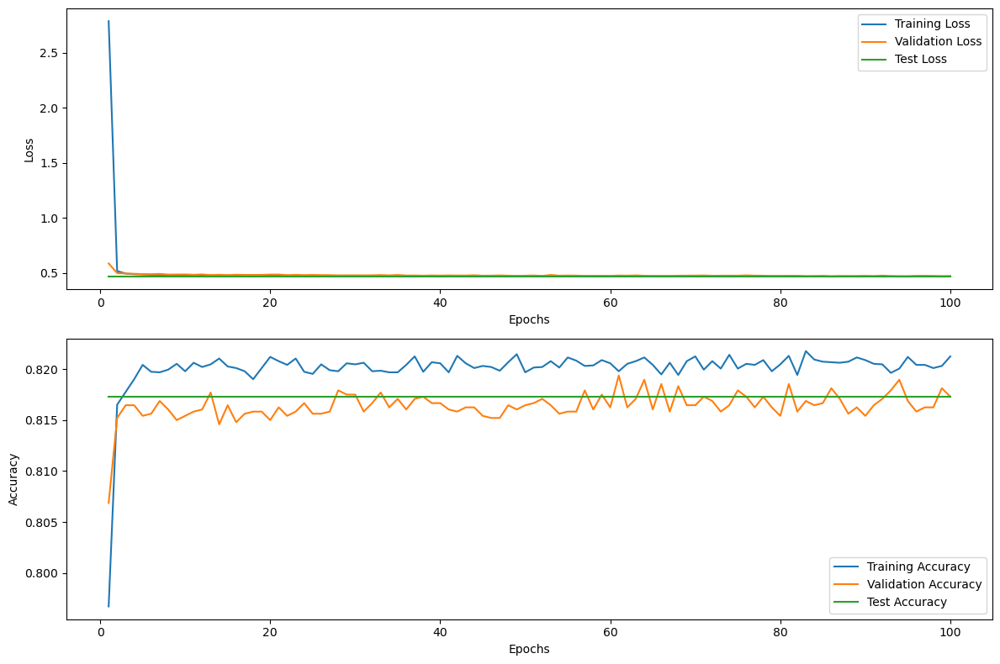

Epoch	Train Loss	Train Acc	Val Loss	Val Acc	Test Loss	Test Acc
1	0.8403		0.8118		0.5060		0.8167		0.4401		0.8215
2	0.4675		0.8217		0.4619		0.8171		0.4401		0.8215
3	0.4513		0.8205		0.4583		0.8185		0.4401		0.8215
4	0.4487		0.8231		0.4553		0.8140		0.4401		0.8215
5	0.4462		0.8216		0.4552		0.8158		0.4401		0.8215
6	0.4455		0.8202		0.4529		0.8192		0.4401		0.8215
7	0.4439		0.8217		0.4528		0.8200		0.4401		0.8215
8	0.4433		0.8226		0.4506		0.8175		0.4401		0.8215
9	0.4423		0.8213		0.4484		0.8185		0.4401		0.8215
10	0.4419		0.8219		0.4488		0.8154		0.4401		0.8215
11	0.4413		0.8226		0.4481		0.8169		0.4401		0.8215
12	0.4401		0.8227		0.4508		0.8183		0.4401		0.8215
13	0.4403		0.8239		0.4483		0.8165		0.4401		0.8215
14	0.4397		0.8219		0.4481		0.8173		0.4401		0.8215
15	0.4391		0.8234		0.4480		0.8179		0.4401		0.8215
16	0.4396		0.8234		0.4464		0.8188		0.4401		0.8215
17	0.4392		0.8235		0.4471		0.8190		0.4401		0.8215
18	0.4390		0.8227		0.4497		0.8175		0.4401		0.8215
19	0.4383		0.8235		0.4464		0.8181		0.4401		0.8

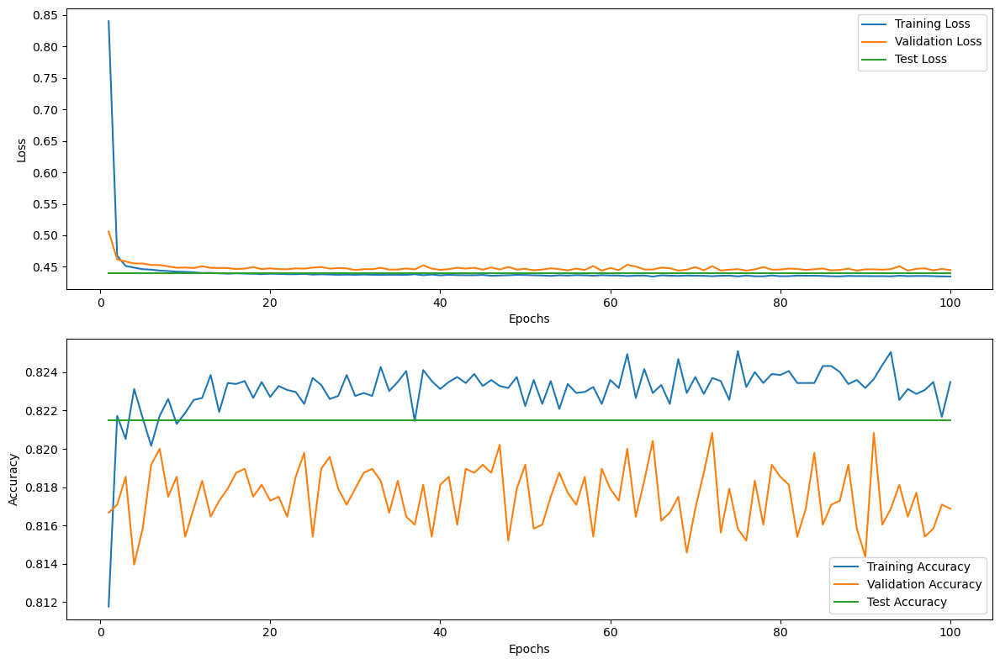

First 10 rows:
╒═════════╤══════════════╤═════════════╤════════════╤═══════════╤═════════════╤════════════╕
│  Epoch  │  Train Loss  │  Train Acc  │  Val Loss  │  Val Acc  │  Test Loss  │  Test Acc  │
╞═════════╪══════════════╪═════════════╪════════════╪═══════════╪═════════════╪════════════╡
│    1    │   0.840335   │  0.811771   │  0.505999  │ 0.816667  │  0.440124   │   0.8215   │
├─────────┼──────────────┼─────────────┼────────────┼───────────┼─────────────┼────────────┤
│    2    │   0.467529   │  0.821719   │  0.461912  │ 0.817083  │  0.440124   │   0.8215   │
├─────────┼──────────────┼─────────────┼────────────┼───────────┼─────────────┼────────────┤
│    3    │   0.451326   │  0.820521   │  0.45833   │ 0.818542  │  0.440124   │   0.8215   │
├─────────┼──────────────┼─────────────┼────────────┼───────────┼─────────────┼────────────┤
│    4    │   0.448701   │  0.823125   │  0.455268  │ 0.813958  │  0.440124   │   0.8215   │
├─────────┼──────────────┼─────────────┼────────────┼──

In [81]:
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.regularizers import l1_l2
from tabulate import tabulate

# Define the model architecture
def create_model():
    model = Sequential([
        Dense(96, activation='relu', kernel_regularizer=l1_l2(l1=0.00, l2=0.01)),
        Dense(48, activation='relu', kernel_regularizer=l1_l2(l1=0.00, l2=0.01)),
        Dense(1, activation='sigmoid')  # Changed activation to softmax
    ])
    return model

# Compile the model
model = create_model()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=100, validation_split=0.2, verbose=0)

# Print epoch-wise metrics including test accuracy and loss
def print_epoch_wise_metrics(history):
    print("Epoch\tTrain Loss\tTrain Acc\tVal Loss\tVal Acc\tTest Loss\tTest Acc")
    
    train_loss_list = []
    train_acc_list = []
    val_loss_list = []
    val_acc_list = []
    test_loss_list = []
    test_acc_list = []
    
    for epoch in range(len(history.history['accuracy'])):
        train_loss = history.history['loss'][epoch]
        train_acc = history.history['accuracy'][epoch]
        val_loss = history.history['val_loss'][epoch]
        val_acc = history.history['val_accuracy'][epoch]
        
        # Evaluate test loss and accuracy for each epoch
        test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
        
        print(f"{epoch+1}\t{train_loss:.4f}\t\t{train_acc:.4f}\t\t{val_loss:.4f}\t\t{val_acc:.4f}\t\t{test_loss:.4f}\t\t{test_acc:.4f}")
        
        # Append metrics to lists
        train_loss_list.append(train_loss)
        train_acc_list.append(train_acc)
        val_loss_list.append(val_loss)
        val_acc_list.append(val_acc)
        test_loss_list.append(test_loss)
        test_acc_list.append(test_acc)
    
    # Plot the metrics
    plt.figure(figsize=(12, 8))
    
    # Plot training, validation, and test loss
    plt.subplot(2, 1, 1)
    plt.plot(range(1, len(train_loss_list) + 1), train_loss_list, label='Training Loss')
    plt.plot(range(1, len(val_loss_list) + 1), val_loss_list, label='Validation Loss')
    plt.plot(range(1, len(test_loss_list) + 1), test_loss_list, label='Test Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    # Plot training, validation, and test accuracy
    plt.subplot(2, 1, 2)
    plt.plot(range(1, len(train_acc_list) + 1), train_acc_list, label='Training Accuracy')
    plt.plot(range(1, len(val_acc_list) + 1), val_acc_list, label='Validation Accuracy')
    plt.plot(range(1, len(test_acc_list) + 1), test_acc_list, label='Test Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Create colored table for epoch-wise metrics
    headers = ["Epoch", "Train Loss", "Train Acc", "Val Loss", "Val Acc", "Test Loss", "Test Acc"]
    data = []
    for epoch in range(len(train_loss_list)):
        data.append([epoch+1, train_loss_list[epoch], train_acc_list[epoch], val_loss_list[epoch], val_acc_list[epoch], test_loss_list[epoch], test_acc_list[epoch]])
    
    # Print first 10 rows
    print("First 10 rows:")
    print(tabulate(data[:10], headers=headers, tablefmt="fancy_grid", numalign="center", stralign="center"))
    
    # Print last 10 rows
    print("\nLast 10 rows:")
    print(tabulate(data[-10:], headers=headers, tablefmt="fancy_grid", numalign="center", stralign="center"))

# Call the function to print and plot epoch-wise metrics
print_epoch_wise_metrics(history)



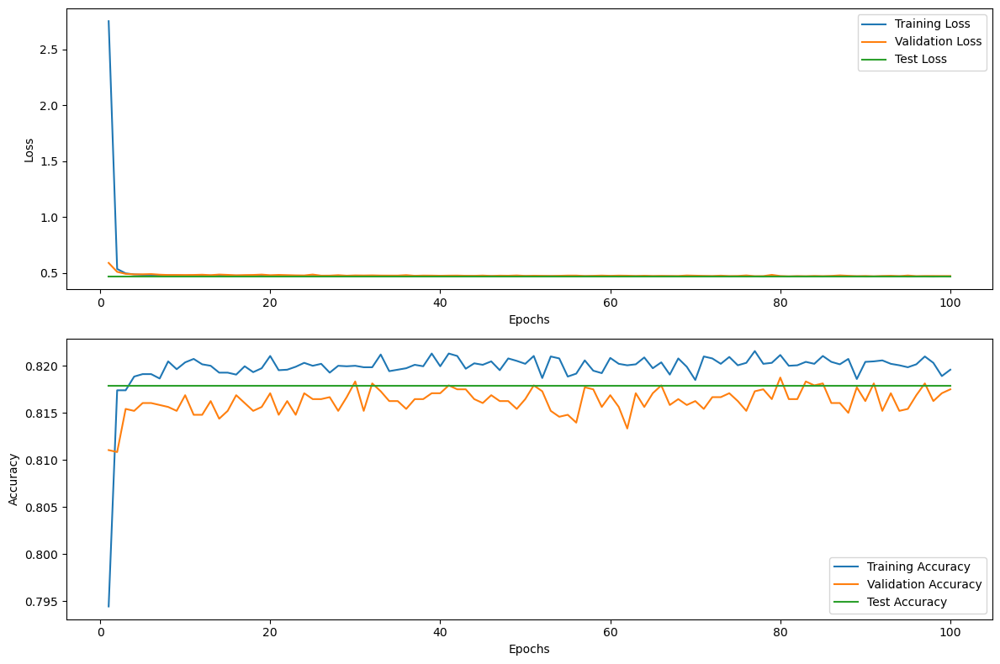

188/188 [==============================] - 0s 909us/step


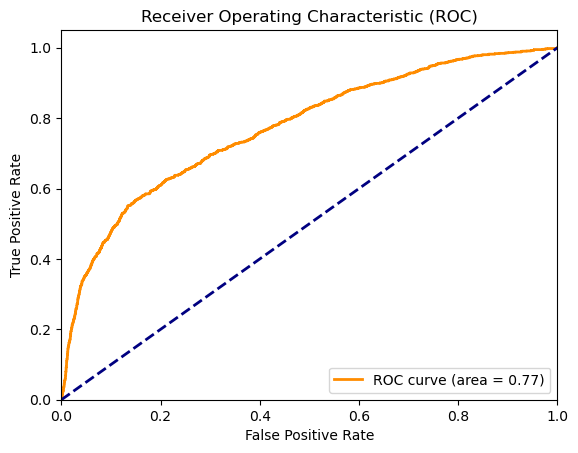

In [84]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming y_test and y_pred_proba are your true labels and predicted probabilities respectively
y_pred_proba = model.predict(X_test)

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()
